In [22]:
!pip install seaborn
#!conda install conda-forge::ngspice=34.0 -y
#!conda install -c conda-forge python-graphviz -y
#!pip install -U "ray[data,train,tune,serve]"

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torcheval.metrics import R2Score, MeanSquaredError
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay

from PySpice.Spice.Netlist import Circuit
from PySpice.Unit import *
from scipy.integrate import solve_ivp
from torchviz import make_dot
from torchview import draw_graph
from scipy.signal import savgol_filter
from scipy import signal
from PySpice.Spice.NgSpice.Shared import NgSpiceShared
NgSpiceShared.library_path = "/opt/homebrew/Cellar/libngspice/44.2/lib/libngspice.dylib"
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
import schemdraw
import schemdraw.elements as elm
import ray
from ray import tune
from ray.air import session  
from ray.tune.search.hyperopt import HyperOptSearch
from ray.tune.search.optuna import OptunaSearch
from optuna.samplers import TPESampler
from ray.tune.schedulers import ASHAScheduler,  MedianStoppingRule
from pathlib import Path
import hyperopt


# Original architecture.

In [2]:
def plot_nn_computational_graph(model, input_tensor):
    """
    Visualizes the computational graph of a PyTorch model using torchviz.
    
    Args:
        model (nn.Module): The PyTorch model
        input_tensor (torch.Tensor): Example input tensor
    """
   
    output = model(input_tensor.to("mps"))
    dot = make_dot(output, params=dict(model.named_parameters()))
    dot.render('nn_graph', format='png', cleanup=True)
    return dot

class swish_activation(nn.Module):
    def forward(self, x):
        return x*torch.sigmoid(x)
def swish_penalty(x):
    act=swish_activation().forward(-x)
    if act<=0:
        act=0
    return act
class FCN(nn.Module):
    "Defines a standard fully-connected network in PyTorch"
    
    def __init__(self, N_INPUT, N_OUTPUT, N_HIDDEN, N_LAYERS):
        super().__init__()
        activation = nn.Tanh
        #activation = swish_activation
        self.fcs = nn.Sequential(*[
                        nn.Linear(N_INPUT, N_HIDDEN),
                        activation()])
        self.fch = nn.Sequential(*[
                        nn.Sequential(*[
                            nn.Linear(N_HIDDEN, N_HIDDEN),
                            activation()]) for _ in range(N_LAYERS-1)])
        self.fce = nn.Linear(N_HIDDEN, N_OUTPUT)

    def forward(self, x):
        x = self.fcs(x)
        x = self.fch(x)
        x = self.fce(x)
        return x

def quadratic_penalty(x, x0, x1):
    # Penalty for being below x0
    lower_penalty = torch.relu(x0 - x)**2
    # Penalty for being above x1
    upper_penalty = torch.relu(x - x1)**2
    return lower_penalty + upper_penalty

## Original article example


In [ ]:
def exact_solution(w0,t):
    "Defines the exact analytical solution "
    u = t - (torch.exp((t-1)/w0) - np.exp(-1/w0))/(1-np.exp(-1/w0))
    return u

In [ ]:
torch.manual_seed(7777)

noise = 0.01
w0=0.15

print(f"The true value of dissipation = {w0}")
t_obs = torch.rand(40).view(-1,1)
u_obs = exact_solution(w0, t_obs) + noise*torch.randn_like(t_obs)
# for further testing once trained .....
t_test = torch.linspace(0,1,300).view(-1,1)
u_exact = exact_solution(w0, t_test)
plt.figure()
plt.title("Noisy observational data")
plt.scatter(t_obs[:,0], u_obs[:,0], color="orange")
t_test, u_exact = torch.linspace(0,1,300).view(-1,1), exact_solution(w0, t_test)
plt.plot(t_test[:,0], u_exact[:,0], label="Exact solution", color="tab:blue", alpha=0.6)
plt.xlabel("X")
plt.ylabel("Solution")
plt.show()

In [ ]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(0,1,33).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)

# train the PINN ............

# treat mu as a learnable parameter ......
# ..............
mu = torch.nn.Parameter(torch.zeros(1, requires_grad=True))
mus = []

# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam(list(pinn.parameters())+[mu],lr=1e-3)
for i in range(40001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    lambda1 = 1e4
    
    # compute physics loss ..................
    u = pinn(t_physics)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0]
    d2udt2 = torch.autograd.grad(dudt, t_physics, torch.ones_like(dudt), create_graph=True)[0]
    loss1 = torch.mean((dudt - mu* d2udt2 - 1)**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(t_obs)
    loss2 = torch.mean((u - u_obs)**2)
    
    # backpropagate joint loss, take optimiser step
    loss = loss1 + lambda1*loss2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus.append(mu.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(6,2.5))
        plt.scatter(t_obs[:,0], u_obs[:,0], s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()
        
plt.figure()
plt.title("Inverse problem - discover $\mu$ value")
plt.plot(mus, label="PINN estimate", color='red')
plt.hlines(w0, 0, len(mus), label="True value", color="tab:blue")
plt.legend()
plt.xlabel("Training step")
plt.show()
print(f"The final predicted value of mu is =")
print(mus[20000])

## Simple wall simulation 

### Single layer wall scheme 




    Voltage Source → Resistor R₁ → Node V₁ 
                                    │                     
                                    C₁                   
                                    │                   
                                    GND                   
### RC Circuit Differential Equation

#### General Form

The voltage $V_C(t)$ across the capacitor is governed by:

$$
\frac{dV_C(t)}{dt} + \frac{1}{RC}V_C(t) = \frac{V_{in}(t)}{RC}
$$

#### Parameters

- $V_C(t)$: Capacitor voltage (output)
- $V_{in}(t)$: Input voltage source
- $R$: Resistance [Ω]
- $C$: Capacitance [F]
- $\tau = RC$: Time constant [s]


#### circuit simulation 

Node name 'in' is a Python keyword
Unsupported Ngspice version 44


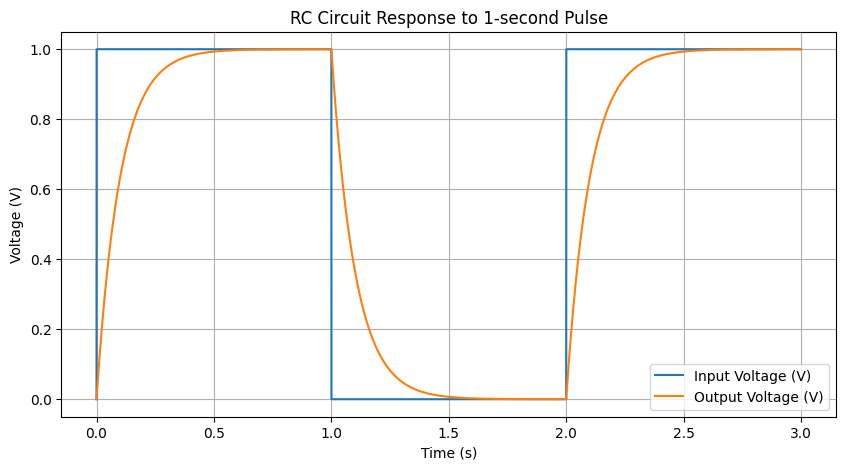

In [72]:

# Create a circuit
circuit = Circuit('RC Circuit')

# Add components
circuit.V('input', 'in', circuit.gnd, 'PULSE(0 1 0 1n 1n 1 2)')  # 1V pulse for 1 second
circuit.R('1', 'in', 'out', 10@u_kΩ)  # 10kΩ resistor
circuit.C('1', 'out', circuit.gnd, 10@u_uF)  # 10μF capacitor
# Simulation parameters
simulator = circuit.simulator(temperature=25, nominal_temperature=25)
analysis = simulator.transient(step_time=0.01@u_ms, end_time=3@u_s)

# Extract results
time = np.array(analysis.time)
input_voltage = np.array(analysis['in'])
output_voltage = np.array(analysis['out'])

# Plot results
plt.figure(figsize=(10, 5))
plt.plot(time, input_voltage, label='Input Voltage (V)')
plt.plot(time, output_voltage, label='Output Voltage (V)')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('RC Circuit Response to 1-second Pulse')
plt.grid(True)
plt.legend()
plt.show()

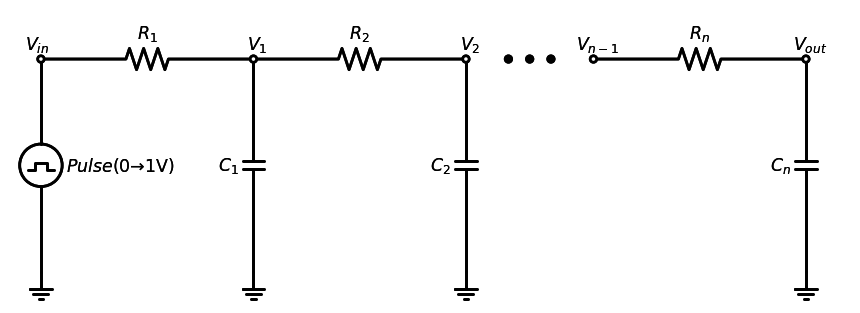

Circuit diagram saved as rc_circuit_n_st.pdf


In [70]:
def draw_rc_circuit(n=1,filename="rc_circuit.pdf"):
    """Draws the RC circuit figure with better labels and saves as vector PDF."""
    with schemdraw.Drawing(n=1,file=filename,unit=5) as d:
        # Voltage source
        d += elm.Ground()
        d += elm.SourcePulse().up().label(r'$Pulse$(0→1V)', loc='bottom', fontsize=14)
        d += (dot := elm.Dot(open=True))
        d += elm.Label().label(r'$V_{in}$', loc='right', fontsize=14)
        
        if n==1:

            # Resistor
            d += (r := elm.Resistor().right().label('R', loc='top', fontsize=14))

            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_{out}$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('C', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()
            # Close loop
            d += elm.Line().left().toy(r.start)
        elif n==2:
            # Resistor
            d += (r := elm.Resistor().right().label('$R_1$', loc='top', fontsize=14))

            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_1$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('$C_1$', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()
            

            # Resistor
            d += (r := elm.Resistor().right().label('$R_2$', loc='top', fontsize=14))
            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_{out}$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('$C_2$', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()
            # Close loop
            d += elm.Line().left().toy(r.start)
        else:
            # Resistor
            d += (r := elm.Resistor().right().label('$R_1$', loc='top', fontsize=14))

            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_1$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('$C_1$', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()
            

            # Resistor
            d += (r := elm.Resistor().right().label('$R_2$', loc='top', fontsize=14))
            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_2$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('$C_2$', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()

            d += elm.Line().right().length(1).color('white')
            d += elm.Dot( wire=False)  # left dot
            d += elm.Line().right().length(0.5).color('white')
            d += elm.Dot(wire=False)  # middle dot
            d += elm.Line().right().length(0.5).color('white')
            d += elm.Dot(wire=False)  # right dot
            d += elm.Line().right().length(1).color('white')
            d += elm.Dot(open= True, wire=False)  # right dot
            d += elm.Label().label('$V_{n-1}$', loc='top', fontsize=14)

            #Resistor
            d += (r := elm.Resistor().right().label('$R_n$', loc='top', fontsize=14))
            # Output node marker + label
            d += (dot := elm.Dot(open=True))
            d += elm.Label().label('$V_{out}$', loc='top', fontsize=14)

            # Capacitor to ground
            d.push()
            d += elm.Capacitor().down().label('$C_n$', loc='top', fontsize=14)
            d += elm.Ground()
            d.pop()

            # Close loop
            d += elm.Line().left().toy(r.start)        

    print(f"Circuit diagram saved as {filename}")

# Call function
draw_rc_circuit(n=4,filename="rc_circuit_n_st.pdf")

#### Diff eq simulation 

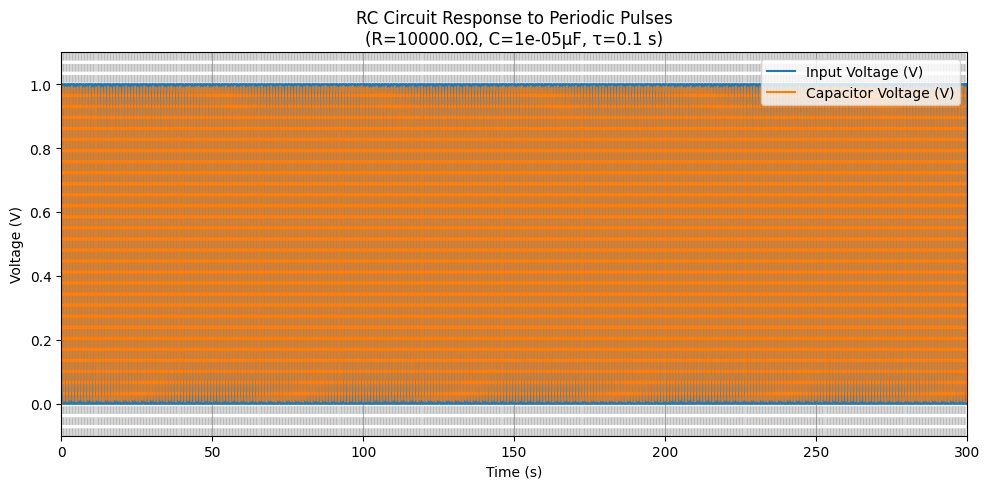

In [168]:

# Circuit parameters
R = 10e3          # Ohms
C = 10e-6          # Farads (10 μF)
tau = R * C        # Time constant (100 μs)
V_in_amp = 1.0     # Pulse amplitude (1V)
pulse_width = 0.5  # Pulse width (1s)
pulse_period = 1.0 # Pulse period (2s)

# Define the periodic input pulse function
def input_pulse(t):
    phase = t % pulse_period  # Modulo operation for periodicity
    return V_in_amp * (phase <= pulse_width)

# Differential equation
def rc_circuit(t, Vc):
    return (input_pulse(t) - Vc) / (R * C)

# Simulation time
t_start = 0.0
t_end = 300          # Simulate for 5 seconds to show multiple pulses
max_step = 2e-5  # Maximum step size

# Initial condition
Vc0 = [0.0]

# Solve
sol = solve_ivp(rc_circuit, 
                [t_start, t_end], 
                Vc0, 
                max_step=max_step,
                dense_output=True)

# Create time points
t_plot = np.linspace(t_start, t_end, 5000)
Vc_plot = sol.sol(t_plot)[0]
Vin_plot = np.array([input_pulse(t) for t in t_plot])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(t_plot, Vin_plot, label='Input Voltage (V)', linewidth=1.5)
plt.plot(t_plot, Vc_plot, label='Capacitor Voltage (V)', linewidth=1.5)

# Add vertical lines for pulse edges
for t in np.arange(0, t_end, pulse_period):
    plt.axvline(x=t, color='gray', linestyle='--', alpha=0.3)
    plt.axvline(x=t + pulse_width, color='gray', linestyle='--', alpha=0.3)

plt.title(f'RC Circuit Response to Periodic Pulses\n(R={R}Ω, C={C}μF, τ={tau} s)')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.grid(True)
plt.legend(loc='upper right')
plt.xlim([t_start, t_end])
plt.ylim([-0.1, 1.1])
plt.tight_layout()
plt.show()

In [ ]:
V0=Vc_plot[0]
V1_analytic = Vin_plot * (1 - np.exp(-t_plot/(R*C)))
plt.figure(figsize=(10, 5))
plt.plot(t_plot, Vin_plot, label='Input Voltage', linewidth=2, color='tab:blue')
plt.plot(t_plot, Vc_plot, label='First Stage (V1)', linewidth=2, color='tab:orange')
plt.plot(t_plot, V1_analytic, label='First Stage (V1) analitic',linestyle=':', linewidth=2, color='tab:orange')

# Add pulse markers
for t in np.arange(0, t_end, pulse_period):
    plt.axvline(x=t, color='gray', linestyle=':', alpha=0.5)
    plt.axvline(x=t + pulse_width, color='gray', linestyle=':', alpha=0.5)

plt.title('Two-Stage RC Filter Response\n'
          f'R1={R/1e3}kΩ, C1={C*1e6}μF\n'
          f'τ1={R*C:.3f}s')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.xlim([t_start, t_end])
plt.ylim([-0.1, 1.1])
plt.tight_layout()
plt.show()

#### Dataset generation

In [169]:
def sample_noisy_voltage(sol, n_samples, noise_lev=0.01, t_start=None, t_end=None):
    """
    Samples random points from EXISTING solution time points with added noise
    
    Args:
        sol: ODE solution object from solve_ivp (with .t and .y attributes)
        n_samples: Number of points to sample
        noise_lev: Noise scaling factor (std of Gaussian noise)
        t_start: Start time for sampling window (default: min(sol.t))
        t_end: End time for sampling window (default: max(sol.t))
    
    Returns:
        Tuple of (time_points, voltage_points) as torch Tensors
    """
    # Convert solution times to numpy array
    sol_times = sol.t
    
    # Determine time bounds
    t_min = t_start if t_start is not None else sol_times[0]
    t_max = t_end if t_end is not None else sol_times[-1]
    
    # Find indices within the specified time window
    valid_mask = (sol_times >= t_min) & (sol_times <= t_max)
    valid_times = sol_times[valid_mask]
    valid_voltage = sol.y[0][valid_mask]
    
    # Randomly select indices from the valid points
    if len(valid_times) < n_samples:
        raise ValueError(f"Only {len(valid_times)} points available in time window, but requested {n_samples}")
    
    rand_indices = np.random.choice(len(valid_times), size=n_samples, replace=False)
    
    # Convert to torch tensors
    sampled_t = torch.tensor(valid_times[rand_indices], dtype=torch.float32,device=device)
    sampled_v = torch.tensor(valid_voltage[rand_indices], dtype=torch.float32,device=device)
    
    # Add Gaussian noise
    noise = torch.randn(n_samples) * noise_lev
    noisy_v = sampled_v + noise.to(device)
    
    return sampled_t.view(-1,1), noisy_v.view(-1,1)



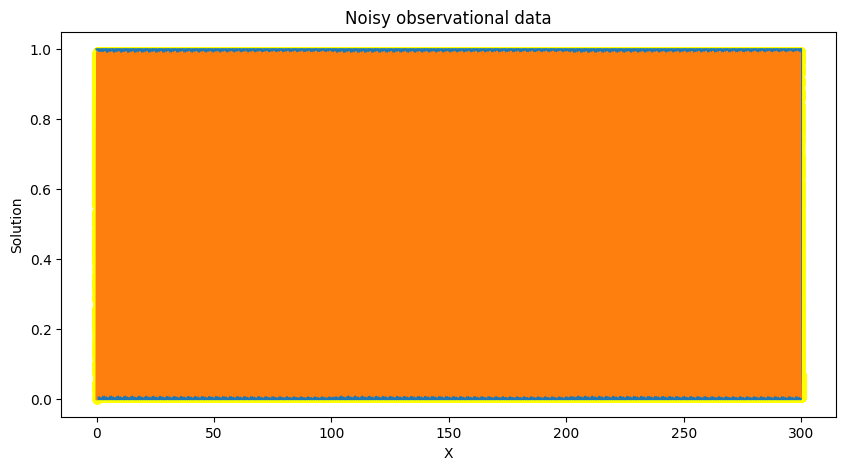

In [170]:
sampled_t, noisy_Vc = sample_noisy_voltage(sol, n_samples=600000,
                                           noise_lev=0.00000000000001,
                                           t_start=0, t_end=300)

plt.figure(figsize=(10, 5))
plt.title("Noisy observational data")
plt.scatter(sampled_t.cpu(), noisy_Vc.cpu(), label='sampled Vc+ noise', linewidth=1.5, color="yellow")
plt.plot(t_plot, Vin_plot, label='Input Voltage (V)', linewidth=1.5)
plt.plot(t_plot, Vc_plot, label='Capacitor Voltage (V)', linewidth=1.5)
plt.xlabel("X")
plt.ylabel("Solution")
plt.show()



In [ ]:
data= {
    't_samples': sampled_t.cpu().detach(),
    'v1_noisy': noisy_Vc.cpu().detach(),
    'input_signal': torch.tensor([input_pulse(t) for t in sampled_t.cpu().detach()], dtype=torch.float32, device='cpu').view(-1, 1),
    'R': torch.tensor([R], dtype=torch.float32, device='cpu'),
    'C': torch.tensor([C], dtype=torch.float32, device='cpu')
}
torch.save(data, 'nonoise_single.pt')

#### Training 

In [ ]:
ro.device

In [ ]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5)
pinn= pinn.to(device)  # Move model to the appropriate device

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60,device=device).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300,device=device).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)/10000) #reprecent C
mus = []
ro = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*10000) #represents R
ros = []
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-1)
losses1=[]
losses2=[]
# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [mu], 'lr': 1e-4},
    {'params': [ro,lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    loss1 = torch.mean((dudt*(ro * mu) + u- input_pulse(t_physics))**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(sampled_t)
    loss2 = torch.mean((u - noisy_Vc)**2)


    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1#+ lamda2 * mu_penalty**2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus.append(mu.item())
    ros.append(ro.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(sampled_t[:,0].cpu(), noisy_Vc[:,0].cpu(), s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.cpu().detach()[:,0], 
            torch.zeros_like(t_physics)[:,0].cpu(), s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0].cpu(), u[:,0].cpu(), label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C, 0, len(mus), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R, 0, len(ros), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus[-1]:.6f}, True = {C:.6f}, Error = {abs(mus[-1]-C)/C*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros[-1]:.6f}, True = {R:.6f}, Error = {abs(ros[-1]-R)/R*100:.2f}%")

In [ ]:
model_graph = draw_graph(
    pinn, 
    input_size=sampled_t.shape,  # Example input shape
    expand_nested=True,    # Show nested layers
    hide_inner_tensors=True,  # Skip backward-pass details
    hide_module_functions=True  # Show layer names
)
model_graph.visual_graph 

In [ ]:
plot_nn_computational_graph(pinn, sampled_t)

## Full single layer wall model

    Voltage Source → Resistor R₁/2 → Node V₁  → Resistor R₁/2
                                    │                     
                                    C₁                   
                                    │                   
                                    GND    

#### circuit simulation 

In [ ]:

# Create a circuit
circuit = Circuit('full SL-wall Circuit')

# Add components
circuit.V('input', 'in', circuit.gnd, 'PULSE(0 1 0 1n 1n 1 2)')  # 1V pulse for 1 second
circuit.R('1', 'in', 'v1', 5@u_kΩ)  # R₁
circuit.C('1', 'v1', circuit.gnd, 10@u_uF)  # C₁
circuit.R('2', 'v1', 'v2', 5@u_kΩ)  # R₂

# Simulation parameters
simulator = circuit.simulator(temperature=25, nominal_temperature=25)
analysis = simulator.transient(step_time=0.01@u_ms, end_time=3@u_s)

# Extract results
time = np.array(analysis.time)
input_voltage = np.array(analysis['in'])
v1_voltage = np.array(analysis['v1'])
output_voltage = np.array(analysis['v2'])

# Plot results
plt.figure(figsize=(10, 5))
plt.plot(time, input_voltage, label='Input Voltage (V)')
plt.plot(time, output_voltage, label='Output Voltage (V)')
plt.plot(time, v1_voltage, label='v1 Voltage (V)')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('RC Circuit Response to 1-second Pulse')
plt.grid(True)
plt.legend()
plt.show()

#### Diff eq simulation 

In [ ]:

# Corrected circuit parameters
R1 = 5e3          # 5kΩ
R2 = 5e3          # 10kΩ
C1 = 5e-6         # 5μF
V_in_amp = 1.0    # Pulse amplitude (1V)
pulse_width = 0.5 # Pulse width (0.5s)
pulse_period = 1 # Pulse period (1s)

def input_pulse(t):
    phase = t % pulse_period
    return V_in_amp * (phase <= pulse_width)

# CORRECTED SYSTEM OF ODEs
def rc_circuit(t, y):
    V1, V2 = y  # Unpack state variables
    
    # Current through R1
    i1 = (input_pulse(t) - V1)/R1
    # Current through R2
    i2 = (V1 - V2)/R2
    
    # CORRECTED Differential equations:
    dV1dt = i1/C1 - i2/C1  # Current into C1 minus current out

    
    return [dV1dt]

# Simulation parameters
t_start = 0.0
t_end = 6.0
max_step = 1e-4
y0 = [0.0, 0.0]

# Solve
sol = solve_ivp(rc_circuit, 
                [t_start, t_end], 
                y0, 
                method='RK45',
                max_step=max_step,
                dense_output=True)

# Plotting
t_plot = np.linspace(t_start, t_end, 5000)
V1_plot, V2_plot = sol.sol(t_plot)
Vin_plot = np.array([input_pulse(t) for t in t_plot])

plt.figure(figsize=(10, 5))
plt.plot(t_plot, Vin_plot, label='Input Voltage', linewidth=2, color='tab:blue')
plt.plot(t_plot, V1_plot, label='First Stage (V1)', linewidth=2, color='tab:orange')
plt.plot(t_plot, V2_plot, label='Second Stage (V2)', linewidth=2, color='tab:green')

# Add pulse markers
for t in np.arange(0, t_end, pulse_period):
    plt.axvline(x=t, color='gray', linestyle=':', alpha=0.5)
    plt.axvline(x=t + pulse_width, color='gray', linestyle=':', alpha=0.5)

plt.title('Two-Stage RC Filter Response\n'
          f'R1={R1/1e3}kΩ,R2={R2/1e3}kΩ, C1={C1*1e6}μF\n'
          f'τ1={R1*C1:.3f}s')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.xlim([t_start, t_end])
plt.ylim([-0.1, 1.1])
plt.tight_layout()
plt.show()

#### Dataset generation

In [ ]:
def sample_noisy_voltages(sol, n_samples, noise_lev=0.01, t_start=None, t_end=None):
    """
    Samples random points from EXISTING solution time points with added noise for both stages
    
    Args:
        sol: ODE solution object from solve_ivp (with .t and .y attributes)
        n_samples: Number of points to sample
        noise_lev: Noise scaling factor (std of Gaussian noise)
        t_start: Start time for sampling window (default: min(sol.t))
        t_end: End time for sampling window (default: max(sol.t))
    
    Returns:
        Tuple of (time_points, v1_points, v2_points) as torch Tensors
        All tensors have shape (n_samples, 1)
    """
    # Convert solution times to numpy array
    sol_times = sol.t
    
    # Determine time bounds
    t_min = t_start if t_start is not None else sol_times[0]
    t_max = t_end if t_end is not None else sol_times[-1]
    
    # Find indices within the specified time window
    valid_mask = (sol_times >= t_min) & (sol_times <= t_max)
    valid_times = sol_times[valid_mask]
    valid_v1 = sol.y[0][valid_mask]  # First stage voltage
    valid_v2 = sol.y[1][valid_mask]  # Second stage voltage
    
    # Randomly select indices from the valid points
    if len(valid_times) < n_samples:
        raise ValueError(f"Only {len(valid_times)} points available in time window, but requested {n_samples}")
    
    rand_indices = np.random.choice(len(valid_times), size=n_samples, replace=False)
    
    # Convert to torch tensors
    sampled_t = torch.tensor(valid_times[rand_indices], dtype=torch.float32)
    sampled_v1 = torch.tensor(valid_v1[rand_indices], dtype=torch.float32)
    sampled_v2 = torch.tensor(valid_v2[rand_indices], dtype=torch.float32)
    
    # Add independent Gaussian noise to each channel
    noise_v1 = torch.randn(n_samples) * noise_lev
    noise_v2 = torch.randn(n_samples) * noise_lev
    
    noisy_v1 = sampled_v1 + noise_v1
    noisy_v2 = sampled_v2 + noise_v2
    
    return (sampled_t.view(-1, 1), 
            noisy_v1.view(-1, 1), 
            noisy_v2.view(-1, 1))

In [ ]:
# Generate noisy samples
t_samples, v1_noisy, v2_noisy = sample_noisy_voltages(
    sol, 
    n_samples=500,
    noise_lev=0.00000000002,
    t_start=0.0,
    t_end=3
)

# Plot results
plt.figure(figsize=(12, 6))
plt.scatter(t_samples.detach(), v1_noisy.detach(), s=10, label='Noisy V1', alpha=0.6)
plt.scatter(t_samples.detach(), v2_noisy.detach(), s=10, label='Noisy V2', alpha=0.6)
plt.plot(sol.t, sol.y[0], label='True V1', color='tab:blue')
plt.plot(sol.t, sol.y[1], label='True V2', color='tab:orange')
plt.title('Noisy Measurements from Two-Stage Filter')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

#### Training 

In [ ]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,2,16,8)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,6,1000).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,150).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............

mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-6) #reprecent C # Near 5μF
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e4) #reprecent C # Near 5μF  # Near 5kΩ
lambda1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e4) 

#lambda1 = 1e6
lambda2 = 1e2
lambda3 = 1e1

mus1 = []
ros1 = []
losses1=[]
losses2=[]
''' 
R1 = 5e3 
C1 = 10e-6         # 5μF
'''
# Initialize best loss tracking
best_loss = float('inf')
best_model_state = None
best_epoch = 0

# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters(), 'lr': 1e-3},
    {'params': [mu1], 'lr': 1e-1},
    {'params': [ro1,lambda1], 'lr': 1e-1}
])
for i in range(160001):
    optimiser.zero_grad()
    
    # Physics loss
    u = pinn(t_physics)
    u1=u[:,1].view(-1,1)
    u2=u[:,0].view(-1,1)
    du1dt = torch.autograd.grad(u1, t_physics, torch.ones_like(u1), create_graph=True)[0]
    # d2u2dt2 = torch.autograd.grad(du2dt, t_physics, torch.ones_like(u2), create_graph=True)[0]
    loss1 =torch.mean((2*u1+ro1*mu1*du1dt/2+ u2- input_pulse(t_physics) )**2)
    # Current KL loss
    loss2a= torch.mean(((input_pulse(t_physics)-u1)/ro1 -(u1-u2)/ro1- mu1*du1dt)**2)
   # loss2b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)
    loss2=loss2a#+loss2b

    #lag linear aproximation 
    #output_penalty= torch.mean((torch.log(torch.abs(u1))-torch.log(torch.abs(u2))+t_physics *( mu1*ro1-mu2*ro2))**2)
    # Data loss
    u_pred = pinn(t_samples)
    loss4 = torch.mean((u_pred[:,1].view(-1,1) - v1_noisy )**2+ (u_pred[:,0].view(-1,1) - v2_noisy)**2)
    param_penalty = swish_penalty(mu1)+ swish_penalty(ro1)#+swish_penalty(mu2) +swish_penalty(ro2)
    # Combined loss
    
    loss = torch.sigmoid(lambda1)*loss4 +(1-torch.sigmoid(lambda1))*(loss2+loss1) + lambda2*param_penalty#+0.001*output_penalty 
    loss.backward()
    optimiser.step()
    
    # Record physical values
   
    mus1.append(mu1.item())
    ros1.append(ro1.item())
   
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    # Check for best model
    if loss.item() < best_loss:
        best_loss = loss.item()
        best_model_state = pinn.state_dict().copy()  # Deep copy of weights
        best_epoch = i
        print(f"New best model at epoch {i} with loss {best_loss:.6e}")
   
    #if i % 1000 == 0:
       # print(f"Gradients - mu1: {mu1.grad.norm():.2e}, ro1: {ro1.grad.norm():.2e}")
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].detach(), v2_noisy[:,0].detach(), s=30,label="Noisy observations v2", alpha=0.6, color="orange")
        plt.scatter(t_samples[:,0].detach(), v1_noisy[:,0].detach(), s=30,label="Noisy observations v1", alpha=0.6, color="blue")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.plot(t_test[:,0], u[:,1], label="PINN solution", color="tab:blue")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()
# After training, restore best model
pinn.load_state_dict(best_model_state)
print(f"Restored best model from epoch {best_epoch} with loss {best_loss:.6e}")

# Save the best model
torch.save({
    'epoch': best_epoch,
    'model_state_dict': pinn.state_dict(),
    'optimizer_state_dict': optimiser.state_dict(),
    'loss': best_loss,
}, 'best_pinn_two_nodes.pth')
plt.figure(figsize=(8, 6))

'''
# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ_1", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ_1", color="tab:blue", linestyle='--', linewidth=1.5)
plt.plot(mus2, label="PINN estimate for μ_2", color='green', linewidth=1.5)
plt.hlines(C2, 0, len(mus1), label="True μ_2", color="tab:purple", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ_1", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ_1", color="tab:purple", linestyle='--', linewidth=1.5)
plt.plot(ros2, label="PINN estimate for ρ_2", color='black', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ_2", color="tab:blue", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))
'''
# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final values
'''
print("\nFinal Parameter Estimates:")
print(f"μ_1 (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"μ_2 (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(f"ρ_1 (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")
print(f"ρ_2 (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")
print(rf"τ_1 (time constant): Predicted = {ros1[-1]*mus1[-1]:.6f}, True = {R1*C1:.6f}")
print(rf"τ_2 (tiem constant): Predicted = {ros2[-1]*mus2[-1]:.6f}, True = {R2*C2:.6f}")
'''
u_best = pinn(t_test).detach()
plt.figure(figsize=(10, 7))
plt.scatter(t_samples[:,0], v2_noisy[:,0], s=40, label="Noisy observations", alpha=0.7, color="orange")
plt.plot(t_test[:,0], u_best[:,0], lw=2.5, label="Best PINN", color="tab:red")
plt.title(f"Best Model: Epoch {best_epoch} | Loss: {best_loss:.2e}")
plt.xlabel("Time")
plt.ylabel("Voltage")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('best_pinn_solution.png', dpi=300)
plt.show()

## Multilayer wall

### Multi-layer wall scheme 


    Voltage Source → Resistor R₁ → Node V₁ → Resistor R₂ → Node V₂
                                    │                      │
                                    C₁                     C₂
                                    │                      │
                                    GND                    GND




           
## RC Circuit Differential Equation

### General Form

The voltage $V_2(t)$ across the capacitor is governed by:

$$

R₁R₂C₁C₂ \frac{d^2V_2(t)}{dt^2} + (R₁C₁ + R₁C₂ + R₂C₂) \frac{dV_2(t)}{dt} + V_2 = V_{in}
$$

### Parameters

- $V_2(t)$: Capacitor voltage C₂ (output)
- $V_{in}(t)$: Input voltage source
- $R_!$: Resistance between source and node 1[Ω]
- $C_1$: Capacitance between source and node 1[F]
- $R_2$: Resistance between node 1 and node 2[Ω]
- $C_2$: Capacitance between node 1 and node 2[F]

#### Circuit simulation

Node name 'in' is a Python keyword


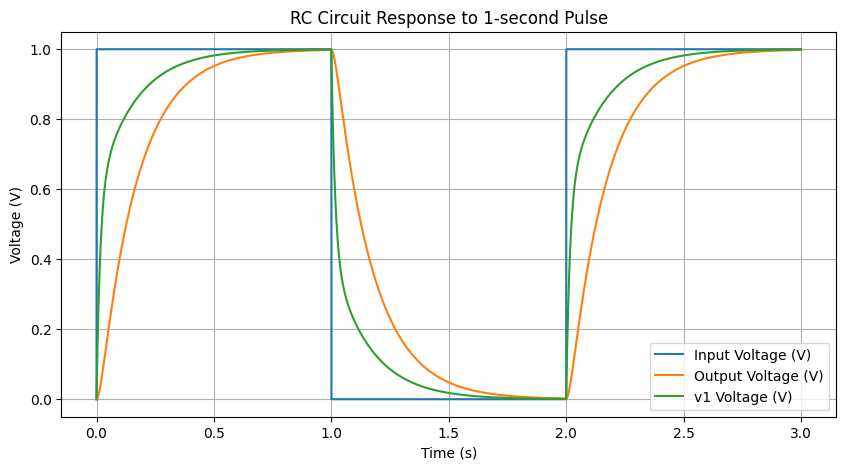

In [119]:

# Create a circuit
circuit = Circuit('Two-Stage RC Circuit')

# Add components
circuit.V('input', 'in', circuit.gnd, 'PULSE(0 1 0 1n 1n 1 2)')  # 1V pulse for 1 second
circuit.R('1', 'in', 'v1', 5@u_kΩ)  # R₁
circuit.C('1', 'v1', circuit.gnd, 5@u_uF)  # C₁
circuit.R('2', 'v1', 'v2', 10@u_kΩ)  # R₂
circuit.C('2', 'v2', circuit.gnd, 10@u_uF)  # C₂
# Simulation parameters
simulator = circuit.simulator(temperature=25, nominal_temperature=25)
analysis = simulator.transient(step_time=0.01@u_ms, end_time=3@u_s)

# Extract results
time = np.array(analysis.time)
input_voltage = np.array(analysis['in'])
v1_voltage = np.array(analysis['v1'])
output_voltage = np.array(analysis['v2'])

# Plot results
plt.figure(figsize=(10, 5))
plt.plot(time, input_voltage, label='Input Voltage (V)')
plt.plot(time, output_voltage, label='Output Voltage (V)')
plt.plot(time, v1_voltage, label='v1 Voltage (V)')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('RC Circuit Response to 1-second Pulse')
plt.grid(True)
plt.legend()
plt.show()

#### Diff eq simulation 

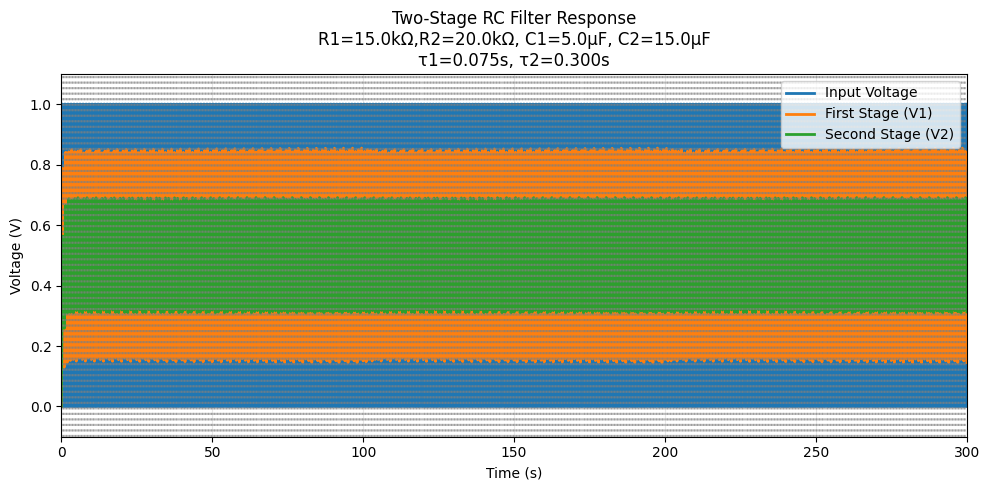

In [3]:

# Corrected circuit parameters
R1 = 15e3          # 5kΩ
R2 = 20e3          # 10kΩ
C1 = 5e-6         # 5μF
C2 = 15e-6         # 10μF
V_in_amp = 1.0    # Pulse amplitude (1V)
pulse_width = 0.5 # Pulse width (0.5s)
pulse_period = 1 # Pulse period (1s)

def input_pulse(t):
    phase = t % pulse_period
    return V_in_amp * (phase <= pulse_width)

# CORRECTED SYSTEM OF ODEs
def rc_circuit(t, y):
    V1, V2 = y  # Unpack state variables
    
    # Current through R1
    i1 = (input_pulse(t) - V1)/R1
    # Current through R2
    i2 = (V1 - V2)/R2
    
    # CORRECTED Differential equations:
    dV1dt = i1/C1 - i2/C1  # Current into C1 minus current out
    dV2dt = i2/C2          # Current into C2
    
    return [dV1dt, dV2dt]

# Simulation parameters
t_start = 0.0
t_end = 300.0
max_step = 2e-5
y0 = [0.0, 0.0]

# Solve
sol = solve_ivp(rc_circuit, 
                [t_start, t_end], 
                y0, 
                method='RK45',
                max_step=max_step,
                dense_output=True)

# Plotting
t_plot = np.linspace(t_start, t_end, 5000)
V1_plot, V2_plot = sol.sol(t_plot)
Vin_plot = np.array([input_pulse(t) for t in t_plot])

plt.figure(figsize=(10, 5))
plt.plot(t_plot, Vin_plot, label='Input Voltage', linewidth=2, color='tab:blue')
plt.plot(t_plot, V1_plot, label='First Stage (V1)', linewidth=2, color='tab:orange')
plt.plot(t_plot, V2_plot, label='Second Stage (V2)', linewidth=2, color='tab:green')

# Add pulse markers
for t in np.arange(0, t_end, pulse_period):
    plt.axvline(x=t, color='gray', linestyle=':', alpha=0.5)
    plt.axvline(x=t + pulse_width, color='gray', linestyle=':', alpha=0.5)

plt.title('Two-Stage RC Filter Response\n'
          f'R1={R1/1e3}kΩ,R2={R2/1e3}kΩ, C1={C1*1e6}μF, C2={C2*1e6}μF\n'
          f'τ1={R1*C1:.3f}s, τ2={R2*C2:.3f}s')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.xlim([t_start, t_end])
plt.ylim([-0.1, 1.1])
plt.tight_layout()
plt.show()

#### Dataset generation

In [4]:
def sample_noisy_voltages(sol, n_samples, noise_lev=0.01, t_start=None, t_end=None,device='cpu'):
    """
    Samples random points from EXISTING solution time points with added noise for both stages
    
    Args:
        sol: ODE solution object from solve_ivp (with .t and .y attributes)
        n_samples: Number of points to sample
        noise_lev: Noise scaling factor (std of Gaussian noise)
        t_start: Start time for sampling window (default: min(sol.t))
        t_end: End time for sampling window (default: max(sol.t))
    
    Returns:
        Tuple of (time_points, v1_points, v2_points) as torch Tensors
        All tensors have shape (n_samples, 1)
    """
    # Convert solution times to numpy array
    sol_times = sol.t
    
    # Determine time bounds
    t_min = t_start if t_start is not None else sol_times[0]
    t_max = t_end if t_end is not None else sol_times[-1]
    
    # Find indices within the specified time window
    valid_mask = (sol_times >= t_min) & (sol_times <= t_max)
    valid_times = sol_times[valid_mask]
    valid_v1 = sol.y[0][valid_mask]  # First stage voltage
    valid_v2 = sol.y[1][valid_mask]  # Second stage voltage
    
    # Randomly select indices from the valid points
    if len(valid_times) < n_samples:
        raise ValueError(f"Only {len(valid_times)} points available in time window, but requested {n_samples}")
    
    rand_indices = np.random.choice(len(valid_times), size=n_samples, replace=False)
    
    # Convert to torch tensors
    sampled_t = torch.tensor(valid_times[rand_indices], dtype=torch.float32,device=device)
    sampled_v1 = torch.tensor(valid_v1[rand_indices], dtype=torch.float32,device=device)
    sampled_v2 = torch.tensor(valid_v2[rand_indices], dtype=torch.float32,device=device)
    
    # Add independent Gaussian noise to each channel
    noise_v1 = torch.randn(n_samples,device=device) * noise_lev
    noise_v2 = torch.randn(n_samples,device=device) * noise_lev
    
    noisy_v1 = sampled_v1 + noise_v1
    noisy_v2 = sampled_v2 + noise_v2
    
    return (sampled_t.view(-1, 1), 
            noisy_v1.view(-1, 1), 
            noisy_v2.view(-1, 1))

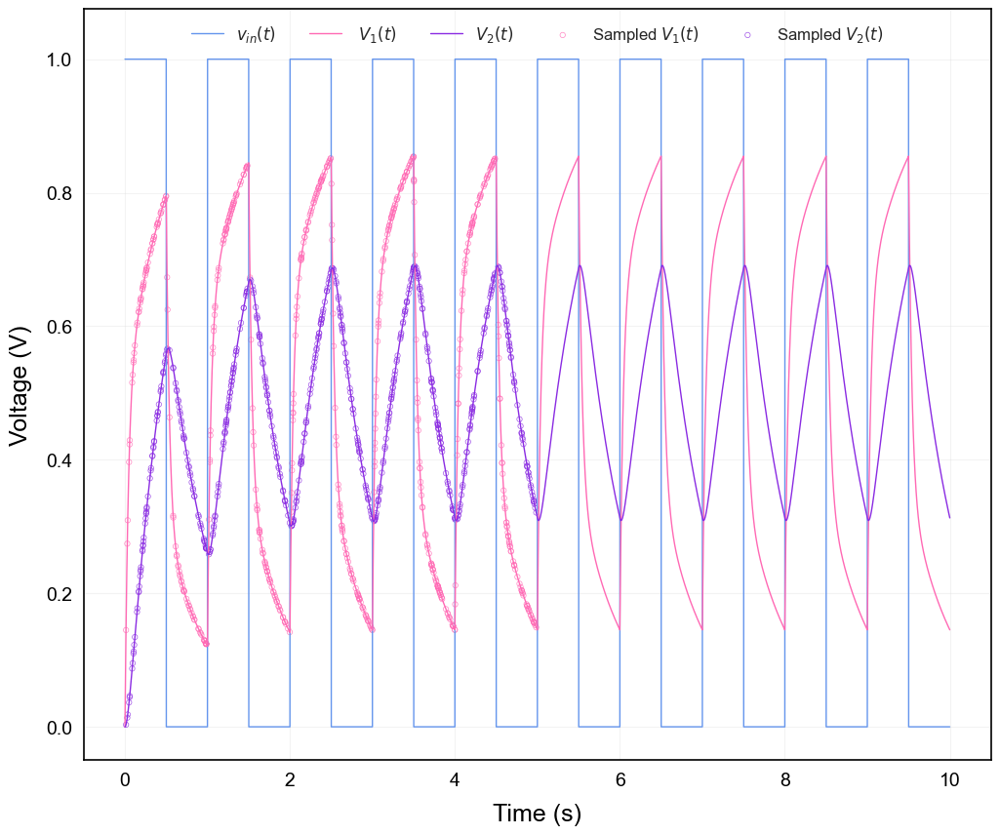

In [72]:
# Generate noisy samples
t_samples, v1_noisy, v2_noisy = sample_noisy_voltages(
    sol, 
    n_samples=600,
    noise_lev=0.000000001,
    t_start=0.0,
    t_end=5,device='cpu'  # Specify device for tensors
)
n=int(10)
m=int(sol.t.shape[0]*n/300)
Vin= np.array([input_pulse(t) for t in sol.t[:m]])
# Plot results
set_consistent_style()
plt.figure(figsize=(12, 10))

#plt.scatter(t_samples.cpu().detach(), abs(v1_noisy.cpu().detach()-v2_noisy.cpu().detach()), s=10, label='Noisy diff', alpha=0.6)
plt.plot(sol.t[:m], Vin, label=r'$v_{in}(t)$', linewidth=1, color='cornflowerblue')
plt.plot(sol.t[:m], sol.y[0][:m], label=r' $V_1 (t)$', color='#FF69B4', linewidth=1)
plt.plot(sol.t[:m], sol.y[1][:m], label=r'$V_2 (t)$', color='#8A2BE2', linewidth=1)
plt.scatter(t_samples.cpu().detach(), v1_noisy.cpu().detach(), s=15, label=r'Sampled $V_1 (t)$', alpha=0.8,color='#FF69B4',marker='o',facecolors='none',linewidths=0.5)
plt.scatter(t_samples.cpu().detach(), v2_noisy.cpu().detach(), s=15, label=r'Sampled $V_2 (t)$', alpha=0.8,color='#8A2BE2',marker='o',facecolors='none',linewidths=0.5)
#plt.title('Noisy Measurements from Two-Stage Filter')
plt.xlabel('Time (s)',fontsize=18,labelpad=10)
plt.ylabel('Voltage (V)',fontsize=18,labelpad=10)
plt.legend(ncol=5,loc='upper center')
plt.ylim([-0.05, 1.075])
plt.grid(alpha=0.3)
plt.savefig('two_stage_noisy_measurements.pdf', dpi=300)
plt.show()

In [ ]:
data= {
    't_samples': t_samples.cpu().detach(),
    'v1_noisy': v1_noisy.cpu().detach(),
    'v2_noisy': v2_noisy.cpu().detach(),
    'input_signal': torch.tensor([input_pulse(t) for t in t_samples.cpu().detach()], dtype=torch.float32, device='cpu').view(-1, 1),
    'R': torch.tensor([R1, R2], dtype=torch.float32, device='cpu'),
    'C': torch.tensor([C1, C2], dtype=torch.float32, device='cpu')
}
torch.save(data, 'nonoise_two_nodes.pt')

#### Training 

$V_{in}= f(V_2,V_2^{'},V_2^{''},C,R)$

In [ ]:
lambda1

In [ ]:
torch.sigmoid(lambda1)

In [ ]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,40,5)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,90).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-6) #reprecent C # Near 5μF
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e3) #reprecent C # Near 5μF  # Near 5kΩ
mu2 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-6) 
ro2 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e3) 
lambda1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-8) 



#### treat some R and C as not learnable 
R1 = 5e3 
R2 = 10e3          # 10kΩ
C1 = 5e-6         # 5μF
C2 = 10e-6         # 10μF
#lambda1 = 1e3
lamda2 = 1e20
mus1 = []
ros1 = []
mus2 = []
ros2 = []
losses1=[]
losses2=[]
totallosses=[]

# Initialize best loss tracking
best_loss = float('inf')
best_model_state = None
best_epoch = 0


# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [mu1], 'lr': 1e-3},
    {'params': [ro1], 'lr': 1e-0},
    {'params': [mu2], 'lr': 1e-3},
    {'params': [ro2], 'lr': 1e-0},
    {'params': [lambda1], 'lr': 1e-5} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................

    
    # compute physics loss ..................
    u = pinn(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] 
    d2udt2 = torch.autograd.grad(dudt, t_physics, torch.ones_like(dudt), create_graph=True)[0] 
    loss1 = torch.mean((d2udt2* (ro1*ro2*mu1*mu2) + dudt*(ro1 *(mu1+mu2)+ ro2*mu2) + u- input_pulse(t_physics)))**2

    
    loss3= u[0]**2+u[-1]**2

    #loss1 = torch.mean((d2udt2* (ro1*R2*mu1*C2) + dudt*(ro1 *(mu1+C2)+ R2*C2) + u- input_pulse(t_physics))**2)
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(t_samples)
    loss2 = torch.mean((u - v2_noisy)**2)


    param_penalty = swish_penalty(mu1)+ swish_penalty(mu2)+ swish_penalty(ro1)+ swish_penalty(ro2)#+ swish_penalty(lambda1)+ swish_penalty(-lambda1)
                                
     
    # backpropagate joint loss, take optimiser step
    loss = (1-torch.sigmoid(lambda1))*loss2 + torch.sigmoid(lambda1)*loss1+ lamda2 * param_penalty+ loss3
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus1.append(mu1.item())
    ros1.append(ro1.item())
    mus2.append(mu2.item())
    ros2.append(ro2.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    totallosses.append(loss.item())
    # Check for best model
    if loss.item() < best_loss:
        best_loss = loss.item()
        best_model_state = pinn.state_dict().copy()  # Deep copy of weights
        best_epoch = i
        print(f"New best model at epoch {i} with loss {best_loss:.6e}")
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0], v2_noisy[:,0], s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()
# After training, restore best model
pinn.load_state_dict(best_model_state)
print(f"Restored best model from epoch {best_epoch} with loss {best_loss:.6e}")

# Save the best model
torch.save({
    'epoch': best_epoch,
    'model_state_dict': pinn.state_dict(),
    'optimizer_state_dict': optimiser.state_dict(),
    'loss': best_loss,
}, 'best_pinn_two_nodes.pth')
plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ_1", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ_1", color="tab:blue", linestyle='--', linewidth=1.5)
plt.plot(mus2, label="PINN estimate for μ_2", color='green', linewidth=1.5)
plt.hlines(C2, 0, len(mus1), label="True μ_2", color="tab:purple", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ_1", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ_1", color="tab:purple", linestyle='--', linewidth=1.5)
plt.plot(ros2, label="PINN estimate for ρ_2", color='black', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ_2", color="tab:blue", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1[100:], label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2[100:], label="data losses", color='red', linewidth=1.5)
plt.plot(totallosses[100:], label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(rf"μ_1 (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(rf"μ_2 (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(rf"ρ_1 (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")
print(rf"ρ_2 (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")
print(rf"τ_1 (time constant): Predicted = {ros1[-1]*mus1[-1]:.6f}, True = {R1*C1:.6f}")
print(rf"τ_2 (tiem constant): Predicted = {ros2[-1]*mus2[-1]:.6f}, True = {R2*C2:.6f}")

u_best = pinn(t_test).detach()
plt.figure(figsize=(10, 7))
plt.scatter(t_samples[:,0], v2_noisy[:,0], s=40, label="Noisy observations", alpha=0.7, color="orange")
plt.plot(t_test[:,0], u_best[:,0], lw=2.5, label="Best PINN", color="tab:red")
plt.title(f"Best Model: Epoch {best_epoch} | Loss: {best_loss:.2e}")
plt.xlabel("Time")
plt.ylabel("Voltage")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('best_pinn_solution.png', dpi=300)
plt.show()

In [ ]:
lambda1

##### It can fit the data, but not do extrapolation when the full inverse problem is being solved, The eqation is correct. changes in the architecture, already made possible to run the inference with a single set of learnable variables. we could find a way to simplyfy the Diff. Eq. or an architecture more powerful.  


#### Training 

$V_{in}= f(V_2,V_2^{'},V_1,V_1^{'},C,R)$

In [149]:
mu1

Parameter containing:
tensor([0.2038], requires_grad=True)

New best model at epoch 0 with loss 3.641430e-01


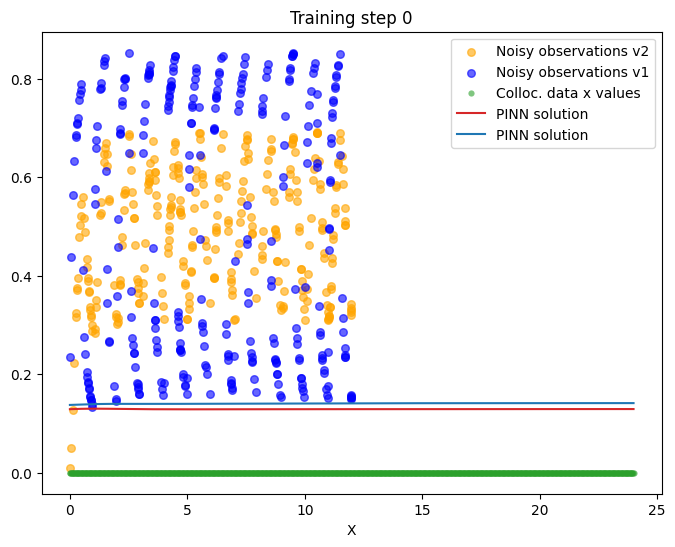

New best model at epoch 1 with loss 3.349166e-01
New best model at epoch 2 with loss 3.069900e-01
New best model at epoch 3 with loss 2.801678e-01
New best model at epoch 4 with loss 2.542977e-01
New best model at epoch 6 with loss 2.047496e-01
New best model at epoch 7 with loss 1.809559e-01
New best model at epoch 8 with loss 1.580561e-01
New best model at epoch 9 with loss 1.365485e-01
New best model at epoch 10 with loss 1.172220e-01
New best model at epoch 11 with loss 1.011492e-01
New best model at epoch 12 with loss 8.960114e-02
New best model at epoch 13 with loss 8.379264e-02
New best model at epoch 25 with loss 8.334971e-02
New best model at epoch 40 with loss 8.318156e-02
New best model at epoch 41 with loss 8.309372e-02
New best model at epoch 52 with loss 8.298513e-02
New best model at epoch 53 with loss 8.284330e-02
New best model at epoch 54 with loss 8.277287e-02
New best model at epoch 55 with loss 8.276372e-02
New best model at epoch 63 with loss 8.273752e-02
New best

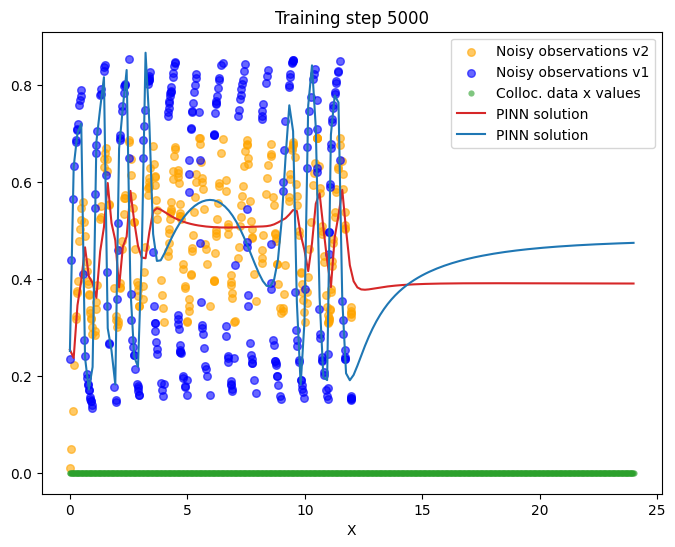

New best model at epoch 5001 with loss 4.338064e-02
New best model at epoch 5002 with loss 4.336758e-02
New best model at epoch 5011 with loss 4.330718e-02
New best model at epoch 5012 with loss 4.319063e-02
New best model at epoch 5013 with loss 4.315710e-02
New best model at epoch 5023 with loss 4.310606e-02
New best model at epoch 5024 with loss 4.305122e-02
New best model at epoch 5025 with loss 4.300535e-02
New best model at epoch 5026 with loss 4.297281e-02
New best model at epoch 5027 with loss 4.295356e-02
New best model at epoch 5028 with loss 4.294369e-02
New best model at epoch 5029 with loss 4.293825e-02
New best model at epoch 5030 with loss 4.293280e-02
New best model at epoch 5031 with loss 4.292643e-02
New best model at epoch 5032 with loss 4.291973e-02
New best model at epoch 5033 with loss 4.291614e-02
New best model at epoch 5044 with loss 4.285360e-02
New best model at epoch 5045 with loss 4.280747e-02
New best model at epoch 5046 with loss 4.277530e-02
New best mod

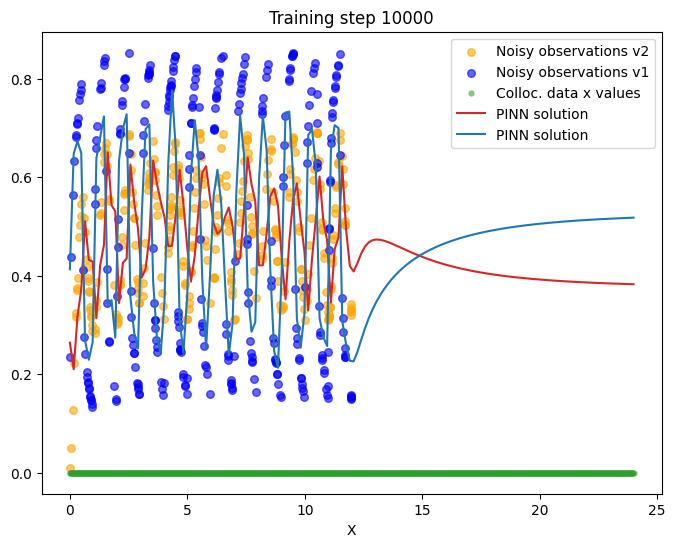

New best model at epoch 10176 with loss 2.261142e-02
New best model at epoch 10177 with loss 2.238920e-02
New best model at epoch 10183 with loss 2.223620e-02
New best model at epoch 10184 with loss 2.216851e-02
New best model at epoch 10190 with loss 2.204886e-02
New best model at epoch 10191 with loss 2.196446e-02
New best model at epoch 10192 with loss 2.193970e-02
New best model at epoch 10198 with loss 2.188410e-02
New best model at epoch 10199 with loss 2.180830e-02
New best model at epoch 10200 with loss 2.173317e-02
New best model at epoch 10201 with loss 2.167309e-02
New best model at epoch 10202 with loss 2.162987e-02
New best model at epoch 10203 with loss 2.160301e-02
New best model at epoch 10204 with loss 2.159066e-02
New best model at epoch 10205 with loss 2.158693e-02
New best model at epoch 10206 with loss 2.158691e-02
New best model at epoch 10226 with loss 2.119219e-02
New best model at epoch 10227 with loss 2.098980e-02
New best model at epoch 10237 with loss 2.0858

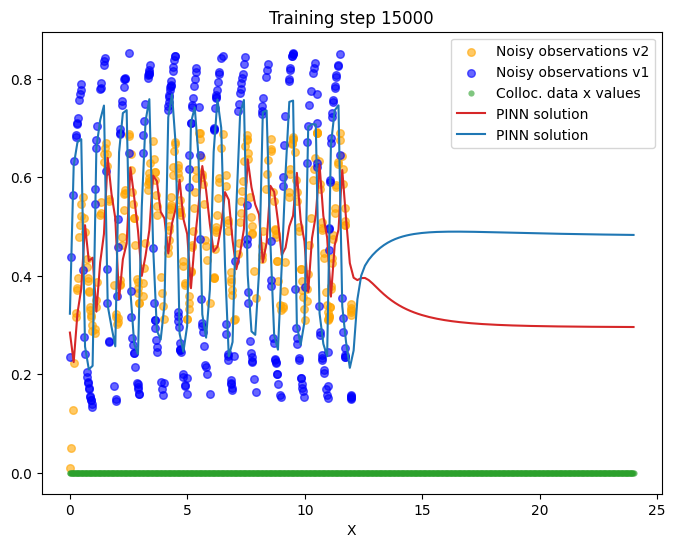

New best model at epoch 15868 with loss 7.160490e-03
New best model at epoch 15869 with loss 7.155047e-03
New best model at epoch 15877 with loss 7.143607e-03
New best model at epoch 15878 with loss 7.137788e-03
New best model at epoch 15879 with loss 7.134359e-03
New best model at epoch 15905 with loss 7.129600e-03
New best model at epoch 15910 with loss 7.108447e-03
New best model at epoch 15911 with loss 7.070533e-03
New best model at epoch 15916 with loss 7.026285e-03
New best model at epoch 15921 with loss 6.950161e-03
New best model at epoch 15924 with loss 6.938448e-03
New best model at epoch 15929 with loss 6.878855e-03
New best model at epoch 15937 with loss 6.874358e-03
New best model at epoch 15938 with loss 6.862809e-03
New best model at epoch 15939 with loss 6.858680e-03
New best model at epoch 15940 with loss 6.834187e-03
New best model at epoch 18362 with loss 6.799357e-03
New best model at epoch 18367 with loss 6.795948e-03
New best model at epoch 18368 with loss 6.7913

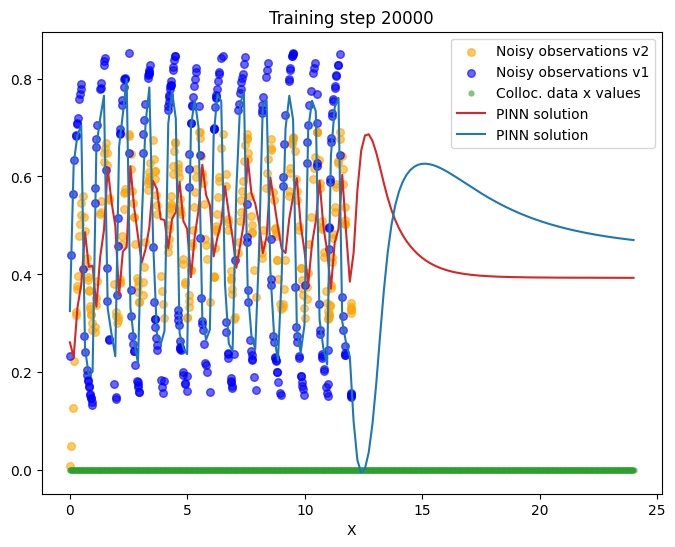

New best model at epoch 20769 with loss 6.750119e-03
New best model at epoch 20785 with loss 6.733238e-03
New best model at epoch 20792 with loss 6.720378e-03
New best model at epoch 23188 with loss 6.718534e-03
New best model at epoch 23189 with loss 6.715741e-03
New best model at epoch 23201 with loss 6.680351e-03
New best model at epoch 23202 with loss 6.649449e-03
New best model at epoch 23203 with loss 6.640829e-03
New best model at epoch 23216 with loss 6.617026e-03
New best model at epoch 23217 with loss 6.601285e-03
New best model at epoch 23218 with loss 6.599424e-03


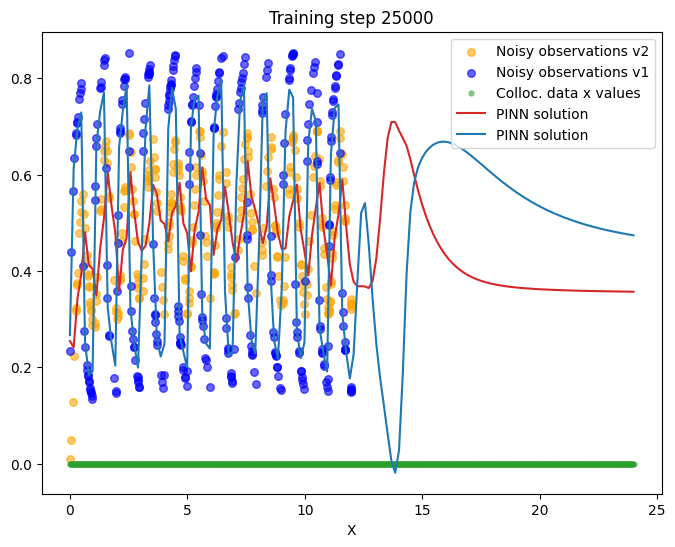

New best model at epoch 25639 with loss 6.599287e-03
New best model at epoch 25640 with loss 6.577505e-03
New best model at epoch 25641 with loss 6.565711e-03
New best model at epoch 25642 with loss 6.562260e-03
New best model at epoch 28067 with loss 6.558638e-03
New best model at epoch 28068 with loss 6.549823e-03
New best model at epoch 28071 with loss 6.546301e-03
New best model at epoch 28072 with loss 6.541505e-03
New best model at epoch 28073 with loss 6.535444e-03
New best model at epoch 28074 with loss 6.527629e-03
New best model at epoch 28075 with loss 6.520755e-03
New best model at epoch 28076 with loss 6.520709e-03
New best model at epoch 28077 with loss 6.513368e-03
New best model at epoch 28078 with loss 6.501863e-03
New best model at epoch 28079 with loss 6.494164e-03
New best model at epoch 28082 with loss 6.487783e-03
New best model at epoch 28083 with loss 6.478851e-03
New best model at epoch 28084 with loss 6.474667e-03


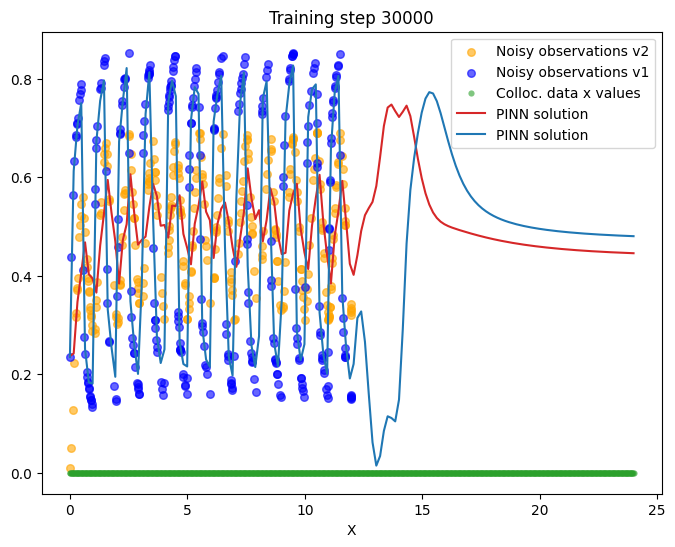

New best model at epoch 32936 with loss 6.462906e-03
New best model at epoch 32937 with loss 6.434626e-03
New best model at epoch 32948 with loss 6.420635e-03


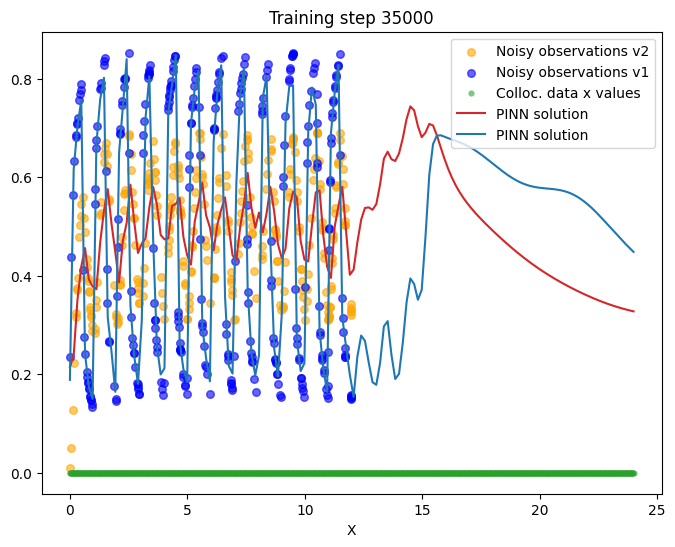

New best model at epoch 37840 with loss 6.403057e-03
New best model at epoch 37841 with loss 6.389244e-03
New best model at epoch 37851 with loss 6.365870e-03
New best model at epoch 37858 with loss 6.346086e-03


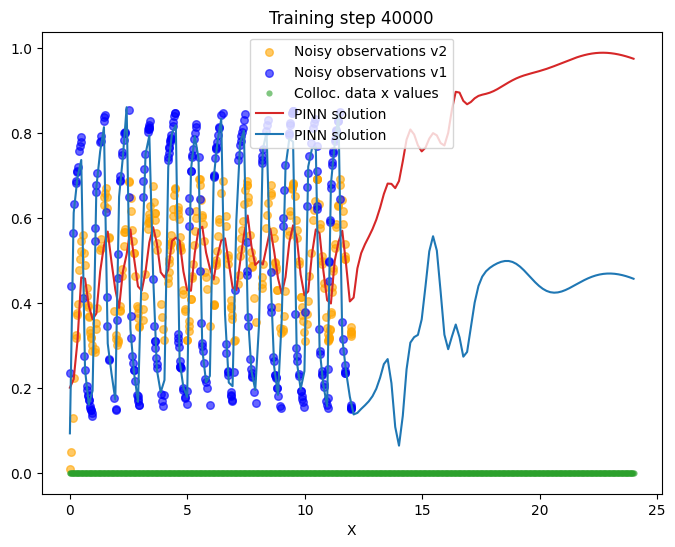

New best model at epoch 40279 with loss 6.344621e-03
New best model at epoch 40280 with loss 6.339150e-03
New best model at epoch 40281 with loss 6.335824e-03
New best model at epoch 40282 with loss 6.333039e-03
New best model at epoch 40283 with loss 6.332858e-03


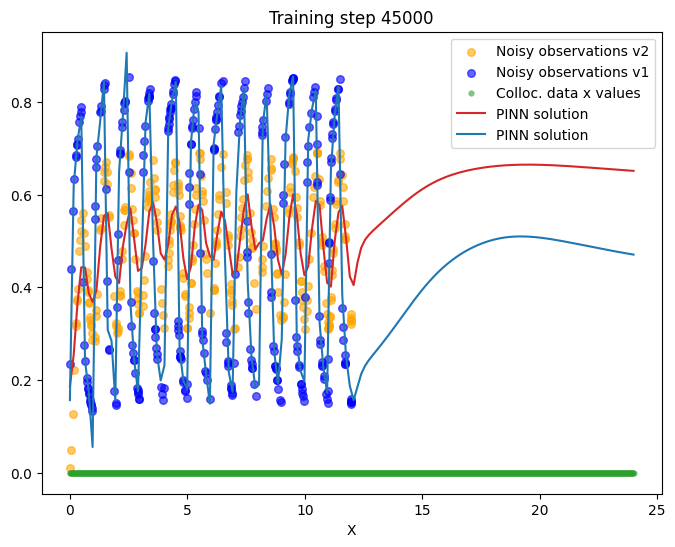

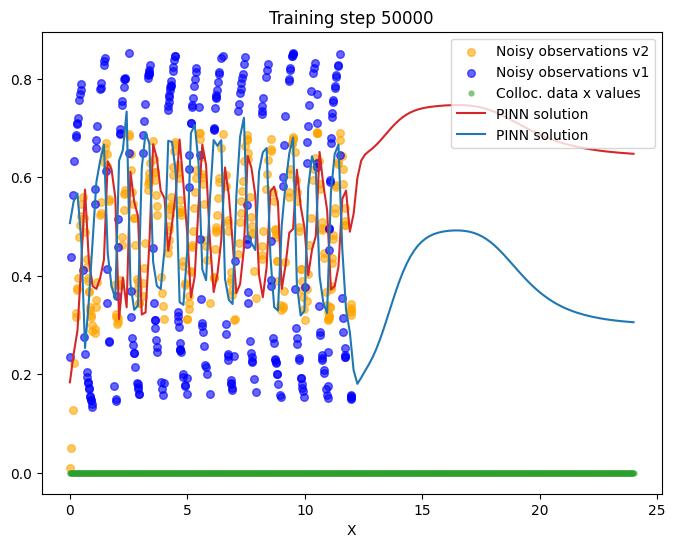

New best model at epoch 52440 with loss 6.332511e-03
New best model at epoch 54883 with loss 6.307786e-03
New best model at epoch 54884 with loss 6.284245e-03
New best model at epoch 54901 with loss 6.280080e-03
New best model at epoch 54907 with loss 6.229392e-03
New best model at epoch 54914 with loss 6.198475e-03
New best model at epoch 54920 with loss 6.172286e-03


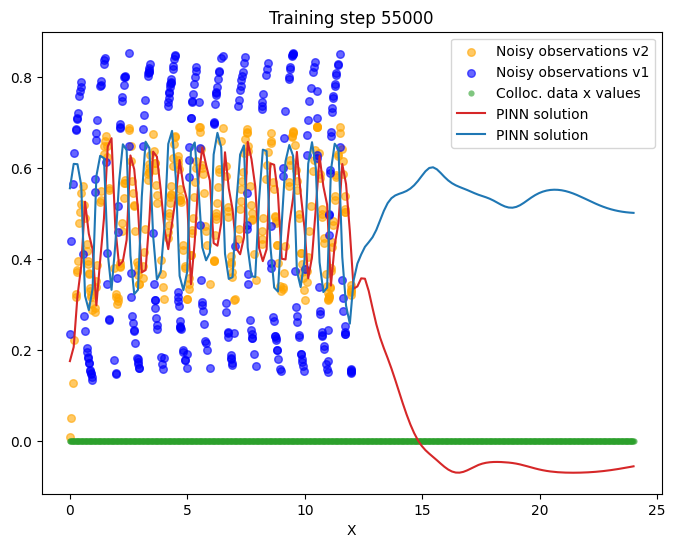

New best model at epoch 57341 with loss 6.151609e-03
New best model at epoch 57349 with loss 6.118099e-03
New best model at epoch 57358 with loss 6.098717e-03
New best model at epoch 57359 with loss 6.071057e-03
New best model at epoch 57369 with loss 6.070871e-03
New best model at epoch 57370 with loss 6.031848e-03
New best model at epoch 57371 with loss 6.018194e-03
New best model at epoch 57381 with loss 5.999340e-03
New best model at epoch 57382 with loss 5.977932e-03
New best model at epoch 57391 with loss 5.973781e-03
New best model at epoch 57392 with loss 5.939933e-03
New best model at epoch 57393 with loss 5.939850e-03
New best model at epoch 57402 with loss 5.927373e-03
New best model at epoch 57403 with loss 5.898616e-03
New best model at epoch 57414 with loss 5.865969e-03
New best model at epoch 57415 with loss 5.862986e-03
New best model at epoch 57424 with loss 5.857246e-03
New best model at epoch 57425 with loss 5.826309e-03
New best model at epoch 57435 with loss 5.8195

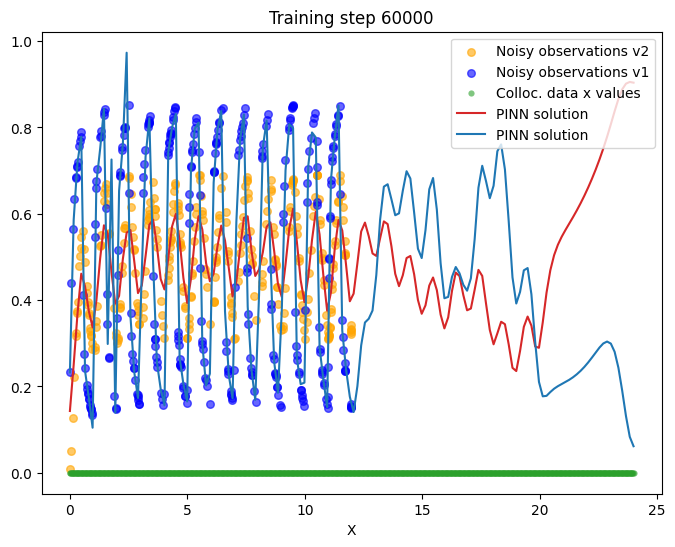

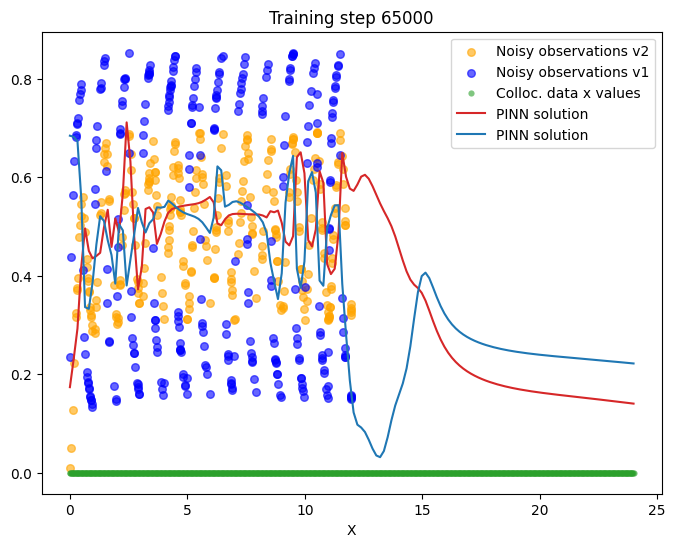

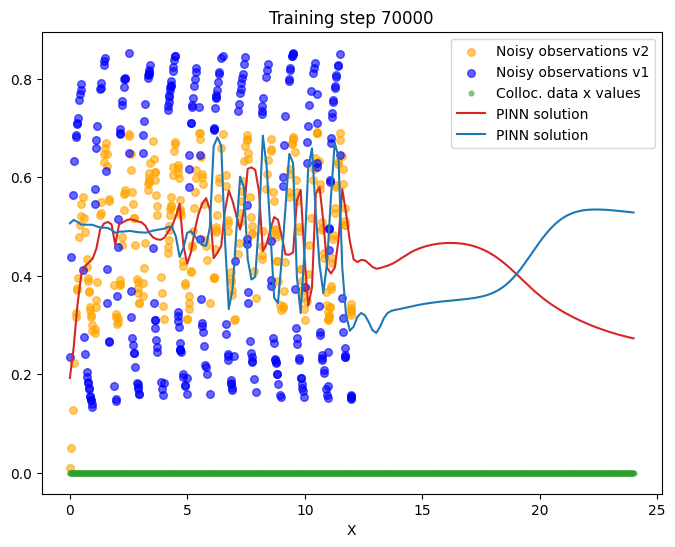

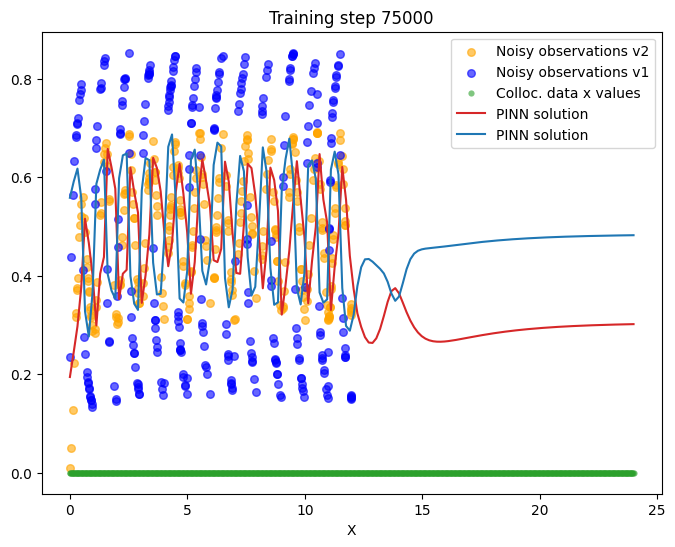

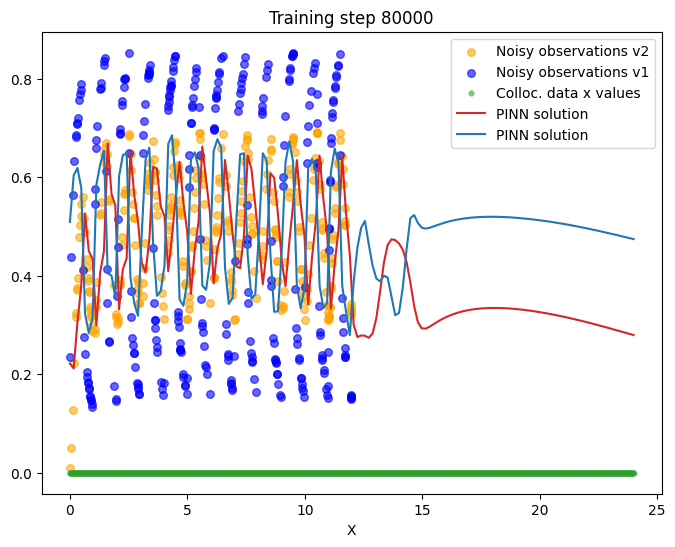

...

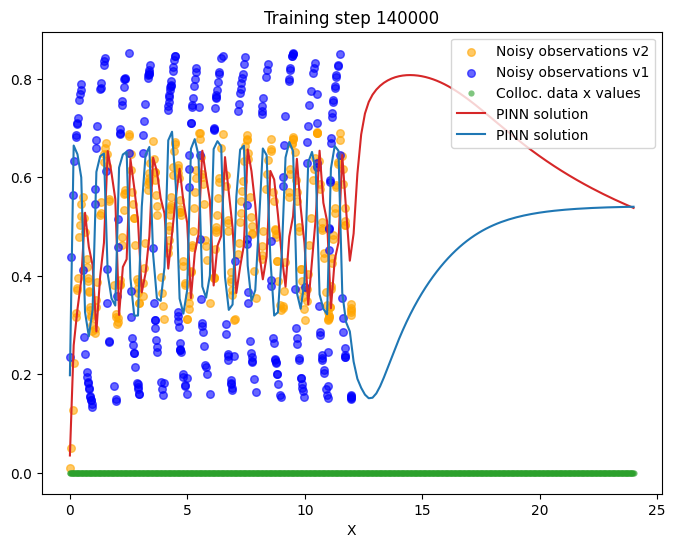

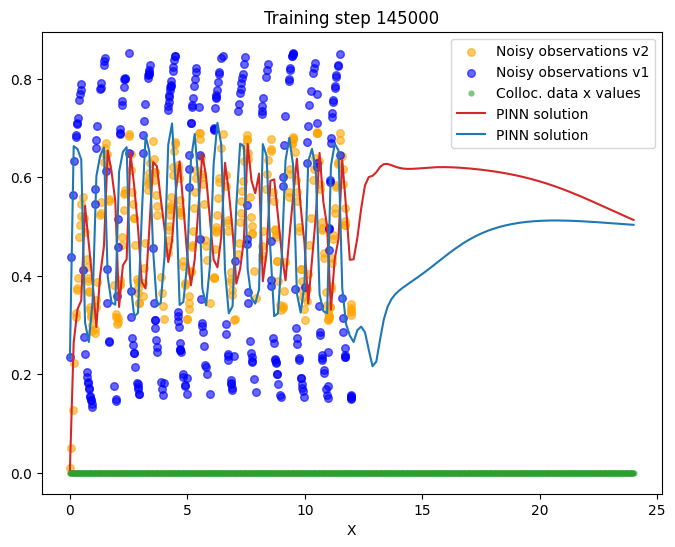

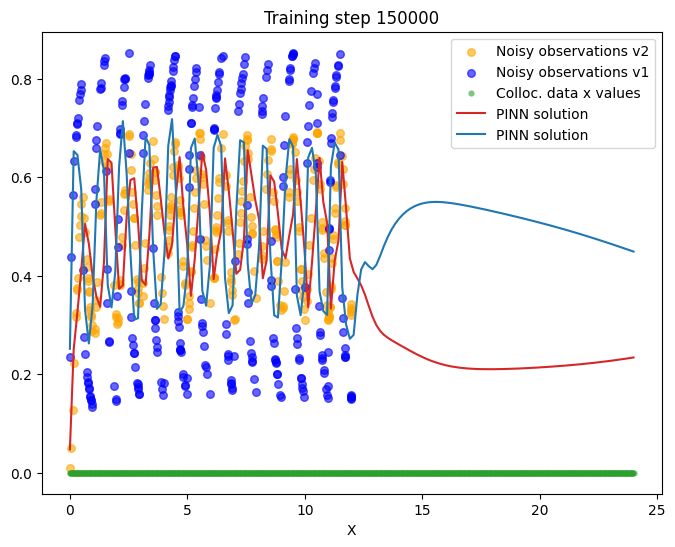

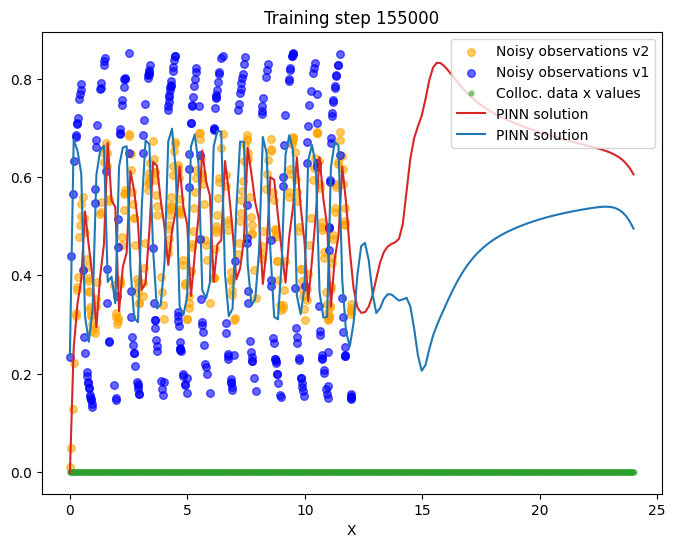

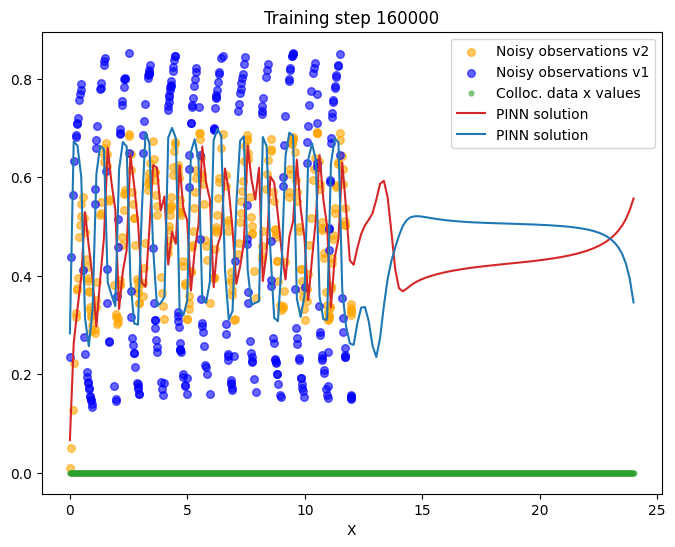

Restored best model from epoch 57448 with loss 5.746336e-03


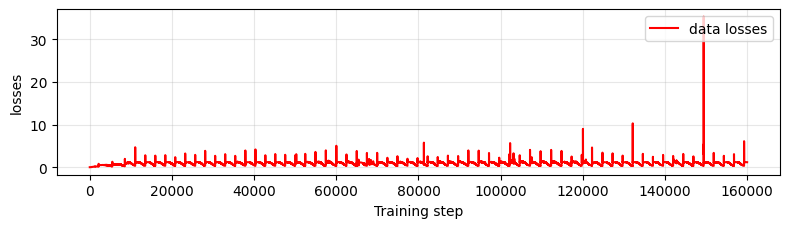

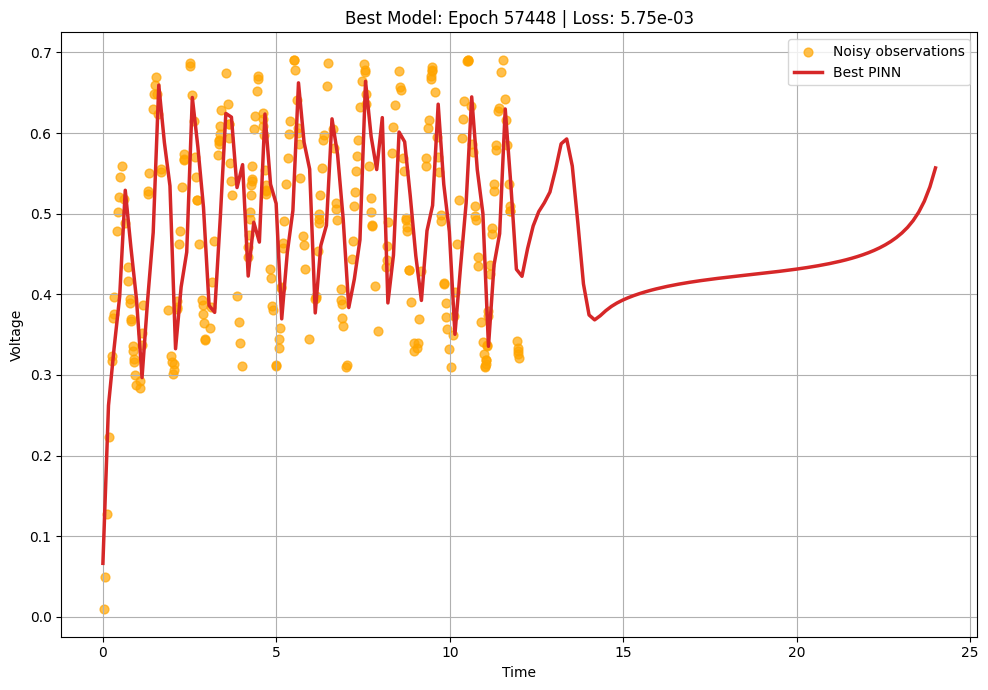

In [150]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,2,32,9)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,24,1000).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,24,150).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............

mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-6) #reprecent C # Near 5μF
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e4) #reprecent C # Near 5μF  # Near 5kΩ

#mu2 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-6) 
ro2 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e4) 
#lambda1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e4) 

lambda1 = 1e-2
lambda2 = 1e2
lambda3 = 1e1

mus1 = []
ros1 = []

mus2 = []
ros2 = []
losses1=[]
losses2=[]
''' 
R1 = 50e3 
R2 = 10e3          # 10kΩ
C1 = 5e-6         # 5μF
C2 = 10e-6         # 10μF
'''
# Initialize best loss tracking
best_loss = float('inf')
best_model_state = None
best_epoch = 0

# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters(), 'lr': 1e-3},
    {'params': [mu1], 'lr': 1e-1},
    {'params': [ro1,ro2], 'lr': 1e-1}
])
for i in range(160001):
    optimiser.zero_grad()
    
    # Physics loss
    u = pinn(t_physics)
    u1=u[:,1].view(-1,1)
    u2=u[:,0].view(-1,1)
    du1dt = torch.autograd.grad(u1, t_physics, torch.ones_like(u1), create_graph=True)[0]
    du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]
    # d2u2dt2 = torch.autograd.grad(du2dt, t_physics, torch.ones_like(u2), create_graph=True)[0]
    #loss1 =torch.mean((u1+ro1*mu1*du1dt+ro1*mu2*du2dt- input_pulse(t_physics) )**2)
    # Current KL loss
    #loss2a= torch.mean(((input_pulse(t_physics)-u1)/ro1 -(u1-u2)/ro2- mu1*du1dt)**2)
    #loss2b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)
    #loss2=loss2a+loss2b
    loss2= torch.mean(((input_pulse(t_physics)-u1)/ro1 - mu2*du2dt- mu1*du1dt)**2)

    #lag linear aproximation 
    output_penalty= torch.mean((torch.log(torch.abs(u1))-torch.log(torch.abs(u2))+t_physics *( mu1*ro1-mu2*ro2))**2)
    # Data loss
    u_pred = pinn(t_samples)
    loss4 = torch.mean((u_pred[:,1].view(-1,1) - v1_noisy )**2+ (u_pred[:,0].view(-1,1) - v2_noisy)**2)
    param_penalty = swish_penalty(mu1)+swish_penalty(mu2) +swish_penalty(ro2)+ swish_penalty(ro1)
    # Combined loss
    
    loss = lambda1*loss2 +(1-lambda1)*(loss4) + lambda2*param_penalty#+0.001*output_penalty 
    loss.backward()
    optimiser.step()
    
    # Record physical values
   
    mus1.append(mu1.item())
    ros1.append(ro1.item())
   
    mus2.append(mu2.item())
    ros2.append(ro2.item())
   
    #losses1.append(loss1.item())
    losses2.append(loss2.item())
    # Check for best model
    if loss.item() < best_loss:
        best_loss = loss.item()
        best_model_state = pinn.state_dict().copy()  # Deep copy of weights
        best_epoch = i
        print(f"New best model at epoch {i} with loss {best_loss:.6e}")
   
    #if i % 1000 == 0:
       # print(f"Gradients - mu1: {mu1.grad.norm():.2e}, ro1: {ro1.grad.norm():.2e}")
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].detach(), v2_noisy[:,0].detach(), s=30,label="Noisy observations v2", alpha=0.6, color="orange")
        plt.scatter(t_samples[:,0].detach(), v1_noisy[:,0].detach(), s=30,label="Noisy observations v1", alpha=0.6, color="blue")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.plot(t_test[:,0], u[:,1], label="PINN solution", color="tab:blue")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()
# After training, restore best model
pinn.load_state_dict(best_model_state)
print(f"Restored best model from epoch {best_epoch} with loss {best_loss:.6e}")

# Save the best model
torch.save({
    'epoch': best_epoch,
    'model_state_dict': pinn.state_dict(),
    'optimizer_state_dict': optimiser.state_dict(),
    'loss': best_loss,
}, 'best_pinn_two_nodes.pth')
plt.figure(figsize=(8, 6))

'''
# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ_1", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ_1", color="tab:blue", linestyle='--', linewidth=1.5)
plt.plot(mus2, label="PINN estimate for μ_2", color='green', linewidth=1.5)
plt.hlines(C2, 0, len(mus1), label="True μ_2", color="tab:purple", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ_1", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ_1", color="tab:purple", linestyle='--', linewidth=1.5)
plt.plot(ros2, label="PINN estimate for ρ_2", color='black', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ_2", color="tab:blue", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))
'''
# Third subplot - losses
plt.subplot(3, 1, 3)
#plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final values
'''
print("\nFinal Parameter Estimates:")
print(f"μ_1 (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"μ_2 (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(f"ρ_1 (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")
print(f"ρ_2 (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")
print(rf"τ_1 (time constant): Predicted = {ros1[-1]*mus1[-1]:.6f}, True = {R1*C1:.6f}")
print(rf"τ_2 (tiem constant): Predicted = {ros2[-1]*mus2[-1]:.6f}, True = {R2*C2:.6f}")
'''
u_best = pinn(t_test).detach()
plt.figure(figsize=(10, 7))
plt.scatter(t_samples[:,0], v2_noisy[:,0], s=40, label="Noisy observations", alpha=0.7, color="orange")
plt.plot(t_test[:,0], u_best[:,0], lw=2.5, label="Best PINN", color="tab:red")
plt.title(f"Best Model: Epoch {best_epoch} | Loss: {best_loss:.2e}")
plt.xlabel("Time")
plt.ylabel("Voltage")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('best_pinn_solution.png', dpi=300)
plt.show()

In [146]:
R2*C2

0.3

In [147]:
mu2*ro2

tensor([12761.1113], grad_fn=<MulBackward0>)

##### The NN tries to converge but is not stable enough. for some reason V1 converges, but V2 doesnt. The eq where checked, the problem may be the architecture.

Other option would be to use the solution for the differential equations in exponential or cos, sin shapes, but this would take away the advantage of autodifferenciation. 

#### Training 

$V_{in}= f(V_2,V_2^{'},V_1,V_1^{'},C,R,\tau_{2})$

In [ ]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,2,32,16).to(device)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,6,1000,device=device).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,150,device=device).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............

mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-6) #reprecent C # Near 5μF
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e4) #reprecent C # Near 5μF  # Near 5kΩ

mu2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-6) 
ro2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e4) 
lambda1 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e4) 

#lambda1 = 1e6
lambda2 = 1e2
lambda3 = 1e1

mus1 = []
ros1 = []

mus2 = []
ros2 = []
losses1=[]
losses2=[]
''' 
R1 = 50e3 
R2 = 10e3          # 10kΩ
C1 = 5e-6         # 5μF
C2 = 10e-6         # 10μF
'''
# Initialize best loss tracking
best_loss = float('inf')
best_model_state = None
best_epoch = 0

# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters(), 'lr': 1e-3},
    {'params': [mu1,mu2], 'lr': 1e-1},
    {'params': [ro1,ro2,lambda1], 'lr': 1e-1}
])
for i in range(160001):
    optimiser.zero_grad()
    
    # Physics loss
    u = pinn(t_physics)
    u1=u[:,1].view(-1,1)
    u2=u[:,0].view(-1,1)
    du1dt = torch.autograd.grad(u1, t_physics, torch.ones_like(u1), create_graph=True)[0]
    du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]
    # d2u2dt2 = torch.autograd.grad(du2dt, t_physics, torch.ones_like(u2), create_graph=True)[0]
    loss1 =torch.mean((u1+ro1*mu1*du1dt+ro1*mu2*du2dt- input_pulse(t_physics) )**2)
    # Current KL loss
    loss2a= torch.mean(((input_pulse(t_physics)-u1)/ro1 -(u1-u2)/ro2- mu1*du1dt)**2)
    loss2b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)
    loss2=loss2a+loss2b

    #lag linear aproximation 
    #output_penalty= torch.mean((torch.log(torch.abs(u1))-torch.log(torch.abs(u2))+t_physics *( mu1*ro1-mu2*ro2))**2)
    output_penalty= torch.mean((mu2*ro2 -tau2)**2)
    # Data loss
    u_pred = pinn(t_samples)
    loss4 = torch.mean((u_pred[:,1].view(-1,1) - v1_noisy )**2+ (u_pred[:,0].view(-1,1) - v2_noisy)**2)
    param_penalty = swish_penalty(mu1)+swish_penalty(mu2) +swish_penalty(ro2)+ swish_penalty(ro1)
    # Combined loss
    
    loss = torch.sigmoid(lambda1)*loss4 +(1-torch.sigmoid(lambda1))*(loss2+loss1) + lambda2*param_penalty+0.01*output_penalty 
    loss.backward()
    optimiser.step()
    
    # Record physical values
   
    mus1.append(mu1.item())
    ros1.append(ro1.item())
   
    mus2.append(mu2.item())
    ros2.append(ro2.item())
   
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    # Check for best model
    if loss.item() < best_loss:
        best_loss = loss.item()
        best_model_state = pinn.state_dict().copy()  # Deep copy of weights
        best_epoch = i
        print(f"New best model at epoch {i} with loss {best_loss:.6e}")
   
    #if i % 1000 == 0:
       # print(f"Gradients - mu1: {mu1.grad.norm():.2e}, ro1: {ro1.grad.norm():.2e}")
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].detach(), v2_noisy[:,0].detach(), s=30,label="Noisy observations v2", alpha=0.6, color="orange")
        plt.scatter(t_samples[:,0].detach(), v1_noisy[:,0].detach(), s=30,label="Noisy observations v1", alpha=0.6, color="blue")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.plot(t_test[:,0], u[:,1], label="PINN solution", color="tab:blue")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()
# After training, restore best model
pinn.load_state_dict(best_model_state)
print(f"Restored best model from epoch {best_epoch} with loss {best_loss:.6e}")

# Save the best model
torch.save({
    'epoch': best_epoch,
    'model_state_dict': pinn.state_dict(),
    'optimizer_state_dict': optimiser.state_dict(),
    'loss': best_loss,
}, 'best_pinn_two_nodes.pth')
plt.figure(figsize=(8, 6))

'''
# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ_1", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ_1", color="tab:blue", linestyle='--', linewidth=1.5)
plt.plot(mus2, label="PINN estimate for μ_2", color='green', linewidth=1.5)
plt.hlines(C2, 0, len(mus1), label="True μ_2", color="tab:purple", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ_1", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ_1", color="tab:purple", linestyle='--', linewidth=1.5)
plt.plot(ros2, label="PINN estimate for ρ_2", color='black', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ_2", color="tab:blue", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))
'''
# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final values
'''
print("\nFinal Parameter Estimates:")
print(f"μ_1 (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"μ_2 (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(f"ρ_1 (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")
print(f"ρ_2 (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")
print(rf"τ_1 (time constant): Predicted = {ros1[-1]*mus1[-1]:.6f}, True = {R1*C1:.6f}")
print(rf"τ_2 (tiem constant): Predicted = {ros2[-1]*mus2[-1]:.6f}, True = {R2*C2:.6f}")
'''
u_best = pinn(t_test).detach()
plt.figure(figsize=(10, 7))
plt.scatter(t_samples[:,0], v2_noisy[:,0], s=40, label="Noisy observations", alpha=0.7, color="orange")
plt.plot(t_test[:,0], u_best[:,0], lw=2.5, label="Best PINN", color="tab:red")
plt.title(f"Best Model: Epoch {best_epoch} | Loss: {best_loss:.2e}")
plt.xlabel("Time")
plt.ylabel("Voltage")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('best_pinn_solution.png', dpi=300)
plt.show()

## Secuetial modeling of V1 and V2 separatedely

### finding $\tau_1$ and $\tau_2$

### Train V1

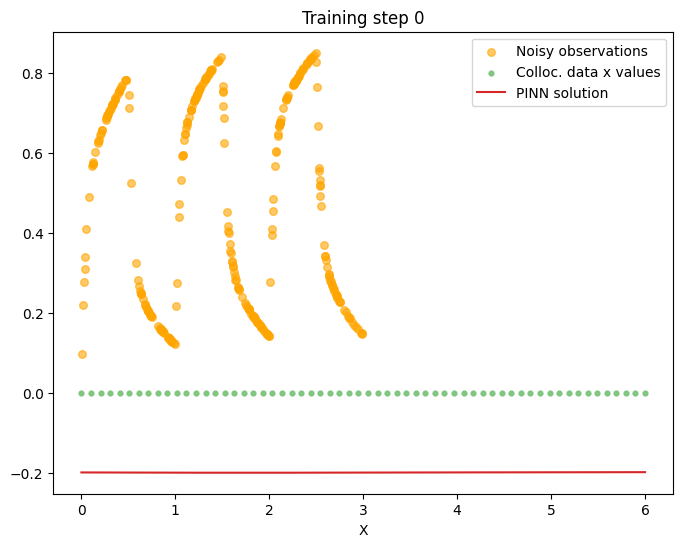

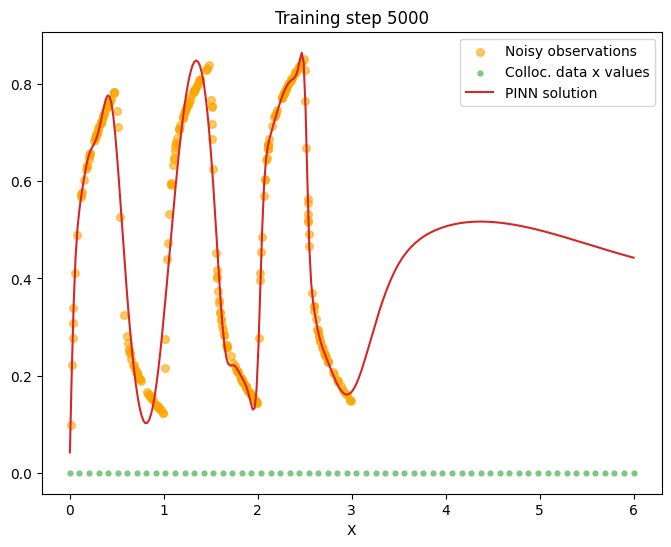

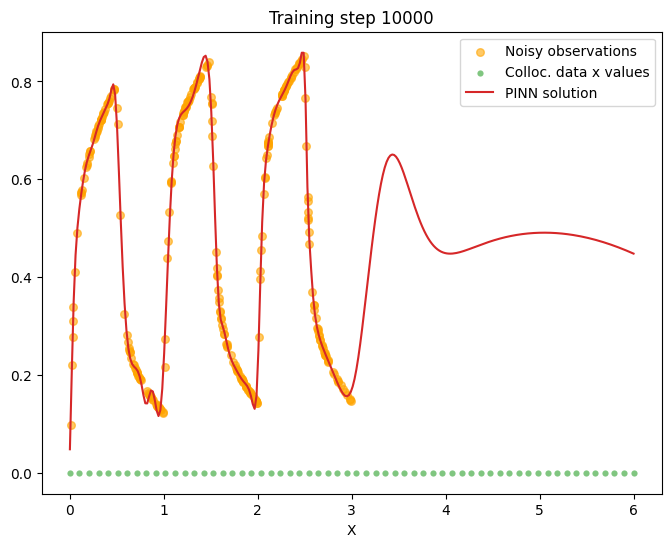

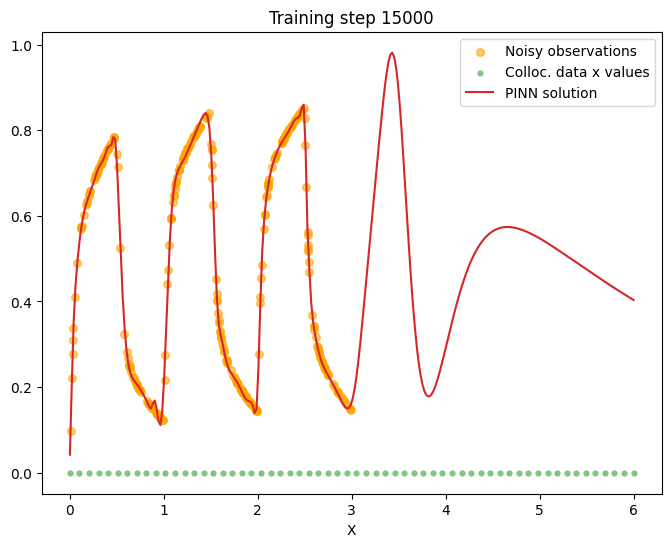

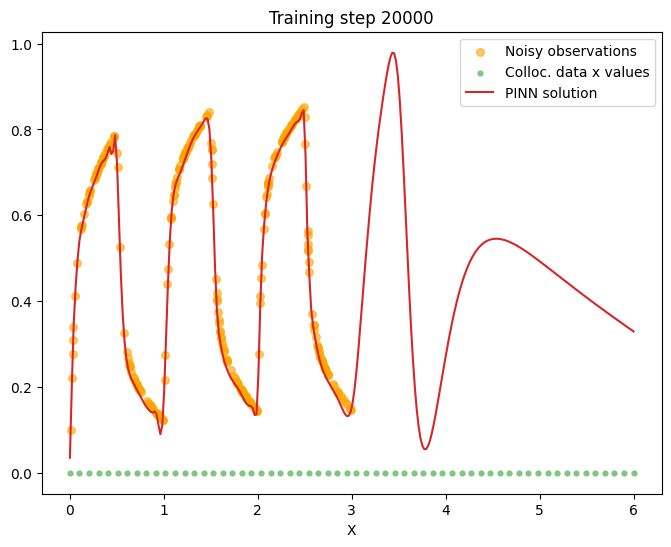

...

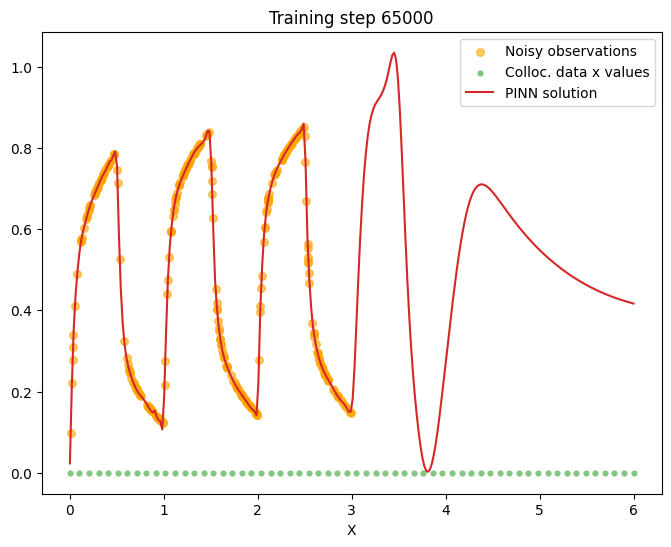

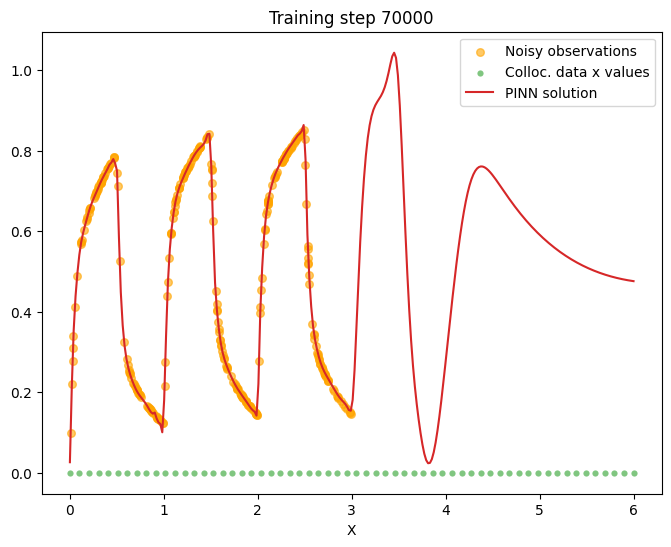

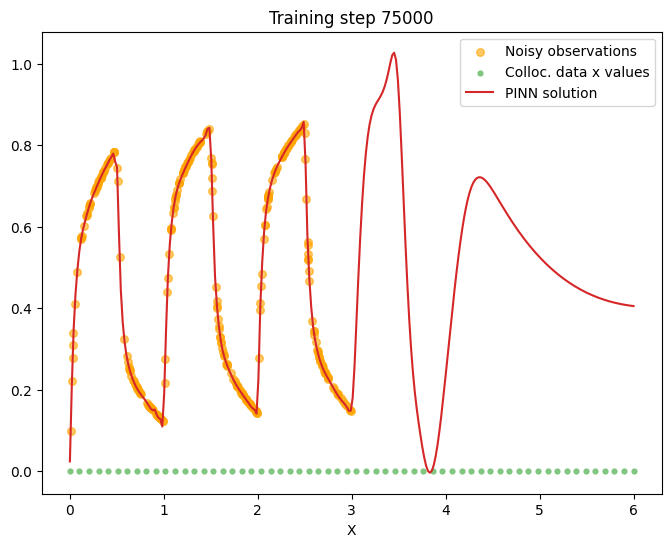

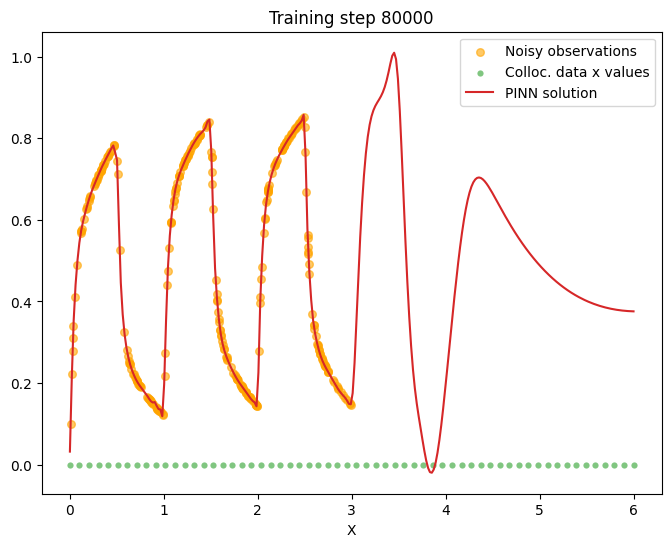

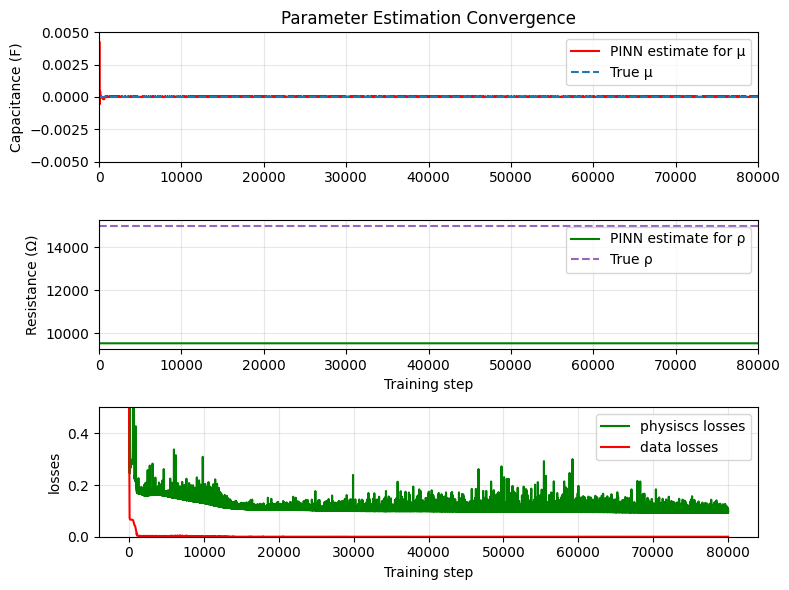


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000014, True = 0.000005, Error = 172.95%
ρ (Resistance): Predicted = 9521.535156, True = 15000.000000, Error = 36.52%


In [421]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)/10000) #reprecent C
mus1 = []
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*10000) #represents R
ros1 = []
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-2)
losses1=[]
losses2=[]
# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [mu1], 'lr': 1e-4},
    {'params': [ro1,lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    loss1 = torch.mean((dudt*(ro1 * mu1) + u- input_pulse(t_physics))**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(t_samples)
    loss2 = torch.mean((u - v1_noisy)**2)
    param_penalty = swish_penalty(mu1)+ swish_penalty(ro1)
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1 +param_penalty
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus1.append(mu1.item())
    ros1.append(ro1.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0], v1_noisy.detach()[:,0], s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")

In [422]:
R1*C1

0.07500000000000001

In [423]:
mu1*ro1

tensor([0.1299], grad_fn=<MulBackward0>)

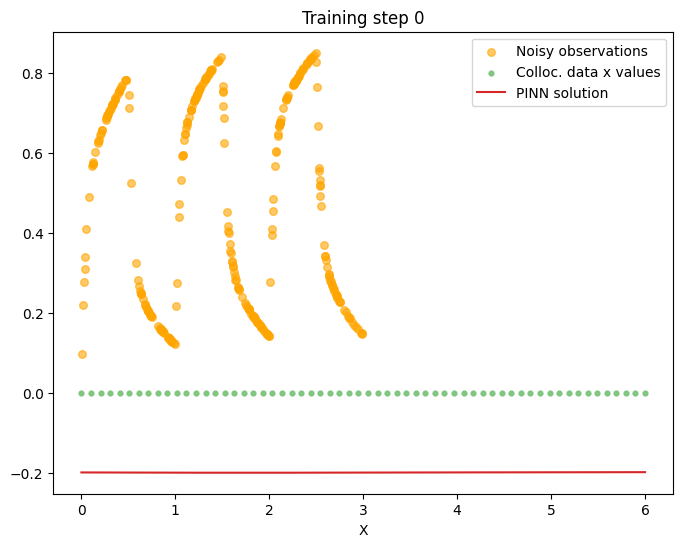

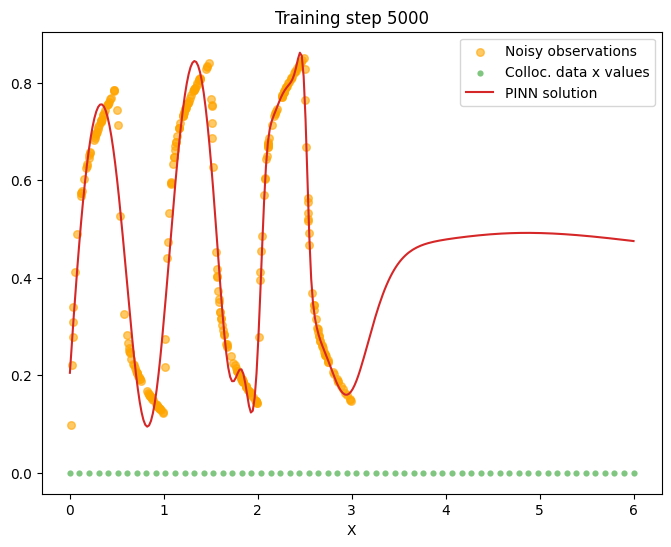

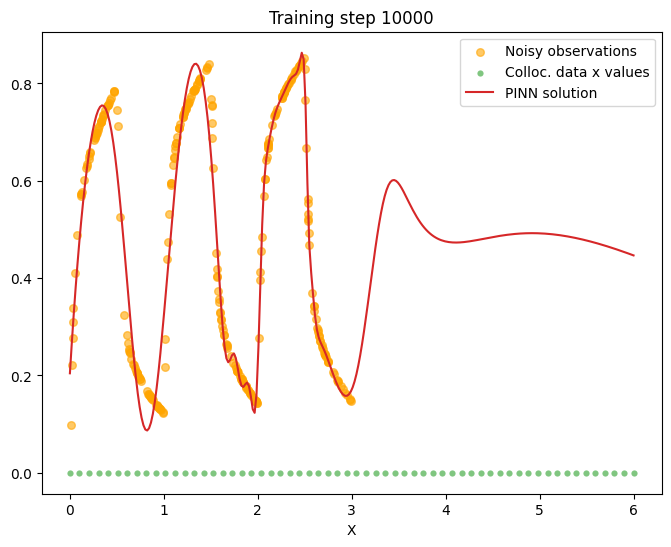

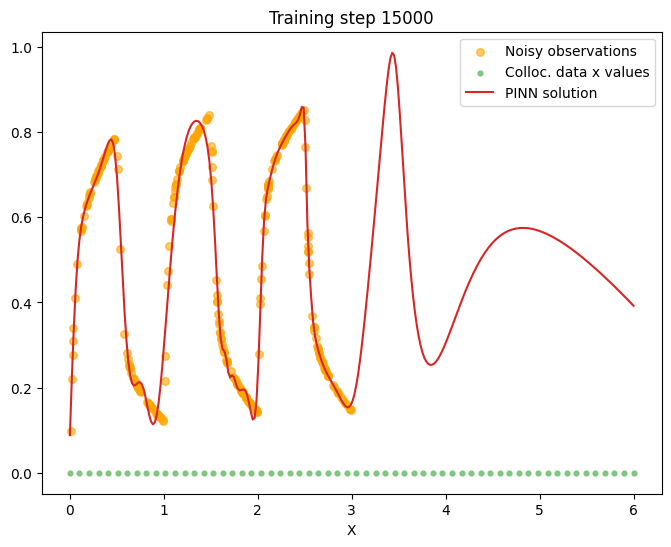

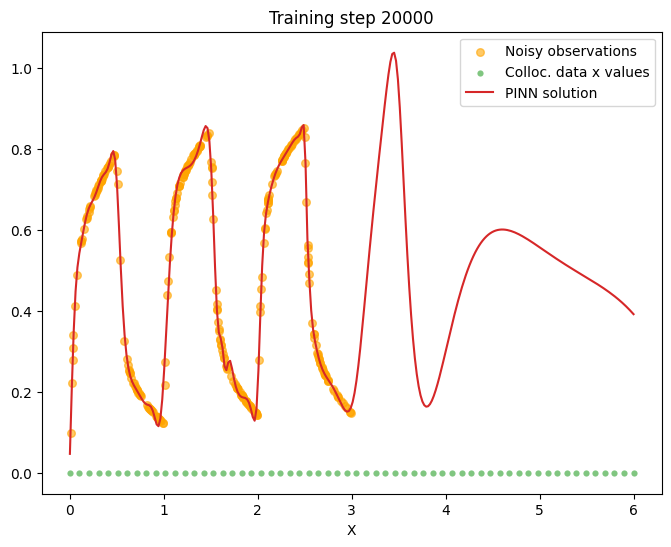

...

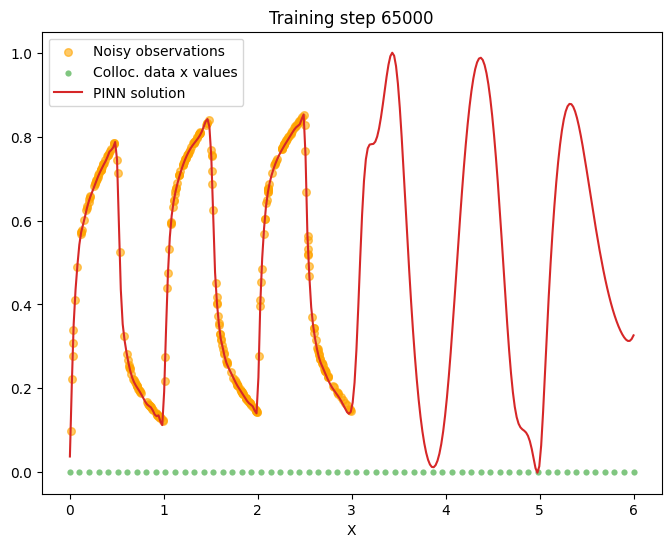

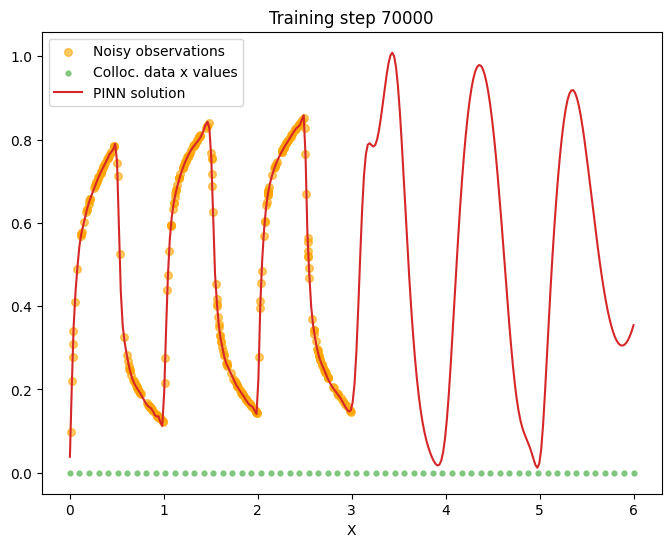

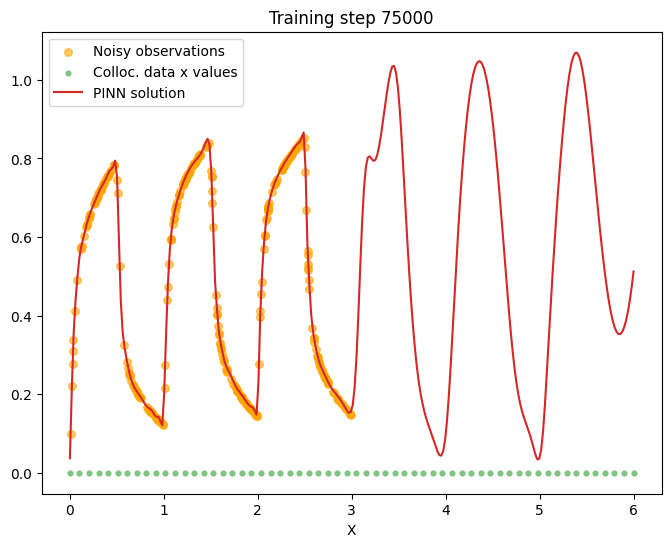

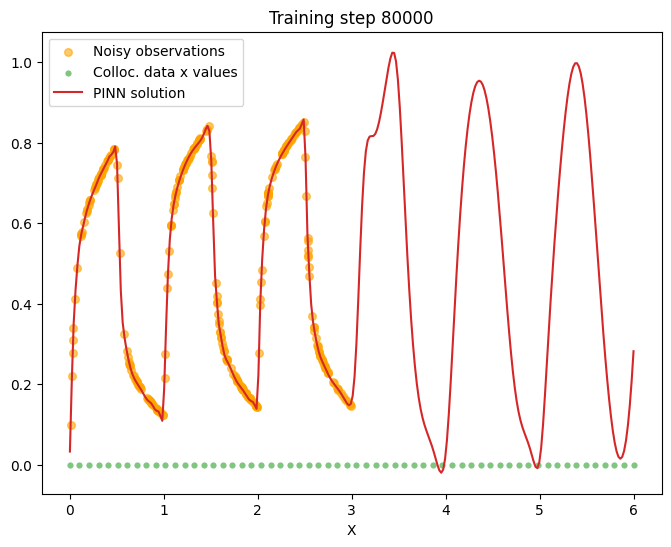

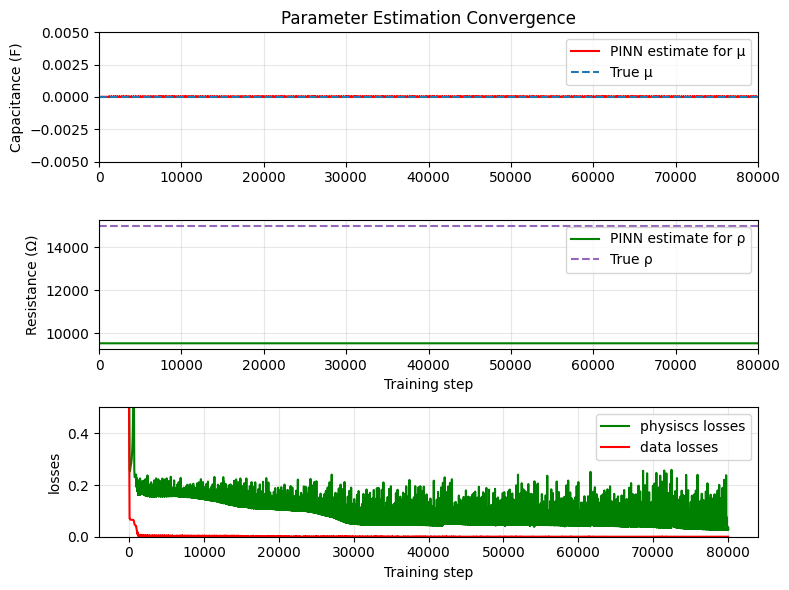


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000018, True = 0.000005, Error = 256.49%
ρ (Resistance): Predicted = 9521.535156, True = 15000.000000, Error = 36.52%


In [424]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300).view(-1,1)
# train the PINN ............
tau1=(mu1.detach()*ro1.detach())
# treat mu and ro as a learnable parameter ......
# ..............
mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)/10000) #reprecent C
mus1 = []
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*10000) #represents R
ros1 = []
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-2)
losses1=[]
losses2=[]
# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [mu1], 'lr': 1e-4},
    {'params': [ro1,lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    loss1 = torch.mean((dudt*(ro1 * mu1) + u- input_pulse(t_physics))**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(t_samples)
    loss2 = torch.mean((u - v1_noisy)**2)
    param_penalty = swish_penalty(mu1)+ swish_penalty(ro1)
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1 +param_penalty+(tau1-mu1*ro1)**2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus1.append(mu1.item())
    ros1.append(ro1.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0], v1_noisy.detach()[:,0], s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")

In [425]:
R1*C1

0.07500000000000001

In [427]:
tau1

tensor([0.1299])

In [426]:
mu1*ro1

tensor([0.1697], grad_fn=<MulBackward0>)

### V2

In [428]:
device='cpu'

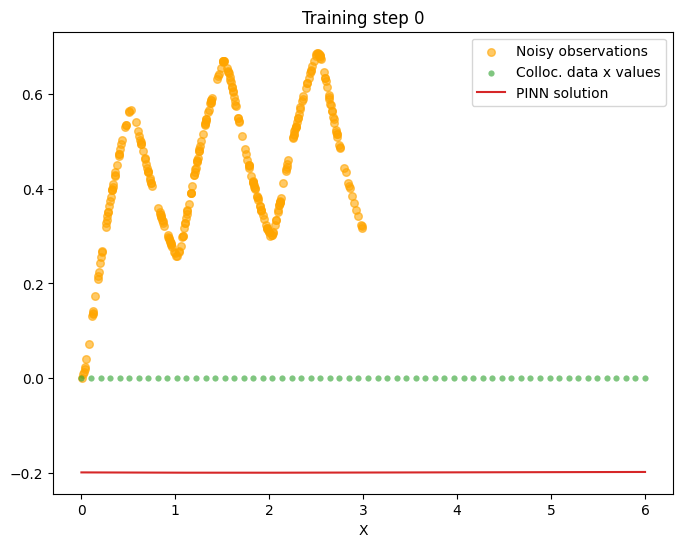

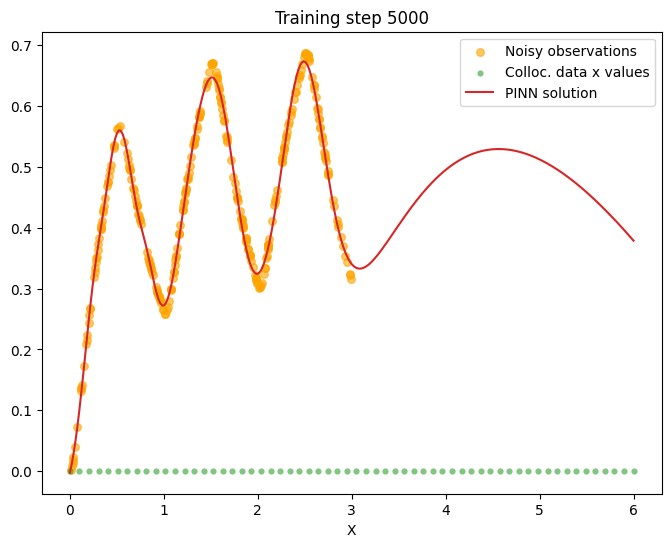

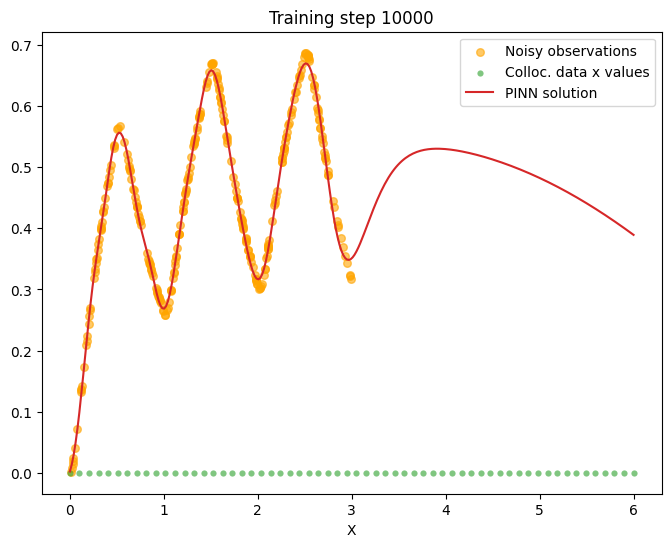

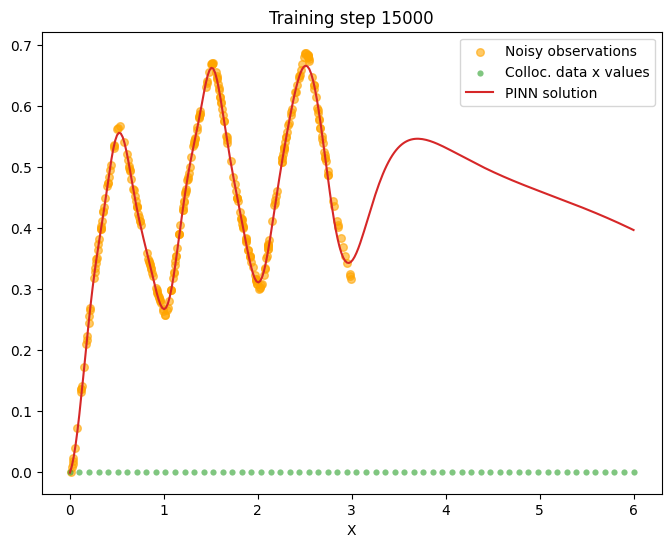

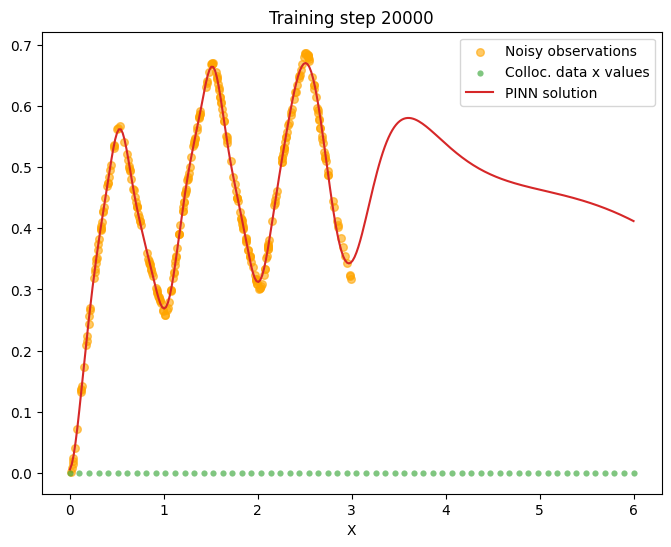

...

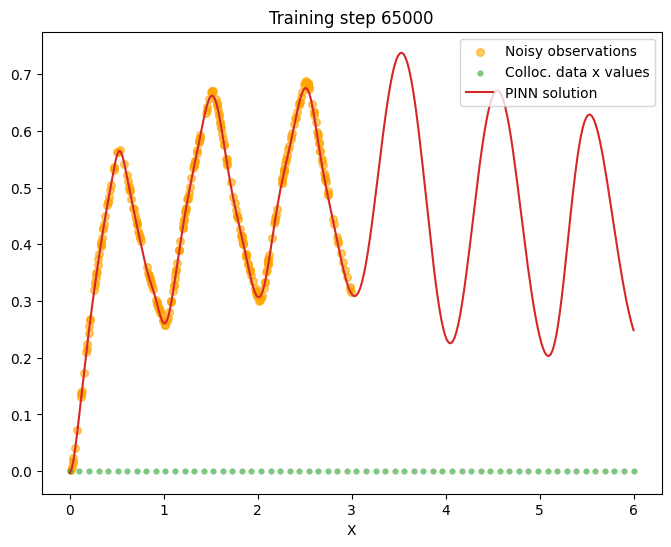

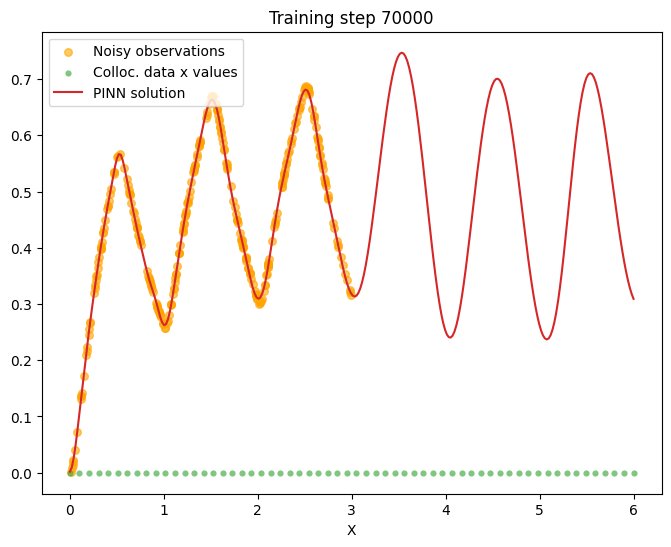

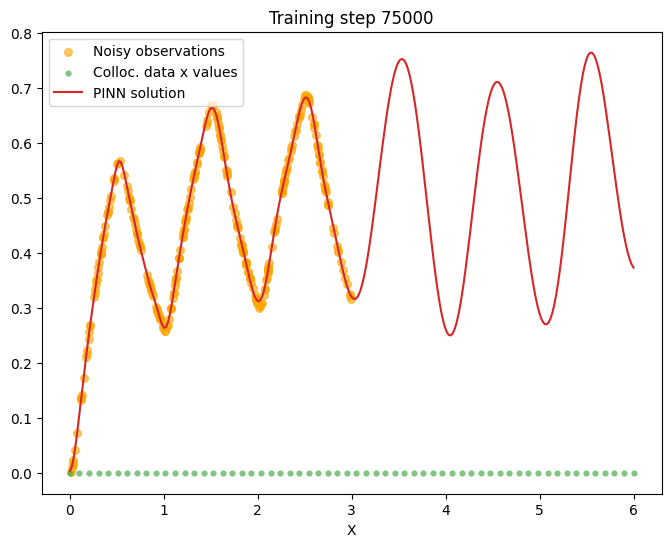

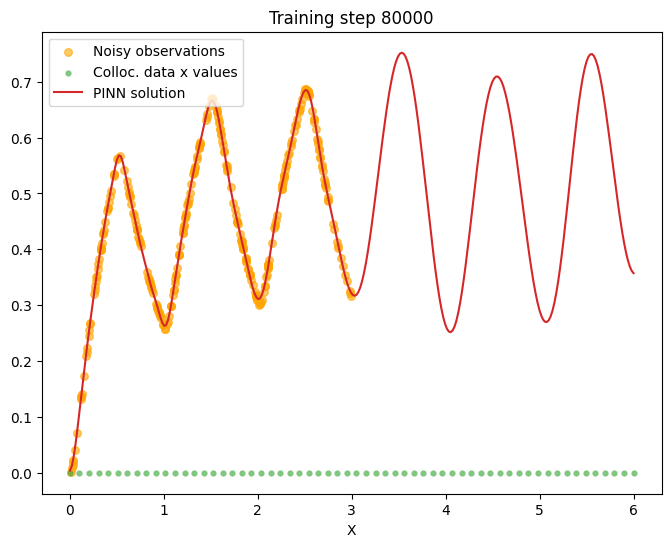

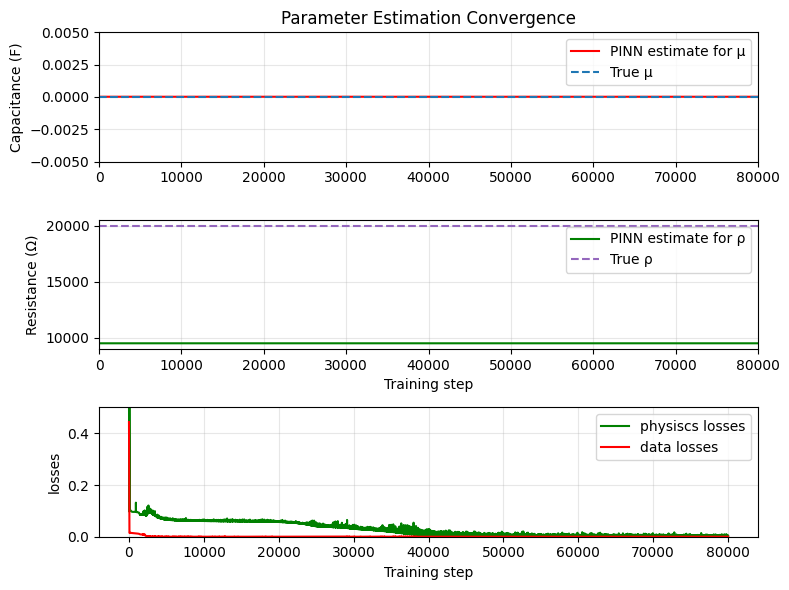


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000018, True = 0.000015, Error = 18.83%
ρ (Resistance): Predicted = 9521.535156, True = 20000.000000, Error = 52.39%


In [429]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinnv2 = FCN(1,1,20,5).to(device)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60,device=device).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300,device=device).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)/10000) #reprecent C
mus2 = []
ro2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*10000) #represents R
ros2 = []
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-1)
losses1=[]
losses2=[]
# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinnv2.parameters()},
    {'params': [mu2], 'lr': 1e-4},
    {'params': [ro2,lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinnv2(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    loss1 = torch.mean((dudt*(ro2 * mu2) + u- pinn(t_physics) )**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinnv2(t_samples)
    loss2 = torch.mean((u - v2_noisy)**2)


    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1#+ lamda2 * mu_penalty**2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus2.append(mu1.item())
    ros2.append(ro1.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinnv2(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].cpu(), v2_noisy.detach()[:,0].cpu(), s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0].cpu(), 
            torch.zeros_like(t_physics)[:,0].cpu(), s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0].cpu(), u[:,0].cpu(), label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus2, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C2, 0, len(mus2), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus2))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros2, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros2))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")

In [430]:
R2*C2

0.3

In [431]:
tau2=mu2*ro2
tau2=tau2.detach()

In [432]:
tau1,tau2

(tensor([0.1299]), tensor([0.2859]))

###  aprox. find a propper V2 signal (replaceing U1 with U input, for stability)


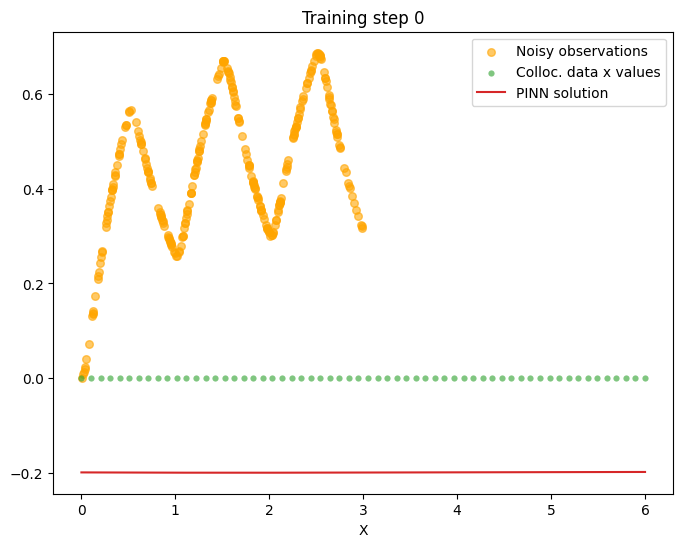

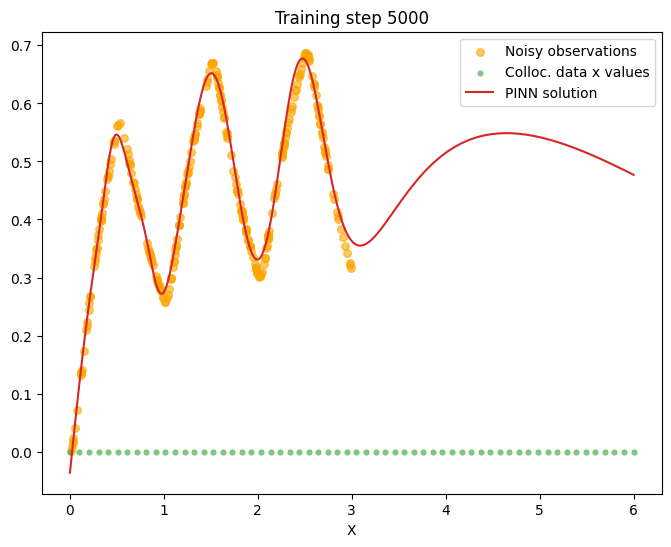

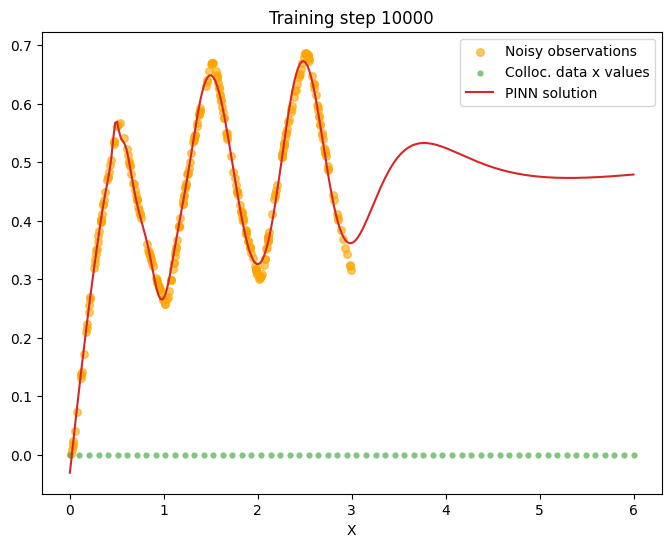

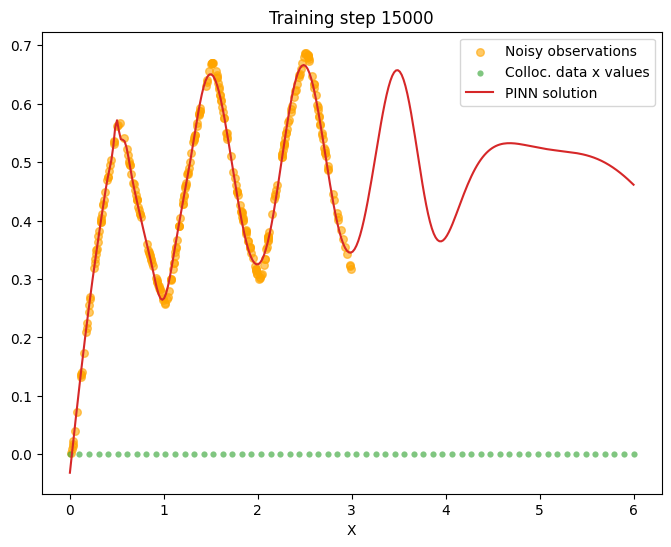

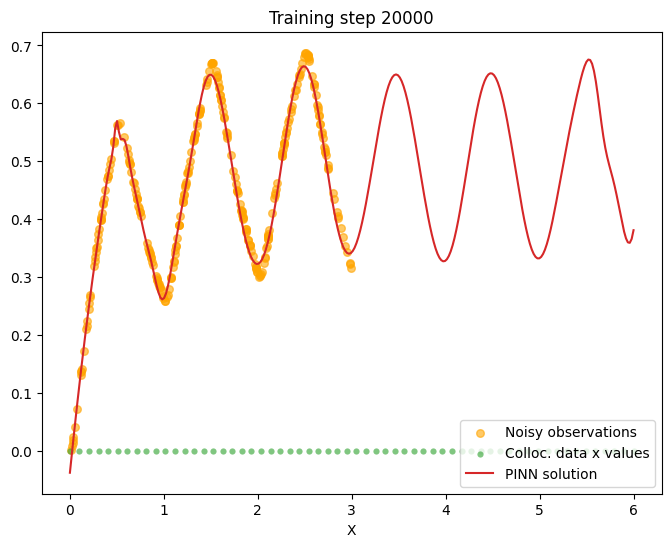

...

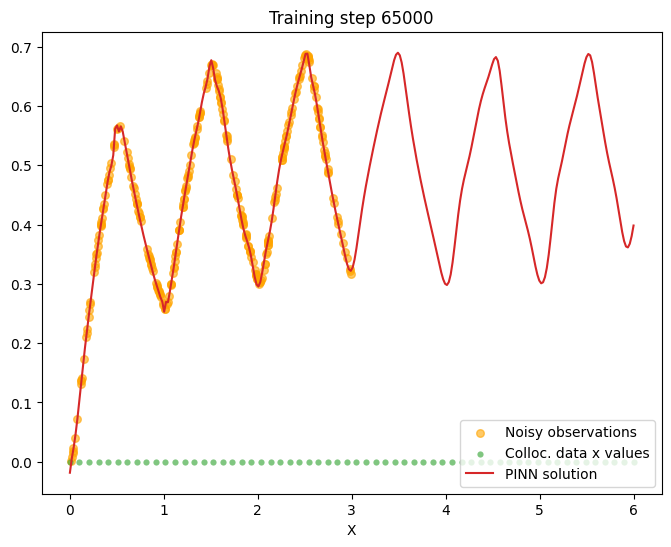

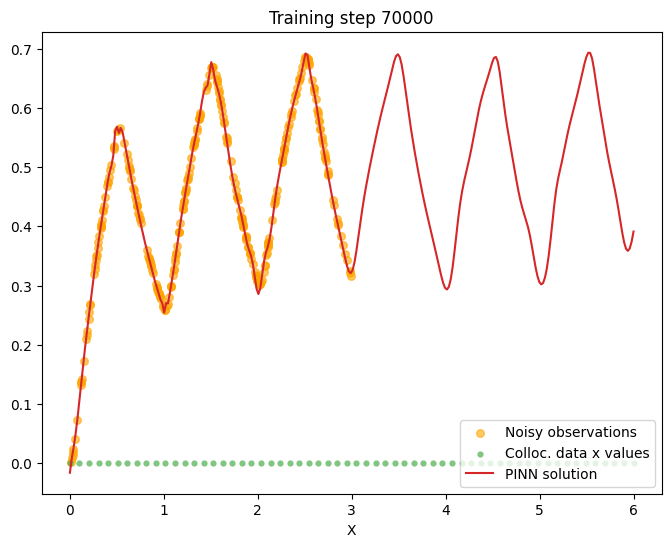

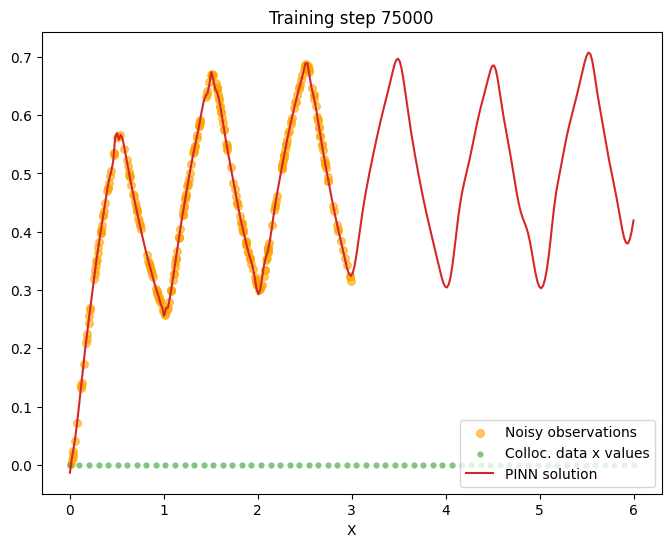

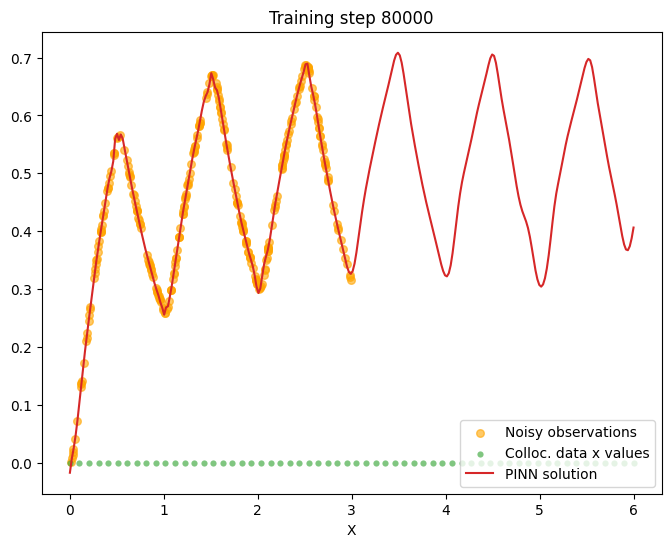

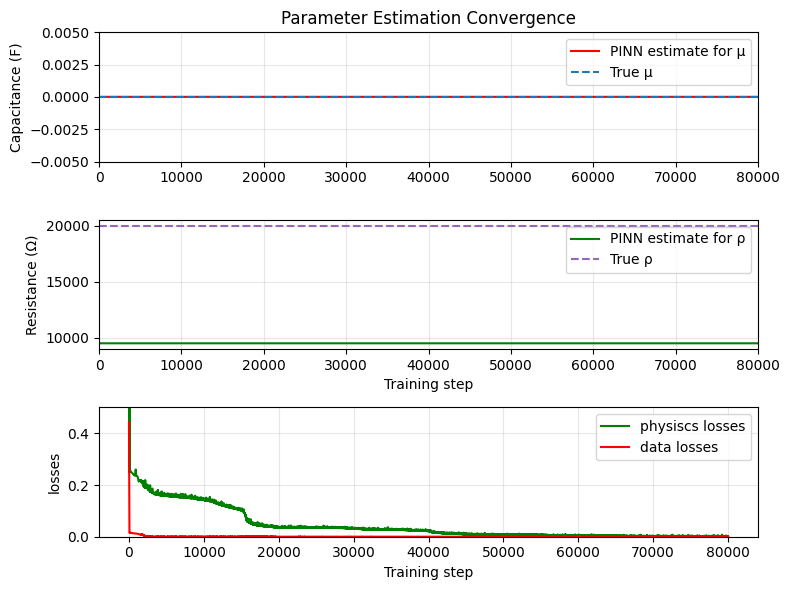


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000010, True = 0.000015, Error = 35.20%
ρ (Resistance): Predicted = 9521.535156, True = 20000.000000, Error = 52.39%


In [504]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinnv2 = FCN(1,1,20,5).to(device)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60,device=device).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300,device=device).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)/10000) #reprecent C
mus2 = []
ro2 = torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*10000) #represents R
ros2 = []
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-1)
losses1=[]
losses2=[]
# add mu to the optimiser
# .........................
optimiser = torch.optim.Adam([
    {'params': pinnv2.parameters()},
    {'params': [mu2], 'lr': 1e-4},
    {'params': [ro2,lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinnv2(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    loss1 = torch.mean((dudt*(ro2 * mu2) + u- input_pulse(t_physics) )**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinnv2(t_samples)
    loss2 = torch.mean((u - v2_noisy)**2)


    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1#+ lamda2 * mu_penalty**2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus2.append(mu1.item())
    ros2.append(ro1.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinnv2(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].cpu(), v2_noisy.detach()[:,0].cpu(), s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0].cpu(), 
            torch.zeros_like(t_physics)[:,0].cpu(), s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0].cpu(), u[:,0].cpu(), label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus2, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C2, 0, len(mus2), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus2))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros2, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R2, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros2))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus2[-1]:.6f}, True = {C2:.6f}, Error = {abs(mus2[-1]-C2)/C2*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros2[-1]:.6f}, True = {R2:.6f}, Error = {abs(ros2[-1]-R2)/R2*100:.2f}%")

In [350]:
tau1,tau2

(tensor([0.0619]), tensor([0.2333]))

### given V2 params find V1 

In [507]:
u2 = pinnv2(t_physics) #in this case Vout or Vc (the same)
du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]

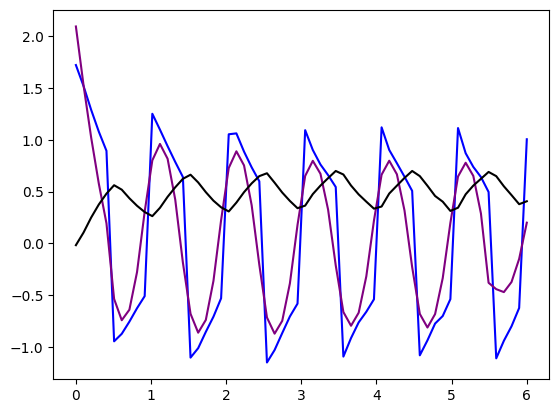

In [523]:
du2dt_f = savgol_filter(du2dt.detach().flatten(),window_length=10, polyorder=2)    
plt.plot(t_physics.detach().flatten(), du2dt.detach(), label=" du2/dt", color='blue')
plt.plot(t_physics.detach().flatten(), du2dt_f, label="Filtered du2/dt", color='purple')
plt.plot(t_physics.detach().flatten(), u2.detach(), label="Filtered du2/dt", color='black')

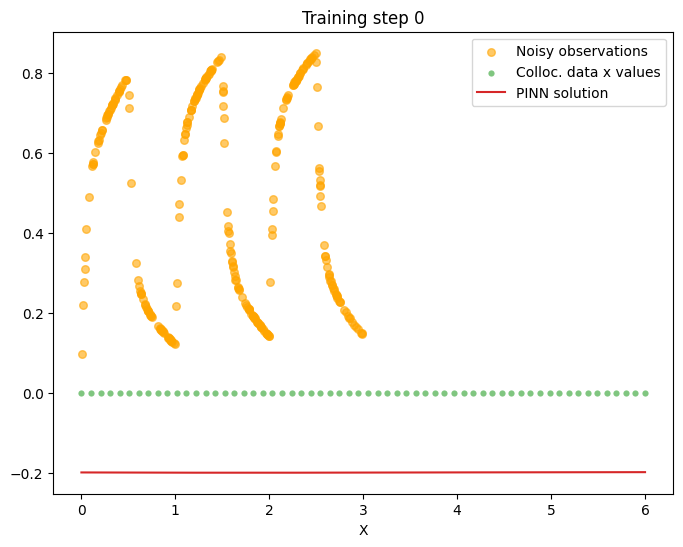

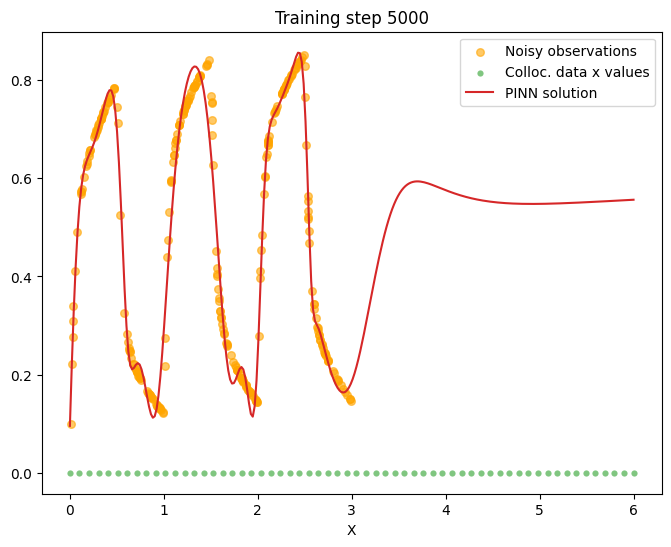

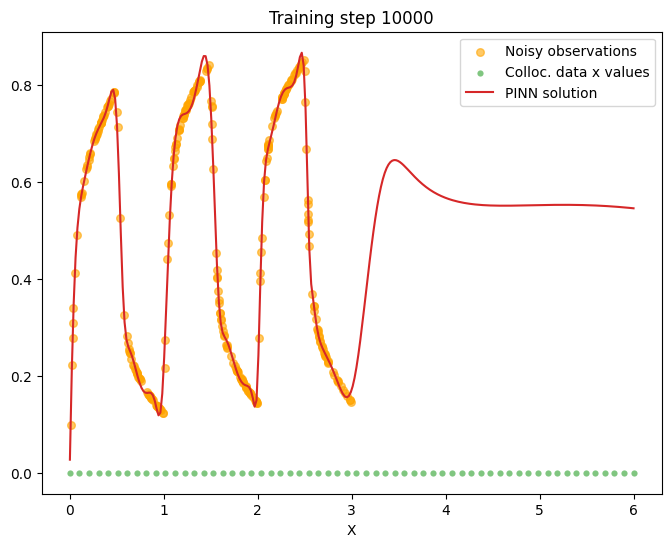

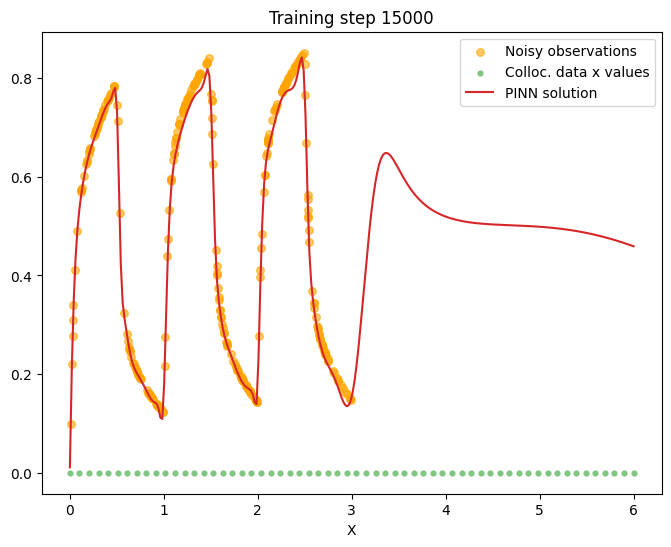

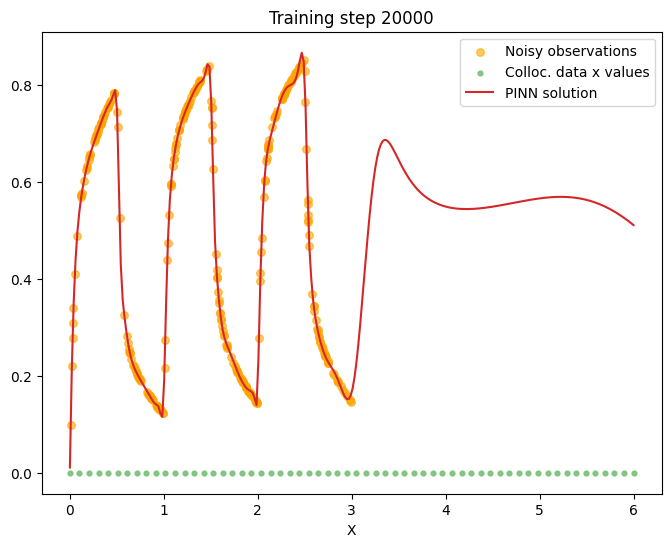

...

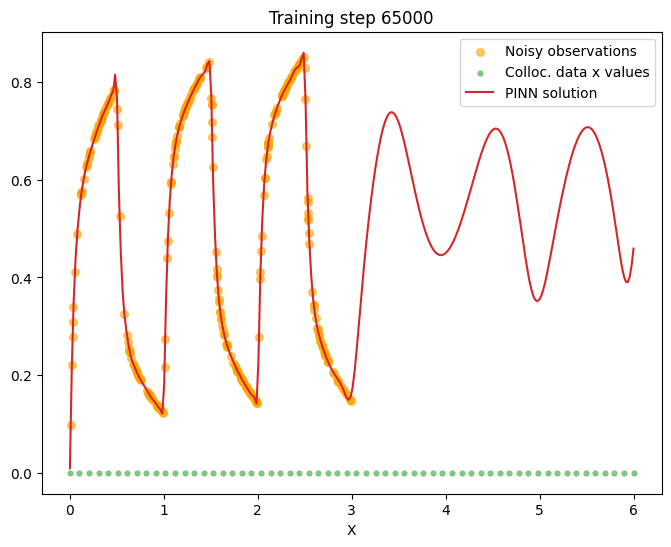

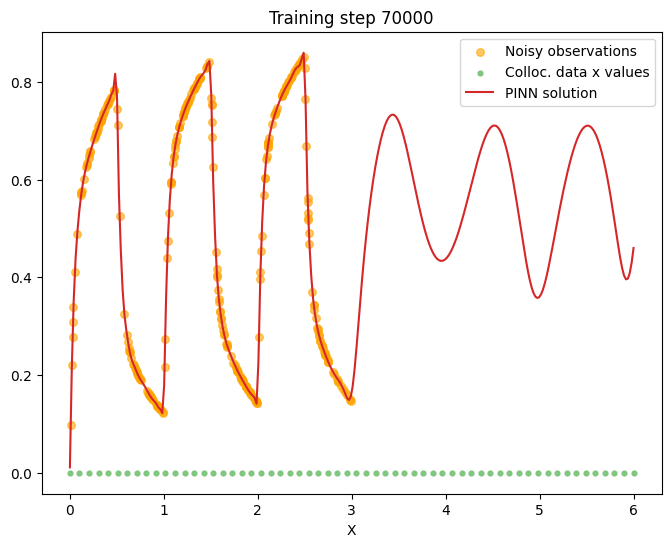

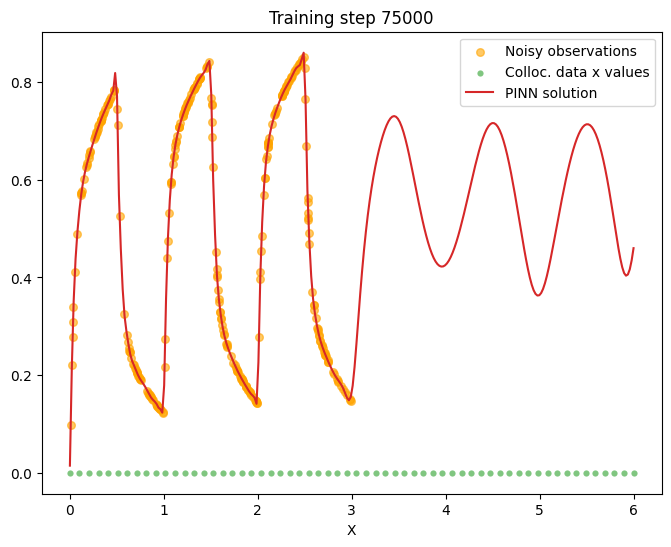

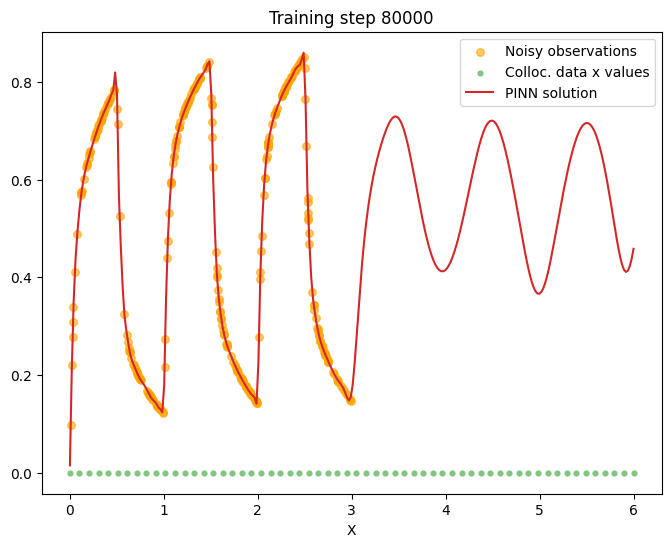

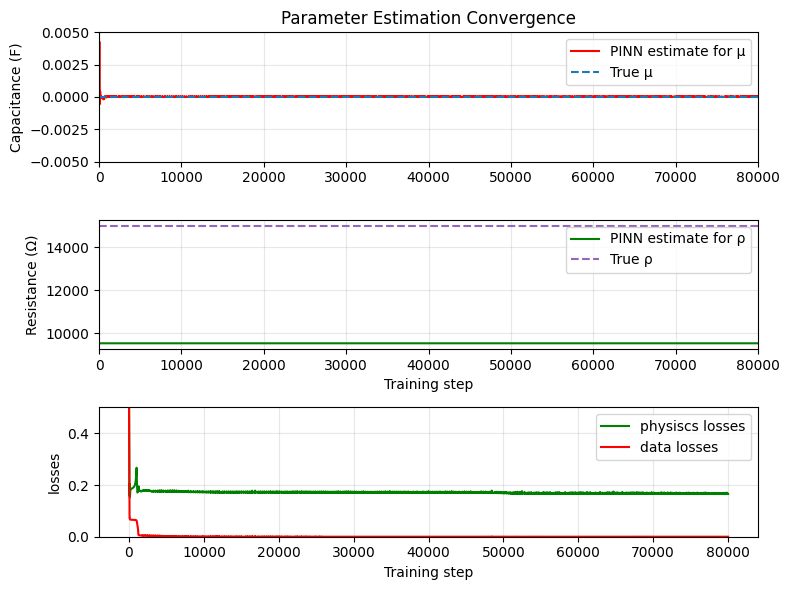


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000010, True = 0.000005, Error = 94.39%
ρ (Resistance): Predicted = 9521.535156, True = 15000.000000, Error = 36.52%


In [524]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5).to(device)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60,device=device).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300,device=device).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True,device=device)*1e-2)
losses1=[]
losses2=[]
# add mu to the optimiser

# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn(t_physics)
    u2 = pinnv2(t_physics) #in this case Vout or Vc (the same)
    du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    du2dt = torch.tensor(savgol_filter(du2dt.detach().flatten(),window_length=11, polyorder=2) )
    

    # Get the second-order sections (SOS) representation for stability
    
    loss1 = torch.mean((du2dt*(ro2.detach() * mu2.detach()) + u2.detach()- u )**2)
    
    # compute data loss ..............
    # from observed data (training data points) 
    u = pinn(t_samples)
    loss2 = torch.mean((u - v1_noisy)**2)


    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1#+ lamda2 * mu_penalty**2
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
   
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].cpu(), v1_noisy.detach()[:,0].cpu(), s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0].cpu(), 
            torch.zeros_like(t_physics)[:,0].cpu(), s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0].cpu(), u[:,0].cpu(), label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")

In [525]:
R1*C1

0.07500000000000001

In [526]:
mu1*ro1,mu2*ro2

(tensor([0.0925], grad_fn=<MulBackward0>),
 tensor([0.5923], grad_fn=<MulBackward0>))

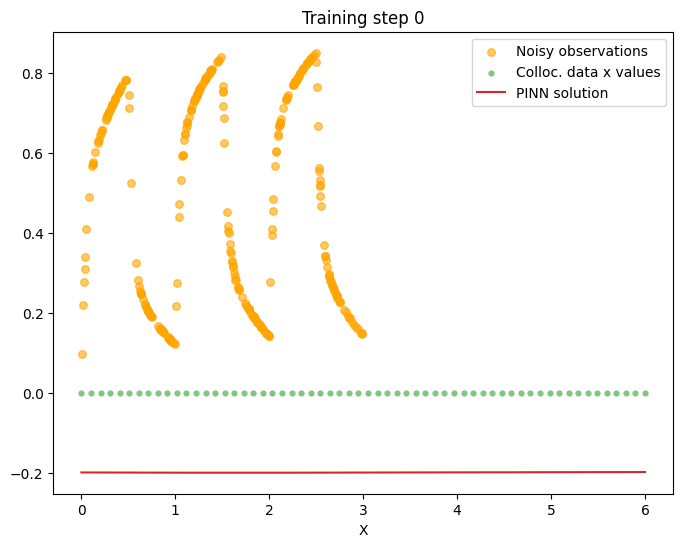

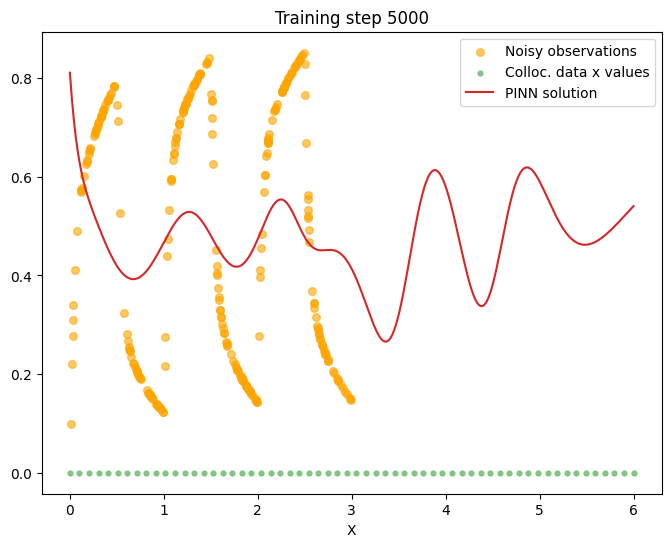

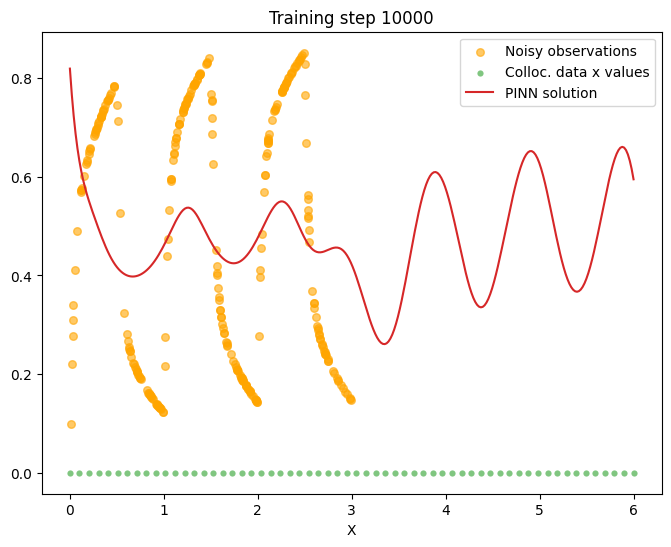

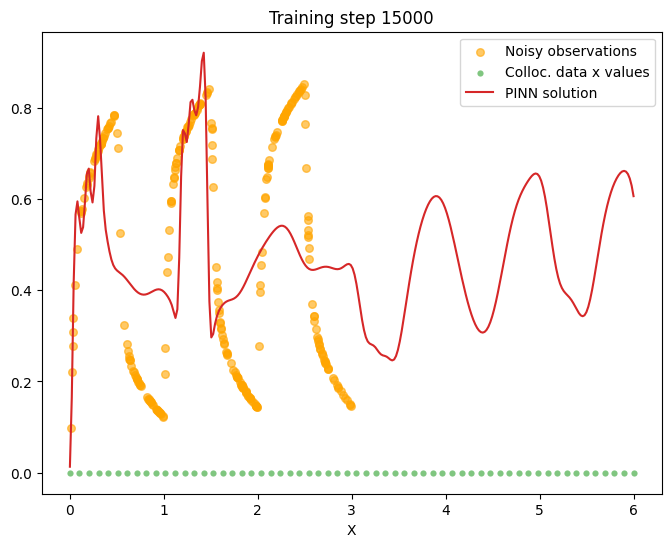

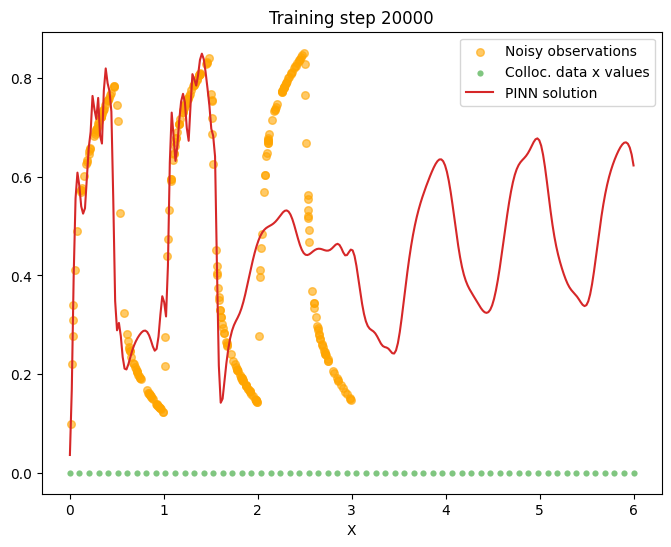

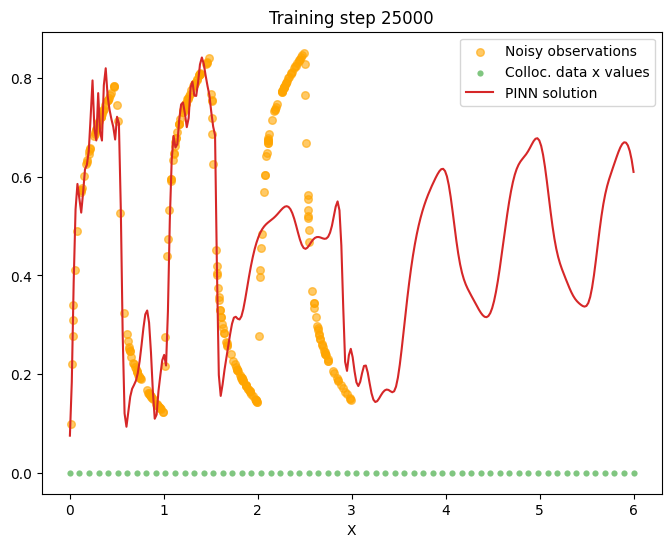

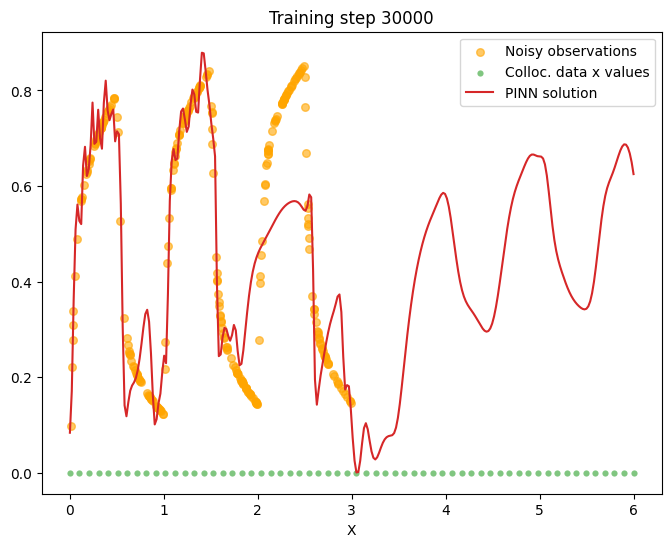

KeyboardInterrupt: 

In [449]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn = FCN(1,1,20,5)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............
mu1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)/10000) #reprecent C
mus1 = []
ro1 = torch.nn.Parameter(torch.rand(1, requires_grad=True)*10000) #represents R
ros1 = []
lambda1=torch.tensor(1e-1)
losses1=[]
losses2=[]
# add mu to the optimiser
tau2= mu2*ro2
tau2= tau2.detach() # we do not want to train this parameter
mu2=torch.nn.Parameter(torch.rand(1, requires_grad=True)/10000) #reprecent C
ro2=torch.nn.Parameter(torch.rand(1, requires_grad=True)*10000) #represents R
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn.parameters()},
    {'params': [mu1,mu2], 'lr': 1e-4},
    {'params': [ro1,ro2], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
u2=pinnv2(t_physics).detach()
du2dt = (torch.autograd.grad(pinnv2(t_physics), t_physics, torch.ones_like(u2), create_graph=True)[0]).detach()
for i in range(100001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn(t_physics) #in this case Vout or Vc (the same)
    dudt = torch.autograd.grad(u, t_physics, torch.ones_like(u), create_graph=True)[0] # we have a Dif. eq of the first degree
    
    #loss1 = torch.mean((dudt*(ro1 * mu1) + u- input_pulse(t_physics))**2)
    loss1= torch.mean((u+ro1*mu1*dudt+ro1*mu2*du2dt- input_pulse(t_physics) )**2)+torch.mean(((input_pulse(t_physics)-u)/ro1 -(u-u2)/ro2- mu1*dudt)**2)
    #loss1= torch.mean(((input_pulse(t_physics)-u)/ro1 -(u-u2)/ro2- mu1*dudt)**2)
    # compute data loss ..............
    # from observed data (training data points)
    loss3=torch.mean((u-u2)**2) 
    u = pinn(t_samples)
    loss2 = torch.nn.SmoothL1Loss(reduction='mean')(u, v1_noisy)
    param_penalty = swish_penalty(mu1)+ swish_penalty(ro1)+swish_penalty(mu2)+ swish_penalty(ro2)
   
    #loss2b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)

    #lag linear aproximation 
    #output_penalty= torch.mean((torch.log(torch.abs(u1))-torch.log(torch.abs(u2))+t_physics *( mu1*ro1-mu2*ro2))**2)
    #output_penalty= torch.mean((mu2*ro2 -tau2)**2)
    # Data loss
    #u_pred = pinn(t_samples)
    #loss4 = torch.mean((u_pred[:,1].view(-1,1) - v1_noisy )**2+ (u_pred[:,0].view(-1,1) - v2_noisy)**2)
    #param_penalty = swish_penalty(mu1)+swish_penalty(mu2) +swish_penalty(ro2)+ swish_penalty(ro1)
    # Combined loss
    
    #loss = torch.sigmoid(lambda1)*loss4 +(1-torch.sigmoid(lambda1))*(loss2+loss1) + lambda2*param_penalty+0.01*output_penalty 

    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1+ 1e2*param_penalty+ (mu2*ro2 -tau2)**2 + (mu1*ro1 -tau1)**2 +0.001*lambda1*loss3 
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    mus1.append(mu1.item())
    ros1.append(ro1.item())
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0], v1_noisy.detach()[:,0], s=30,label="Noisy observations", alpha=0.6, color="orange")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")

In [435]:
losses1[-1], losses2[-1]

(0.16712543368339539, 0.006440719589591026)

In [414]:
losses1[-1], losses2[-1]

(0.004957125522196293, 8.052839984884486e-05)

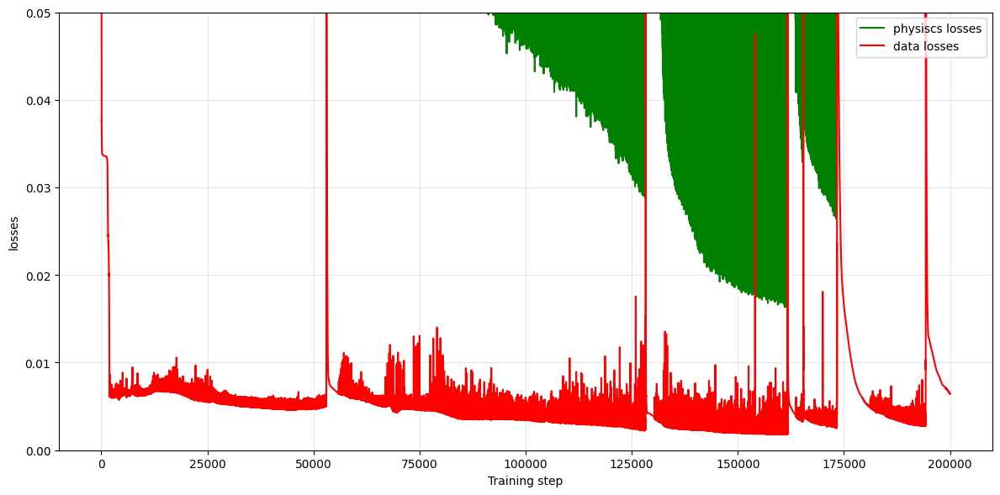

In [436]:
plt.figure(figsize=(12, 6))
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.05)
plt.tight_layout()
plt.show()

In [ ]:
R1

(tensor([4.7846], grad_fn=<MulBackward0>),
 tensor([-4.9169], grad_fn=<MulBackward0>))

In [401]:
(ro2-R2)/ R2*100, (mu2-C2)/C2*100

(tensor([-72.6469], grad_fn=<MulBackward0>),
 tensor([-2.1877], grad_fn=<MulBackward0>))

### get the direct problem solved   

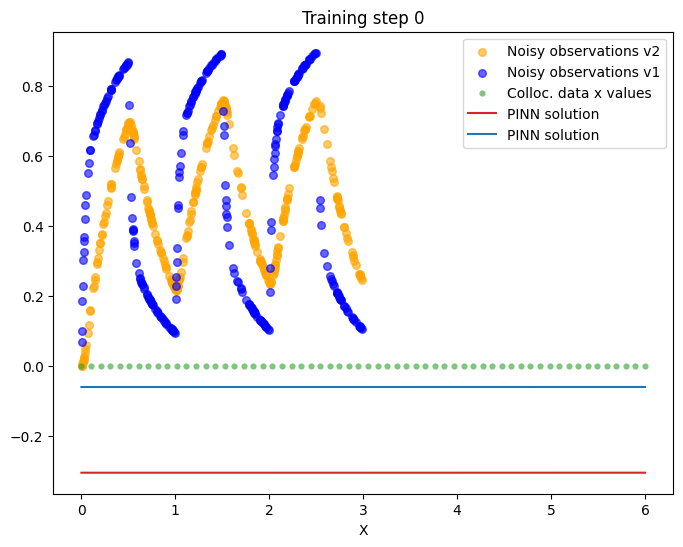

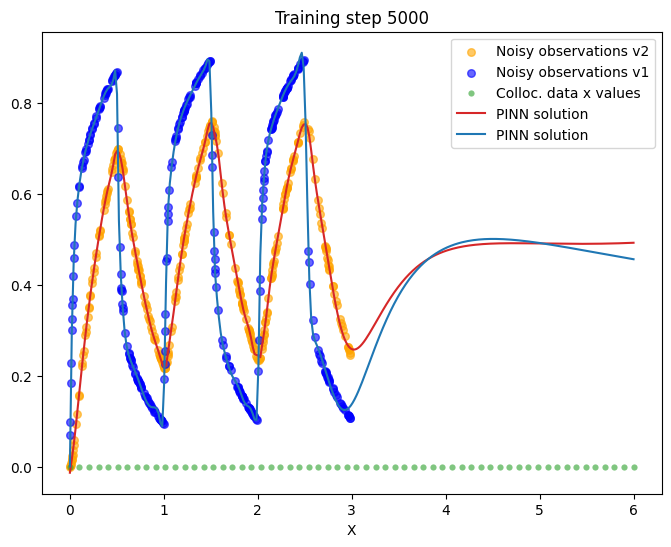

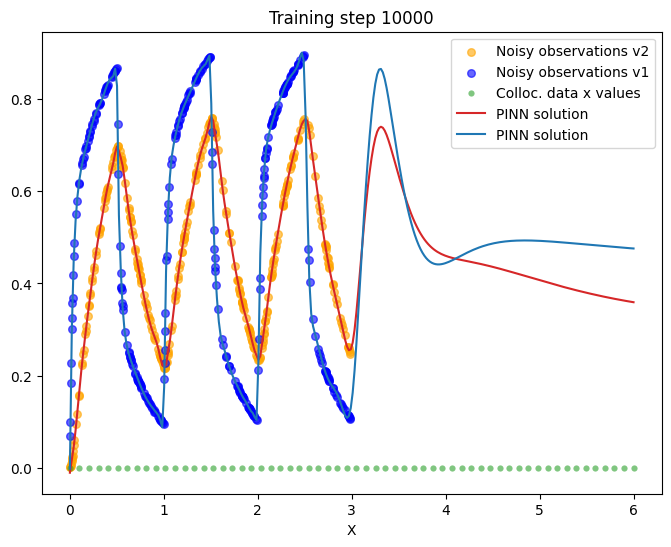

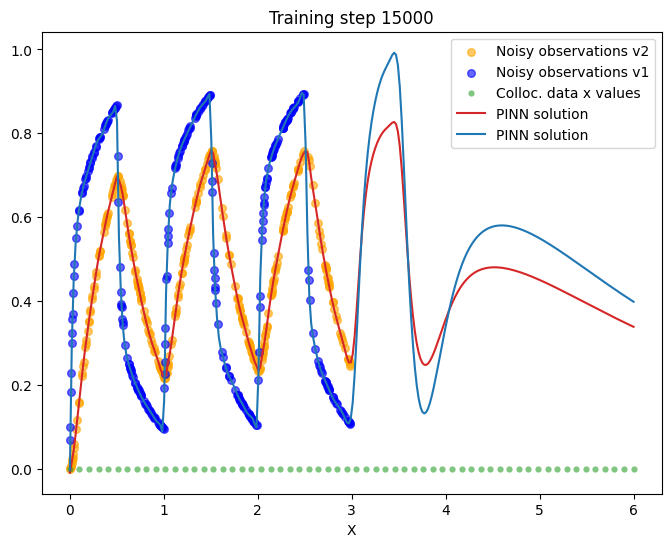

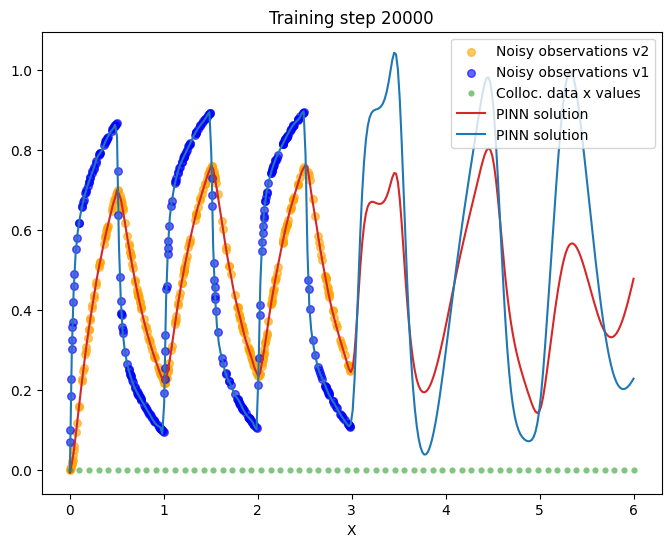

...

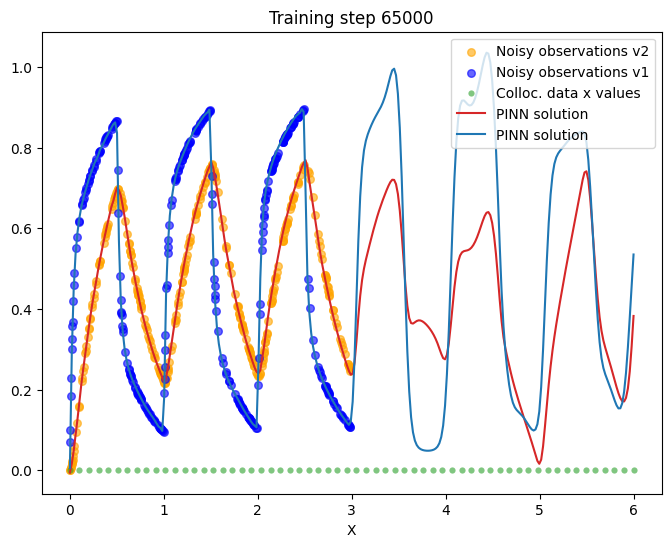

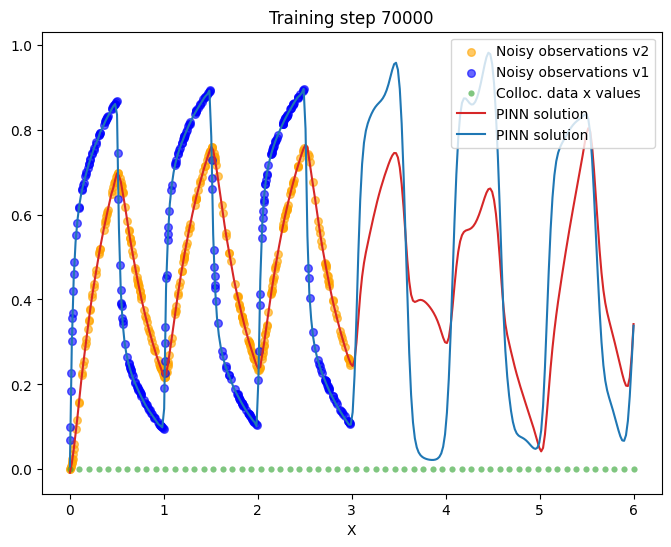

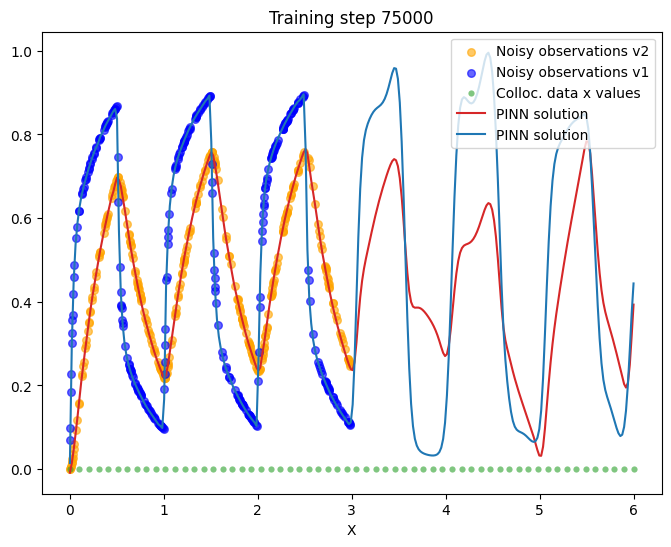

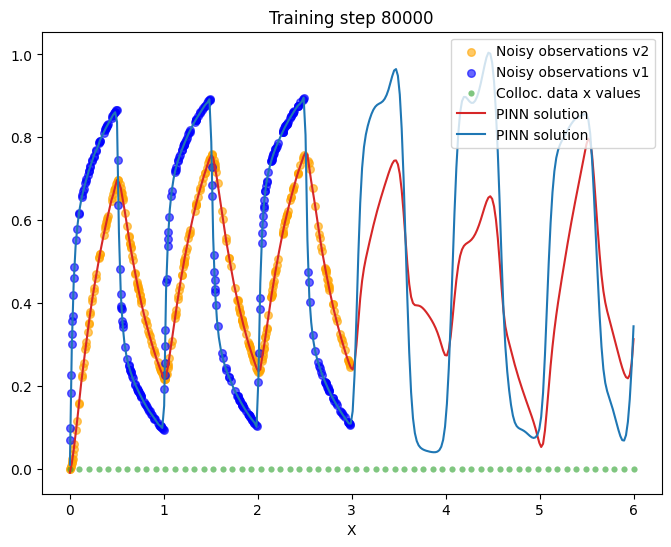

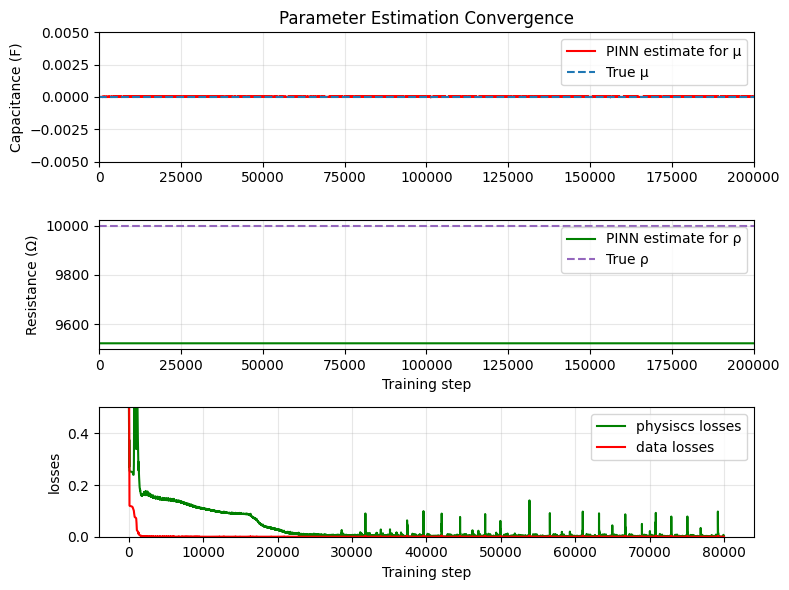


Final Parameter Estimates:
μ (Capacitance): Predicted = 0.000004, True = 0.000005, Error = 20.31%
ρ (Resistance): Predicted = 9521.535156, True = 10000.000000, Error = 4.78%


In [417]:
# random initialization of weights .......
torch.manual_seed(7777)

# define a neural network to train ...
pinn_dir = FCN(1,2,20,8)

# define training points over the entire domain, for the physics loss
t_physics = torch.linspace(t_start,t_end,60).view(-1,1).requires_grad_(True)
#t_physics = torch.rand(33).view(-1,1).requires_grad_(True)
#test intreval 
t_test = torch.linspace(0,6,300).view(-1,1)
# train the PINN ............

# treat mu and ro as a learnable parameter ......
# ..............

lambda1=torch.nn.Parameter(torch.rand(1, requires_grad=True)*1e-2)
losses1=[]
losses2=[]
# add mu to the optimiser
mu1 = mu1.detach()
ro1 = ro1.detach()
mu2=mu2.detach()
ro2=ro2.detach()
v2=pinnv2(t_physics).detach()
v1=pinn(t_physics).detach()
# .........................
optimiser = torch.optim.Adam([
    {'params': pinn_dir.parameters()},
    {'params': [lambda1], 'lr': 1e-8} # by coosing the lr we make more or less dynamic a parameters, 
    #if our initial guess is good enough we better reduce lr so the other parameters adapt to the parameter that has the best initial guess  
])
for i in range(80001):
    optimiser.zero_grad()
    
    # compute each term of the PINN loss function above
    # .........................
    #lambda1 = 1e1
    
    # compute physics loss ..................
    u = pinn_dir(t_physics)
    u1=u[:,1].view(-1,1)
    u2=u[:,0].view(-1,1)
    du1dt = torch.autograd.grad(u1, t_physics, torch.ones_like(u1), create_graph=True)[0]
    du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]
    
    
    #loss1 = torch.mean((dudt*(ro1 * mu1) + u- input_pulse(t_physics))**2)
    loss1= torch.mean((u1+ro1*mu1*du1dt+ro1*mu2*du2dt- input_pulse(t_physics) )**2)+torch.mean(((input_pulse(t_physics)-u1)/ro1 -(u1-u2)/ro2- mu1*du1dt)**2)
    #loss1= torch.mean(((input_pulse(t_physics)-u1)/ro1 -(u1-u2)/ro2- mu1*du1dt)**2)
    # compute data loss ..............
    # from observed data (training data points) 
    loss3=torch.mean((u1-v1)**2)+torch.mean((u2-v2)**2)
    u = pinn_dir(t_samples)
    u1=u[:,1].view(-1,1)
    u2=u[:,0].view(-1,1)
    loss2 = torch.mean((u1 - v1_noisy )**2+ (u2 - v2_noisy)**2)
    param_penalty = swish_penalty(mu1)+ swish_penalty(ro1)
   
    #loss2b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)

    #lag linear aproximation 
    #output_penalty= torch.mean((torch.log(torch.abs(u1))-torch.log(torch.abs(u2))+t_physics *( mu1*ro1-mu2*ro2))**2)
    #output_penalty= torch.mean((mu2*ro2 -tau2)**2)
    # Data loss
    #u_pred = pinn(t_samples)
    #loss4 = torch.mean((u_pred[:,1].view(-1,1) - v1_noisy )**2+ (u_pred[:,0].view(-1,1) - v2_noisy)**2)
    #param_penalty = swish_penalty(mu1)+swish_penalty(mu2) +swish_penalty(ro2)+ swish_penalty(ro1)
    # Combined loss
    
    #loss = torch.sigmoid(lambda1)*loss4 +(1-torch.sigmoid(lambda1))*(loss2+loss1) + lambda2*param_penalty+0.01*output_penalty 

    #mu_penalty = torch.relu(-mu)  # ReLU(-μ) returns -μ when μ<0, else 0
    #lamda2 = 1e10
    # backpropagate joint loss, take optimiser step
    loss = (1-lambda1)*loss2 + lambda1*loss1+ 1e2*param_penalty+0.1*lambda1*loss3
    loss.backward()
    optimiser.step()
    
    # record mu value
    # ....................
    
    losses1.append(loss1.item())
    losses2.append(loss2.item())
    
    # plot the result as training progresses
    if i % 5000 == 0: 
        u = pinn_dir(t_test).detach()
        plt.figure(figsize=(8, 6))
        plt.scatter(t_samples[:,0].detach(), v2_noisy[:,0].detach(), s=30,label="Noisy observations v2", alpha=0.6, color="orange")
        plt.scatter(t_samples[:,0].detach(), v1_noisy[:,0].detach(), s=30,label="Noisy observations v1", alpha=0.6, color="blue")
        plt.scatter(t_physics.detach()[:,0], 
            torch.zeros_like(t_physics)[:,0], s=20, lw=0, color="tab:green", alpha=0.6, label="Colloc. data x values")
        plt.plot(t_test[:,0], u[:,0], label="PINN solution", color="tab:red")
        plt.plot(t_test[:,0], u[:,1], label="PINN solution", color="tab:blue")
        plt.title(f"Training step {i}")
        plt.xlabel("X")
        plt.legend()
        plt.show()

plt.figure(figsize=(8, 6))

# First subplot - μ estimation
plt.subplot(3, 1, 1)
plt.title("Parameter Estimation Convergence")
plt.plot(mus1, label="PINN estimate for μ", color='red', linewidth=1.5)
plt.hlines(C1, 0, len(mus1), label="True μ", color="tab:blue", linestyle='--', linewidth=1.5)
plt.ylabel("Capacitance (F)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(mus1))
plt.ylim(-0.005,0.005)

# Second subplot - ρ estimation
plt.subplot(3, 1, 2)
plt.plot(ros1, label="PINN estimate for ρ", color='green', linewidth=1.5)
plt.hlines(R1, 0, len(ros1), label="True ρ", color="tab:purple", linestyle='--', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("Resistance (Ω)")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.xlim(0, len(ros1))

# Third subplot - losses
plt.subplot(3, 1, 3)
plt.plot(losses1, label="physiscs losses", color='green', linewidth=1.5)
plt.plot(losses2, label="data losses", color='red', linewidth=1.5)
#plt.plot(losses2+losses1, label="total losses", color='blue', linewidth=1.5)
plt.xlabel("Training step")
plt.ylabel("losses")
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.ylim(0,0.5)
plt.tight_layout()
plt.show()

# Print final values
print("\nFinal Parameter Estimates:")
print(f"μ (Capacitance): Predicted = {mus1[-1]:.6f}, True = {C1:.6f}, Error = {abs(mus1[-1]-C1)/C1*100:.2f}%")
print(f"ρ (Resistance): Predicted = {ros1[-1]:.6f}, True = {R1:.6f}, Error = {abs(ros1[-1]-R1)/R1*100:.2f}%")

# Grid search for optimal Hyperparameters and robust testing

## NN definition and other basic functions

In [2]:
class swish_activation(nn.Module):
    def forward(self, x):
        return x * torch.sigmoid(x)
def swish_penalty(x):
    act=swish_activation().forward(-x)
    if act<=0:
        act=0
    return act

# === Fully connected network ===
class FCN(nn.Module):
    def __init__(self, N_INPUT, N_OUTPUT, N_HIDDEN, N_LAYERS, activation_fn):
        super().__init__()
        activation = activation_fn
        self.fcs = nn.Sequential(
            nn.Linear(N_INPUT, N_HIDDEN),
            activation()
        )
        self.fch = nn.Sequential(*[
            nn.Sequential(
                nn.Linear(N_HIDDEN, N_HIDDEN),
                activation()
            ) for _ in range(N_LAYERS - 1)
        ])
        self.fce = nn.Linear(N_HIDDEN, N_OUTPUT)

    def forward(self, x):
        x = self.fcs(x)
        x = self.fch(x)
        x = self.fce(x)
        return x
    
class SimDataset(Dataset):
    def __init__(self, path_to_file, n_samples=100, t_start=None, t_end=None,device='cpu',dataset='RCfilter'):
        data = torch.load(path_to_file)
        self.device = device
        self.dataset = dataset
        if self.dataset == 'RCfilter_two':
            if t_start is not None and t_end is not None:
                mask = (data['t_samples'] >= t_start) & (data['t_samples'] <= t_end)
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['v2_noisy'] = data['v2_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            elif t_start is not None:
                mask = data['t_samples'] >= t_start
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['v2_noisy'] = data['v2_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            elif t_end is not None:
                mask = data['t_samples'] <= t_end
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['v2_noisy'] = data['v2_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            else:
                data['t_samples'] = data['t_samples']
                data['v1_noisy'] = data['v1_noisy']
                data['v2_noisy'] = data['v2_noisy']
                data['input_signal'] = data['input_signal']
            if n_samples > 0 and n_samples < len(data['t_samples']):
                indices = torch.randperm(len(data['t_samples']))[:n_samples]
                data['t_samples'] = data['t_samples'][indices]
                data['v1_noisy'] = data['v1_noisy'][indices]
                data['v2_noisy'] = data['v2_noisy'][indices]
                data['input_signal'] = data['input_signal'][indices]
            else:
                raise ValueError("n_samples must be a positive integer less than the number of samples in the dataset.")
            self.times = data['t_samples'].to(self.device)
            self.v1 = data['v1_noisy'].to(self.device)
            self.v2 = data['v2_noisy'].to(self.device)
            self.input_signal = data['input_signal'].to(self.device)
            self.R = data['R'].to(self.device)
            self.C = data['C'].to(self.device)
        elif self.dataset == 'RCfilter_one':
            if t_start is not None and t_end is not None:
                mask = (data['t_samples'] >= t_start) & (data['t_samples'] <= t_end)
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            elif t_start is not None:
                mask = data['t_samples'] >= t_start
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            elif t_end is not None:
                mask = data['t_samples'] <= t_end
                data['t_samples'] = data['t_samples'][mask]
                data['v1_noisy'] = data['v1_noisy'][mask]
                data['input_signal'] = data['input_signal'][mask]
            else:
                data['t_samples'] = data['t_samples']
                data['v1_noisy'] = data['v1_noisy']
                data['input_signal'] = data['input_signal']
            if n_samples > 0 and n_samples < len(data['t_samples']):
                indices = torch.randperm(len(data['t_samples']))[:n_samples]
                data['t_samples'] = data['t_samples'][indices]
                data['v1_noisy'] = data['v1_noisy'][indices]
                data['input_signal'] = data['input_signal'][indices]
            else:
                raise ValueError("n_samples must be a positive integer less than the number of samples in the dataset.")
            self.times = data['t_samples'].to(self.device)
            self.v1 = data['v1_noisy'].to(self.device)
            self.input_signal = data['input_signal'].to(self.device)
            self.R = data['R'].to(self.device)
            self.C = data['C'].to(self.device)
        elif self.dataset== 'damped_spring':
            if t_start is not None and t_end is not None:
                mask = (data['t_samples'] >= t_start) & (data['t_samples'] <= t_end)
                data['t_samples'] = data['t_samples'][mask]
                data['x_noisy'] = data['x_noisy'][mask]
                data['v_noisy'] = data['v_noisy'][mask]
            elif t_start is not None:
                mask = data['t_samples'] >= t_start
                data['t_samples'] = data['t_samples'][mask]
                data['x_noisy'] = data['x_noisy'][mask]
                data['v_noisy'] = data['v_noisy'][mask]
            elif t_end is not None:
                mask = data['t_samples'] <= t_end
                data['t_samples'] = data['t_samples'][mask]
                data['x_noisy'] = data['x_noisy'][mask]
                data['v_noisy'] = data['v_noisy'][mask]
            else:
                data['t_samples'] = data['t_samples']
                data['x_noisy'] = data['x_noisy']
                data['v_noisy'] = data['v_noisy']
            if n_samples > 0 and n_samples < len(data['t_samples']):
                indices = torch.randperm(len(data['t_samples']))[:n_samples]
                data['t_samples'] = data['t_samples'][indices]
                data['x_noisy'] = data['x_noisy'][indices]
                data['v_noisy'] = data['v_noisy'][indices]
            else:
                raise ValueError("n_samples must be a positive integer less than the number of samples in the dataset.")
            self.times = data['t_samples'].to(self.device)
            self.x = data['x_noisy'].to(self.device)
            self.v = data['v_noisy'].to(self.device)
            self.params = torch.tensor([data['m'], data['k'], data['b']], dtype=torch.float32, device=self.device)
        else:
            raise ValueError("Unsupported dataset. Supported datasets are 'RCfilter' and 'damped_spring'.")
            

    def __len__(self):
        return len(self.times)

    def __getitem__(self, idx):
        if self.dataset == 'RCfilter':
            return self.times[idx], self.v1[idx], self.v2[idx],self.input_signal[idx], self.R, self.C
        elif self.dataset == 'damped_spring':
            return self.times[idx], self.x[idx], self.v[idx], self.params
        
def nearest_interp_column(x, t_src, t_dst):
    # x: shape (n, 1), t_src: shape (n, 1), t_dst: shape (m, 1)
    t_src = t_src.squeeze(-1)  # shape (n,)
    t_dst = t_dst.squeeze(-1)  # shape (m,)
    x = x.squeeze(-1)          # shape (n,)

    # Nearest neighbor logic
    idx = torch.searchsorted(t_src, t_dst)
    idx0 = torch.clamp(idx - 1, 0, len(t_src) - 1)
    idx1 = torch.clamp(idx, 0, len(t_src) - 1)

    dist0 = torch.abs(t_dst - t_src[idx0])
    dist1 = torch.abs(t_dst - t_src[idx1])

    nearest_idx = torch.where(dist0 <= dist1, idx0, idx1)
    x_resampled = x[nearest_idx]

    return x_resampled.unsqueeze(-1)  # shape (m, 1)




## Datasets generation and preprocessing

### Damped harmonic oscillator


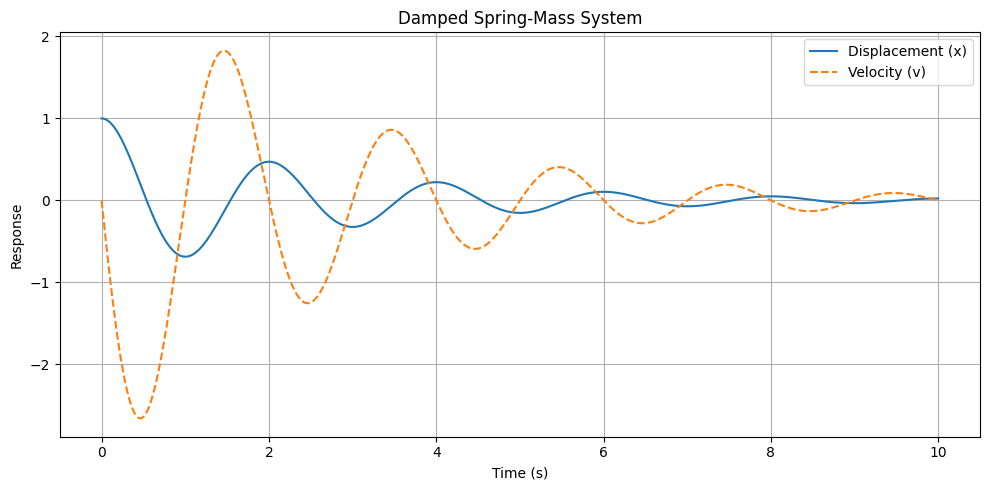

In [107]:
# Parameters
m = 2.0      # Mass (kg)
k = 20.0     # Spring constant (N/m)
c = 1.5      # Damping coefficient (Ns/m)

# System of first-order ODEs
def damped_spring(t, y):
    x, v = y
    dxdt = v
    dvdt = -(c/m)*v - (k/m)*x
    return [dxdt, dvdt]

# Initial conditions
x0 = 1.0  # initial displacement (m)
v0 = 0.0  # initial velocity (m/s)

# Time span
t_span = (0, 10)  # from 0 to 10 seconds
t_eval = np.linspace(*t_span, 50000)

# Solve the ODE
solution = solve_ivp(damped_spring, t_span, [x0, v0], t_eval=t_eval)

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(solution.t, solution.y[0], label='Displacement (x)')
plt.plot(solution.t, solution.y[1], label='Velocity (v)', linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('Response')
plt.title('Damped Spring-Mass System')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [108]:
def sample_noisy_spring_data(sol, n_samples, noise_lev=0.01, t_start=None, t_end=None, device='cpu'):
    """
    Samples random points from the damped spring ODE solution with added noise on displacement and velocity.

    Args:
        sol: ODE solution object from solve_ivp (with .t and .y attributes)
        n_samples: Number of points to sample
        noise_lev: Noise scaling factor (std of Gaussian noise)
        t_start: Optional start time for sampling window
        t_end: Optional end time for sampling window
        device: Torch device to place output tensors

    Returns:
        Tuple of (time_points, displacement_points, velocity_points) as torch Tensors, each (n_samples, 1)
    """
    # Extract solution components
    sol_times = sol.t
    displacement = sol.y[0]
    velocity = sol.y[1]
    
    # Define time bounds
    t_min = t_start if t_start is not None else sol_times[0]
    t_max = t_end if t_end is not None else sol_times[-1]
    
    # Apply time mask
    valid_mask = (sol_times >= t_min) & (sol_times <= t_max)
    valid_times = sol_times[valid_mask]
    valid_disp = displacement[valid_mask]
    valid_vel = velocity[valid_mask]
    
    # Check sampling feasibility
    if len(valid_times) < n_samples:
        raise ValueError(f"Only {len(valid_times)} points available in time window, but requested {n_samples}")
    
    # Random sampling
    rand_indices = np.random.choice(len(valid_times), size=n_samples, replace=False)
    
    # Convert to torch tensors
    t_samples = torch.tensor(valid_times[rand_indices], dtype=torch.float32, device=device)
    x_samples = torch.tensor(valid_disp[rand_indices], dtype=torch.float32, device=device)
    v_samples = torch.tensor(valid_vel[rand_indices], dtype=torch.float32, device=device)
    
    # Add Gaussian noise
    x_noisy = x_samples + torch.randn(n_samples, device=device) * noise_lev
    v_noisy = v_samples + torch.randn(n_samples, device=device) * noise_lev
    
    return (
        t_samples.view(-1, 1),
        x_noisy.view(-1, 1),
        v_noisy.view(-1, 1)
    )

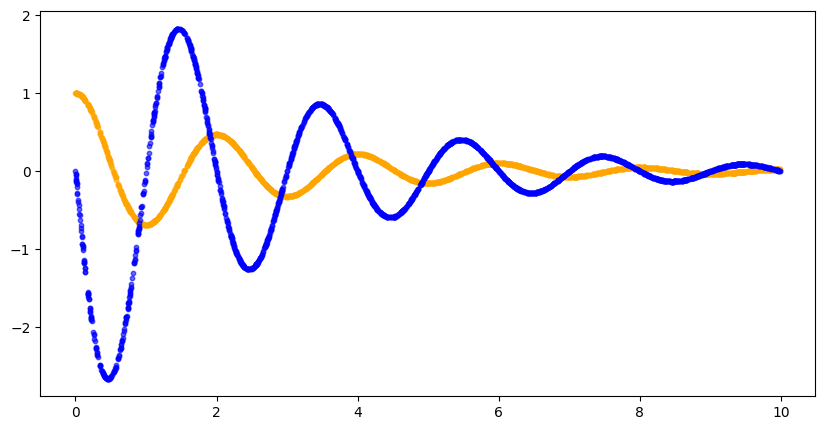

In [135]:
t_data, x_data, v_data = sample_noisy_spring_data(solution, n_samples=2000, noise_lev=0.000000000001)
plt.figure(figsize=(10, 5))
plt.scatter(t_data.cpu(), x_data.cpu(), s=10, label='Noisy Displacement', alpha=0.6, color='orange')
plt.scatter(t_data.cpu(), v_data.cpu(), s=10, label='Noisy Velocity', alpha=0.6, color='blue')

In [ ]:
data= {
    't_samples': t_data.cpu(),
    'x_noisy': x_data.cpu(),
    'v_noisy': v_data.cpu(),
    'm': torch.tensor(m, dtype=torch.float32),
    'k': torch.tensor(k, dtype=torch.float32),
    'c': torch.tensor(c, dtype=torch.float32)
}
torch.save(data, 'nonoise_damped.pt')

### Two node low-pass RC filter

In [28]:

#### Diff eq simulation 

# circuit parameters
R1 = 10e3          
R2 = 20e3          
C1 = 15e-6         
C2 = 10e-6         
V_in_amp = 1.0    # Pulse amplitude (1V)
pulse_width = 0.5 # Pulse width (0.5s)
pulse_period = 1 # Pulse period (1s)


Node name 'in' is a Python keyword


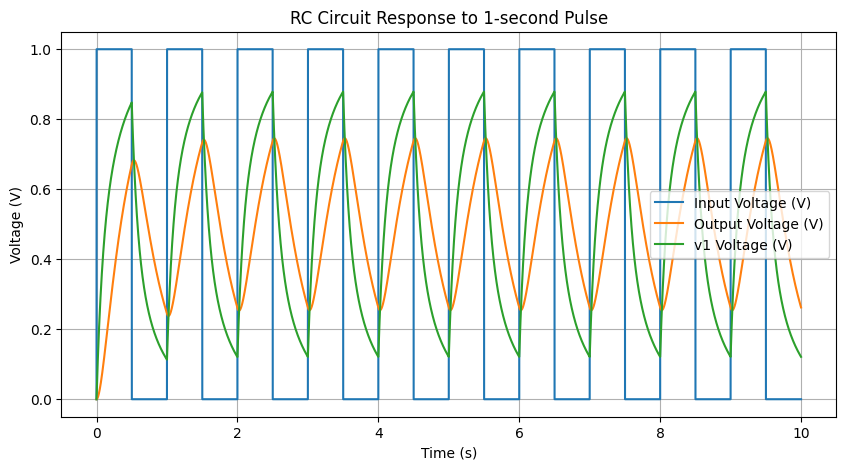

In [36]:
#### Circuit simulation

# Create a circuit
circuit = Circuit('Two-Stage RC Circuit')

# Add components
circuit.V('input', 'in', circuit.gnd, 'PULSE(0 1 0 1n 1n 0.5 1)')  # 1V pulse for 1 second
circuit.R('1', 'in', 'v1', R1)  # R₁
circuit.C('1', 'v1', circuit.gnd, C1)  # C₁
circuit.R('2', 'v1', 'v2', R2)  # R₂
circuit.C('2', 'v2', circuit.gnd, C2)  # C₂
# Simulation parameters
simulator = circuit.simulator(temperature=25, nominal_temperature=25)
analysis = simulator.transient(step_time=0.01@u_ms, end_time=10@u_s)

# Extract results
time = np.array(analysis.time)
input_voltage = np.array(analysis['in'])
v1_voltage = np.array(analysis['v1'])
output_voltage = np.array(analysis['v2'])

# Plot results
plt.figure(figsize=(10, 5))
plt.plot(time, input_voltage, label='Input Voltage (V)')
plt.plot(time, output_voltage, label='Output Voltage (V)')
plt.plot(time, v1_voltage, label='v1 Voltage (V)')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('RC Circuit Response to 1-second Pulse')
plt.grid(True)
plt.legend()
plt.show()

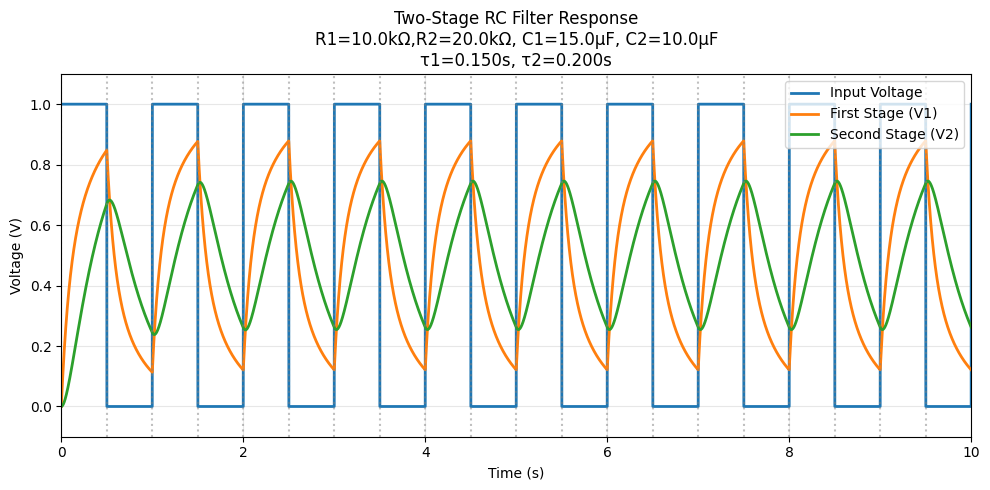

In [29]:

def input_pulse(t):
    phase = t % pulse_period
    return V_in_amp * (phase <= pulse_width)

# CORRECTED SYSTEM OF ODEs
def rc_circuit(t, y):
    V1, V2 = y  # Unpack state variables
    
    # Current through R1
    i1 = (input_pulse(t) - V1)/R1
    # Current through R2
    i2 = (V1 - V2)/R2
    
    # CORRECTED Differential equations:
    dV1dt = i1/C1 - i2/C1  # Current into C1 minus current out
    dV2dt = i2/C2          # Current into C2
    
    return [dV1dt, dV2dt]

# Simulation parameters
t_start = 0.0
t_end = 10.0
max_step = 1e-5
y0 = [0.0, 0.0]

# Solve
sol = solve_ivp(rc_circuit, 
                [t_start, t_end], 
                y0, 
                method='RK45',
                max_step=max_step,
                dense_output=True)

# Plotting
t_plot = np.linspace(t_start, t_end, 50000)
V1_plot, V2_plot = sol.sol(t_plot)
Vin_plot = np.array([input_pulse(t) for t in t_plot])

plt.figure(figsize=(10, 5))
plt.plot(t_plot, Vin_plot, label='Input Voltage', linewidth=2, color='tab:blue')
plt.plot(t_plot, V1_plot, label='First Stage (V1)', linewidth=2, color='tab:orange')
plt.plot(t_plot, V2_plot, label='Second Stage (V2)', linewidth=2, color='tab:green')

# Add pulse markers
for t in np.arange(0, t_end, pulse_period):
    plt.axvline(x=t, color='gray', linestyle=':', alpha=0.5)
    plt.axvline(x=t + pulse_width, color='gray', linestyle=':', alpha=0.5)

plt.title('Two-Stage RC Filter Response\n'
          f'R1={R1/1e3}kΩ,R2={R2/1e3}kΩ, C1={C1*1e6}μF, C2={C2*1e6}μF\n'
          f'τ1={R1*C1:.3f}s, τ2={R2*C2:.3f}s')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.xlim([t_start, t_end])
plt.ylim([-0.1, 1.1])
plt.tight_layout()
plt.show()

In [38]:

#### Dataset generation
def sample_noisy_voltages(sol, n_samples, noise_lev=0.01, t_start=None, t_end=None,device='cpu'):
    """
    Samples random points from EXISTING solution time points with added noise for both stages
    
    Args:
        sol: ODE solution object from solve_ivp (with .t and .y attributes)
        n_samples: Number of points to sample
        noise_lev: Noise scaling factor (std of Gaussian noise)
        t_start: Start time for sampling window (default: min(sol.t))
        t_end: End time for sampling window (default: max(sol.t))
    
    Returns:
        Tuple of (time_points, v1_points, v2_points) as torch Tensors
        All tensors have shape (n_samples, 1)
    """
    # Convert solution times to numpy array
    sol_times = sol.t
    
    # Determine time bounds
    t_min = t_start if t_start is not None else sol_times[0]
    t_max = t_end if t_end is not None else sol_times[-1]
    
    # Find indices within the specified time window
    valid_mask = (sol_times >= t_min) & (sol_times <= t_max)
    valid_times = sol_times[valid_mask]
    valid_v1 = sol.y[0][valid_mask]  # First stage voltage
    valid_v2 = sol.y[1][valid_mask]  # Second stage voltage
    
    # Randomly select indices from the valid points
    if len(valid_times) < n_samples:
        raise ValueError(f"Only {len(valid_times)} points available in time window, but requested {n_samples}")
    
    rand_indices = np.random.choice(len(valid_times), size=n_samples, replace=False)
    
    # Convert to torch tensors
    sampled_t = torch.tensor(valid_times[rand_indices], dtype=torch.float32,device=device)
    sampled_v1 = torch.tensor(valid_v1[rand_indices], dtype=torch.float32,device=device)
    sampled_v2 = torch.tensor(valid_v2[rand_indices], dtype=torch.float32,device=device)
    
    # Add independent Gaussian noise to each channel
    noise_v1 = torch.randn(n_samples,device=device) * noise_lev
    noise_v2 = torch.randn(n_samples,device=device) * noise_lev
    
    noisy_v1 = sampled_v1 + noise_v1
    noisy_v2 = sampled_v2 + noise_v2
    
    return (sampled_t.view(-1, 1), 
            noisy_v1.view(-1, 1), 
            noisy_v2.view(-1, 1))


/Users/javierpenuela/Documents/PINN_article/.conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


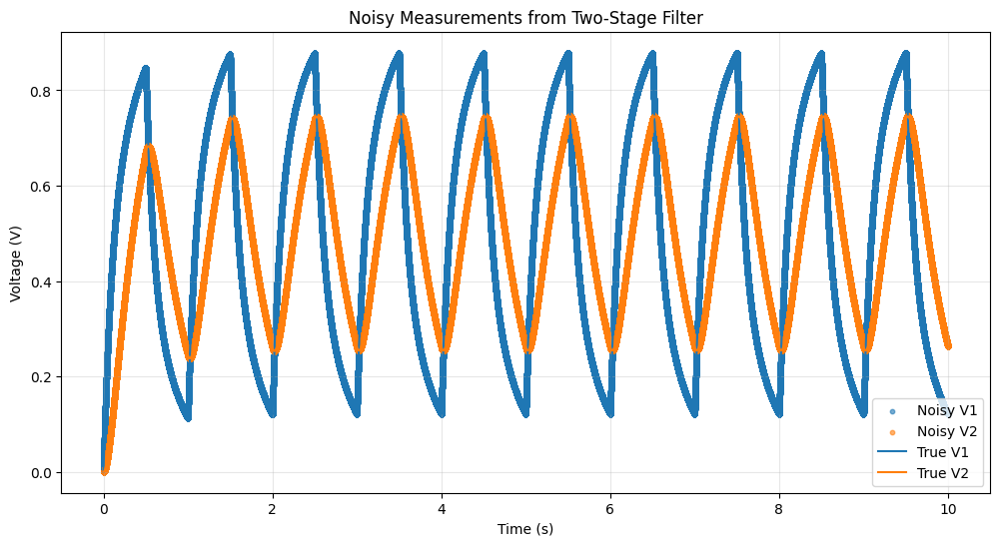

In [39]:
# Generate noisy samples
t_samples, v1_noisy, v2_noisy = sample_noisy_voltages(
    sol, 
    n_samples=300000,
    noise_lev=0.000000000001,
    t_start=0.0,
    t_end=10,device='cpu'  # Specify device for tensors
)

# Plot results
plt.figure(figsize=(12, 6))
plt.scatter(t_samples.cpu().detach(), v1_noisy.cpu().detach(), s=10, label='Noisy V1', alpha=0.6)
plt.scatter(t_samples.cpu().detach(), v2_noisy.cpu().detach(), s=10, label='Noisy V2', alpha=0.6)
#plt.scatter(t_samples.cpu().detach(), abs(v1_noisy.cpu().detach()-v2_noisy.cpu().detach()), s=10, label='Noisy diff', alpha=0.6)
plt.plot(sol.t, sol.y[0], label='True V1', color='tab:blue')
plt.plot(sol.t, sol.y[1], label='True V2', color='tab:orange')
plt.title('Noisy Measurements from Two-Stage Filter')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
data= {
    't_samples': t_samples.cpu().detach(),
    'v1_noisy': v1_noisy.cpu().detach(),
    'v2_noisy': v2_noisy.cpu().detach(),
    'input_signal': torch.tensor([input_pulse(t) for t in t_samples.cpu().detach()], dtype=torch.float32, device='cpu').view(-1, 1),
    'R': torch.tensor([R1, R2], dtype=torch.float32, device='cpu'),
    'C': torch.tensor([C1, C2], dtype=torch.float32, device='cpu')
}
torch.save(data, 'nonoise_two_nodes.pt')

In [43]:
data.keys()== {'t_samples', 'v1_noisy', 'v2_noisy','input_signal', 'R', 'C'}

True

In [64]:
data['input_signal'].shape

torch.Size([300000, 1])

### Single node RC filter with real temperature data

## V1 first stimation grid search

In [ ]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
#dataset_path = str(Path.cwd() / "nonoise_single.pt")
dataset_path = str(Path.cwd() / "nonoise_two_nodes.pt")
#dataset=SimDataset(path_to_file=dataset_path, n_samples=3000, t_start=0.0, t_end=6.0, device=device, dataset='RCfilter_one')
dataset=SimDataset(path_to_file=dataset_path, n_samples=3000, t_start=0.0, t_end=6.0, device=device, dataset='RCfilter_two')

In [44]:
def train_pinn_v1(config, dataset,inverse=True):
    try:
       
        torch.manual_seed(7777)
        activation_map = {
            'tanh': nn.Tanh
            }
        
        activation_fn = activation_map[config['activation']]

        model = FCN(1, 1, config['n_hidden'], config['n_layers'], activation_fn).to(device)
        lambda1 = config['lambda_init']
        mus=[]
        ros=[]
        if inverse:
            mu = torch.nn.Parameter(torch.tensor([config['mu_init']], requires_grad=True, device=device))
            ro = torch.nn.Parameter(torch.tensor([config['ro_init']], requires_grad=True, device=device))
            optimizer = torch.optim.Adam, config['optimizer']([
                {'params': model.parameters(), 'lr': config['lr_model']},
                {'params': [mu], 'lr': config['lr_mu']},
                {'params': [ro], 'lr': config['lr_ro']},
            ])
        else:
            mu = dataset.C.to(device)
            ro = dataset.R.to(device)
            optimizer = torch.optim.Adam([
                {'params': model.parameters(), 'lr': config['lr_model']}
            ])
            mus.append(None)
            ros.append(None)


        # sample data
        total_samples = len(dataset.times)
        split_idx = total_samples // 2  # 50% split point

        # Split into train and validation sets
        t_samples_train = dataset.times[:split_idx].view(-1, 1).requires_grad_(True).to(device)
        t_samples_val = dataset.times[split_idx:].view(-1, 1).requires_grad_(True).to(device)

        v1_noisy_train = dataset.v1[:split_idx].view(-1, 1).requires_grad_(True).to(device)
        v1_noisy_val = dataset.v1[split_idx:].view(-1, 1).requires_grad_(True).to(device)

        input_signal = dataset.input_signal.view(-1, 1).requires_grad_(True).to(device)


        # Apply nearest neighbor interpolation for both train and validation
        t_physics = torch.linspace(0, 6, config['n_collocation'], device=device).view(-1, 1).requires_grad_(True)
        # Apply optimized nearest neighbor interpolation
        input_phys = nearest_interp_column(input_signal, t_samples_train, t_physics).to(device).detach()


        for step in range(config['steps']):
            optimizer.zero_grad()

            u_phys = model(t_physics)
            dudt = torch.autograd.grad(u_phys, t_physics, torch.ones_like(u_phys), create_graph=True)[0]
            loss1 = torch.mean((dudt * (ro * mu) + u_phys - input_phys)**2)

            u_data = model(t_samples_train)
            loss2 = torch.mean((u_data - v1_noisy_train)**2)

            if inverse:
                param_penalty = swish_penalty(mu)+ swish_penalty(ro)
                loss = (1 - lambda1) * loss2 + lambda1 * loss1+ param_penalty
                mus.append[mu.detach().cpu()]
                ros.append[ro.detach().cpu()]
            else:
                loss = (1 - lambda1) * loss2 + lambda1 * loss1
            loss.backward()
            optimizer.step()


            if step % 1000 == 0:
                u_data_val = model(t_samples_val)
                MSE = MeanSquaredError().to(device)
                MSE.update( u_data_val, v1_noisy_val )
                R2_train = R2Score().to(device)
                R2_train.update( u_data, v1_noisy_train )
                R2_val = R2Score().to(device)
                R2_val.update( u_data_val, v1_noisy_val )
                if inverse:
                    tau_offset=abs(torch.median(mus)*torch.median(ros) - dataset.R.cpu()*dataset.C.cpu())
                    tune.report({"loss": loss.item(),"Physics_loss":loss1.item(),"Data_loss":loss2.item(),"val_loss": MSE.compute().item(),"R2_train": R2_train.compute().item(),"R2_val": R2_val.compute().item(),"Tau_offset":tau_offset.item(),"steps":step})
                else:
                    tune.report({"loss": loss.item(),"Physics_loss":loss1.item(),"Data_loss":loss2.item(),"val_loss": MSE.compute().item(),"R2_train": R2_train.compute().item(),"R2_val": R2_val.compute().item(),"steps":step})

        print(f"Physics_loss{loss1.item()}")        
        print(f"[Trial Done] Final loss = {loss.item()}")
    except Exception as e:
        import traceback
        print("❌ ERROR in trial:", config)
        traceback.print_exc()
        raise e  # re-raise for Ray to detect it failed

In [5]:
def train_pinn_v2(config, dataset,inverse=True,single_output=False):
    try:
       
        torch.manual_seed(7777)
        activation_map = {
            'tanh': nn.Tanh
            }
        
        activation_fn = activation_map[config['activation']]
        if not single_output:
             model = FCN(1, 2, config['n_hidden'], config['n_layers'], activation_fn).to(device)
        else:
                    #for single node
            model = FCN(1, 1, config['n_hidden'], config['n_layers'], activation_fn).to(device)
        lambda1 = config['lambda_init']
        mus1=[]
        ros1=[]
        mus2=[]
        ros2=[]

        MSE = MeanSquaredError().to(device)
        R2_train = R2Score().to(device)
        R2_val = R2Score().to(device)
        if inverse:
            mu1 = torch.nn.Parameter(torch.tensor([config['mu_init']], requires_grad=True, device=device))
            ro1 = torch.nn.Parameter(torch.tensor([config['ro_init']], requires_grad=True, device=device))
            mu2 = torch.nn.Parameter(torch.tensor([config['mu_init']], requires_grad=True, device=device))
            ro2 = torch.nn.Parameter(torch.tensor([config['ro_init']], requires_grad=True, device=device))
            optimizer = torch.optim.Adam([
                {'params': model.parameters(), 'lr': config['lr_model']},
                {'params': [mu1,mu2], 'lr': config['lr_mu']},
                {'params': [ro1,ro2], 'lr': config['lr_ro']},
            ])
        else:
            mu1 = dataset.C[0].to(device)
            ro1 = dataset.R[0].to(device)
            mu2 = dataset.C[1].to(device)
            ro2 = dataset.R[1].to(device)
            optimizer = torch.optim.Adam([
                {'params': model.parameters(), 'lr': config['lr_model']}
            ])
            mus1.append(None)
            ros1.append(None)
            mus2.append(None)
            ros2.append(None)


        # sample data
        total_samples = len(dataset.times)
        split_idx = total_samples // 2  # 50% split point

        # Split into train and validation sets
        t_samples_train = dataset.times[:split_idx].view(-1, 1).requires_grad_(True).to(device)
        t_samples_val = dataset.times[split_idx:].view(-1, 1).requires_grad_(True).to(device)
        if not single_output:
            v1_noisy_train = dataset.v1[:split_idx].view(-1, 1).requires_grad_(True).to(device)
            v1_noisy_val = dataset.v1[split_idx:].view(-1, 1).requires_grad_(True).to(device)
        v2_noisy_train = dataset.v2[:split_idx].view(-1, 1).requires_grad_(True).to(device)
        v2_noisy_val = dataset.v2[split_idx:].view(-1, 1).requires_grad_(True).to(device)


        input_signal = dataset.input_signal.view(-1, 1).requires_grad_(True).to(device)


        # Apply nearest neighbor interpolation for both train and validation
        t_physics = torch.linspace(0, 6, config['n_collocation'], device=device).view(-1, 1).requires_grad_(True)
        # Apply optimized nearest neighbor interpolation
        input_phys = nearest_interp_column(input_signal, t_samples_train, t_physics).to(device).detach()


        for step in range(config['steps']):
            optimizer.zero_grad()
            u_phys = model(t_physics)
            if not single_output:
                u1=u_phys[:,1].view(-1,1)
                u2=u_phys[:,0].view(-1,1)
                du1dt = torch.autograd.grad(u1, t_physics, torch.ones_like(u1), create_graph=True)[0]
                du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]
            else:

            # for single node 
                u2=u_phys
                du2dt = torch.autograd.grad(u2, t_physics, torch.ones_like(u2), create_graph=True)[0]
                d2u2dt = torch.autograd.grad(du2dt, t_physics, torch.ones_like(u2), create_graph=True)[0]

            if not single_output:

                #Eq.5
                loss1a= torch.mean(((input_phys-u1)/ro1 - (u1-u2)/ro2- mu1*du1dt)**2)
                loss1b= torch.mean(((u1-u2)/ro2- mu2*du2dt)**2)

                #Eq.6

                #loss1a= torch.mean(((input_phys-u1)/ro1 -mu2*du2dt- mu1*du1dt)**2)
            else:
                #Eq.7
                loss1a= torch.mean((ro1*ro2*mu1*mu2* d2u2dt -input_phys + u2+( ro2*mu2+ro1*mu2+ro1*mu1)*du2dt)**2)
            loss1=loss1a#+loss1b
            u_data = model(t_samples_train)
            if not single_output:
                u1_data=u_data[:,1].view(-1,1)
                u2_data=u_data[:,0].view(-1,1)
                loss2 = torch.mean((u1_data - v1_noisy_train)**2)+ torch.mean((u2_data - v2_noisy_train)**2)
            else:
                
                u2_data=u_data
                loss2 = torch.mean((u2_data - v2_noisy_train)**2)
            if inverse:
                param_penalty = swish_penalty(mu1)+ swish_penalty(ro1) + swish_penalty(mu2)+ swish_penalty(ro2)
                loss = (1 - lambda1) * loss2 + lambda1 * loss1+ param_penalty
                mus1.append(mu1.detach().cpu())
                ros1.append(ro1.detach().cpu())
                mus2.append(mu2.detach().cpu())
                ros2.append(ro2.detach().cpu())
            else:
                loss = (1 - lambda1) * loss2 + lambda1 * loss1
            loss.backward()
            optimizer.step()
            if step % 1000 == 0:
                u_data_val = model(t_samples_val)
                if not single_output:
                    u1_val=u_data_val[:,1].view(-1,1)
                    u2_val=u_data_val[:,0].view(-1,1)
                    MSE.reset()
                    R2_train.reset()
                    R2_val.reset()
                    MSE.update( torch.concat((u1_val,u2_val),axis=1), torch.concat((v1_noisy_val,v2_noisy_val),axis=1) )
                    R2_train.update( torch.concat((u1_data,u2_data),axis=1), torch.concat((v1_noisy_train,v2_noisy_train),axis=1)  )
                    R2_val.update( torch.concat((u1_val,u2_val),axis=1), torch.concat((v1_noisy_val,v2_noisy_val),axis=1) )
                else:
                    u2_val=u_data_val
                    MSE.reset()
                    R2_train.reset()
                    R2_val.reset()
                    MSE.update( u2_val, v2_noisy_val )
                    R2_train.update( u2_data, v2_noisy_train)
                    R2_val.update( u2_val, v2_noisy_val)
                if inverse:
                    R1=dataset.R[0].cpu()
                    R2=dataset.R[1].cpu()
                    C1=dataset.C[0].cpu()
                    C2=dataset.C[1].cpu()
                    p1=(-(R2*C2+R1*C1+R1*C2)-np.sqrt((R2*C2+R1*C1+R1*C2)**2-4*R1*R2*C1*C2))/2*R1*R2*C1*C2
                    p2=(-(R2*C2+R1*C1+R1*C2)+np.sqrt((R2*C2+R1*C1+R1*C2)**2-4*R1*R2*C1*C2))/2*R1*R2*C1*C2
                    p1_pred=(-(ro2.cpu().detach()*mu2.cpu().detach()+ro1.cpu().detach()*mu1.cpu().detach()+ro1.cpu().detach()*mu2.cpu().detach())-np.sqrt((ro2.cpu().detach()*mu2.cpu().detach()+ro1.cpu().detach()*mu1.cpu().detach()+ro1.cpu().detach()*mu2.cpu().detach())**2-4*ro1.cpu().detach()*ro2.cpu().detach()*mu1.cpu().detach()*mu2.cpu().detach()))/2*ro1.cpu().detach()*ro2.cpu().detach()*mu1.cpu().detach()*mu2.cpu().detach()
                    p2_pred=(-(ro2.cpu().detach()*mu2.cpu().detach()+ro1.cpu().detach()*mu1.cpu().detach()+ro1.cpu().detach()*mu2.cpu().detach())+np.sqrt((ro2.cpu().detach()*mu2.cpu().detach()+ro1.cpu().detach()*mu1.cpu().detach()+ro1.cpu().detach()*mu2.cpu().detach())**2-4*ro1.cpu().detach()*ro2.cpu().detach()*mu1.cpu().detach()*mu2.cpu().detach()))/2*ro1.cpu().detach()*ro2.cpu().detach()*mu1.cpu().detach()*mu2.cpu().detach()

                    


                    p1_MAPE=torch.mean(abs((p1 - p1_pred)/p1))*100
                    p2_MAPE=torch.mean(abs((p2 - p2_pred)/p2))*100
                    
                    tune.report({"loss": loss.item(),"Physics_loss":loss1.item(),"Data_loss":loss2.item(),"val_loss": MSE.compute().item(),"R2_train": R2_train.compute().item(),"R2_val": R2_val.compute().item(),"p1_MAPE":p1_MAPE.item(),"p2_MAPE":p2_MAPE.item(),'p1_pred':p1_pred.item(),'p2_pred':p2_pred.item(),"steps":step})
                else:
                    tune.report({"loss": loss.item(),"Physics_loss":loss1.item(),"Data_loss":loss2.item(),"val_loss": MSE.compute().item(),"R2_train": R2_train.compute().item(),"R2_val": R2_val.compute().item(),"steps":step})

                
        print(f"[Trial Done] Final loss = {loss.item()}")
    except Exception as e:
        import traceback
        print("❌ ERROR in trial:", config)
        traceback.print_exc()
        raise e  # re-raise for Ray to detect it failed

In [6]:
search_space_test = {
    'n_layers': tune.choice([8]),
    'n_hidden': tune.choice([32]),
    'activation': tune.choice(['tanh']),
    'n_collocation': tune.choice([100]),
    'lambda_init': tune.loguniform(1e-6,0.9999),
    'lr_model': tune.loguniform(1e-6,1e-2),
    'steps': tune.choice([11000])
}
search_space_test_inverse = {
    'n_layers': tune.choice([8]),
    'n_hidden': tune.choice([32]),
    'activation': tune.choice(['tanh']),
    'n_collocation': tune.choice([100]),
    'mu_init': tune.loguniform(1e-5,1),
    'ro_init': tune.loguniform(1,1e5),
    'lambda_init': tune.loguniform(1e-6,0.9999),
    'lr_model': tune.loguniform(1e-6,1e-2),
    'lr_mu': tune.loguniform(1e-8,1e-1),
    'lr_ro': tune.loguniform(1e-8,1e-1),
    'steps': tune.choice([11000])
}

In [ ]:
search_space_inverse_initial = {
    'n_layers': tune.choice([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]),
    'n_hidden': tune.choice([8,12,16,20,32,50,64,100,124,150,200,248,300,400,500,596,600,700,800,900,1000,1128]),
    'activation': tune.choice(['tanh']),
    'n_collocation': tune.choice([30, 60,100,150,200,250,300,1000,2000,3000]),
    'mu_init': tune.loguniform(1e-5,1),
    'ro_init': tune.loguniform(1,1e3),
    'lambda_init': tune.loguniform(1e-8,0.999),
    'lr_model': tune.loguniform(1e-6,1e-2),
    'lr_mu': tune.loguniform(1e-8,1e-1),
    'lr_ro': tune.loguniform(1e-8,1e-1),
    'steps': tune.choice([5000,8000,10000,12000,15000,18000,20000,25000,30000,40000,50000])
}

search_space_inverse = {
    'n_layers': tune.choice([6,7,8]),
    'n_hidden': tune.choice([124,150,200,248]),
    'activation': tune.choice(['tanh']),
    'n_collocation': tune.choice([100,150,200,]),
    'mu_init': tune.loguniform(1e-4,0.01),
    'ro_init': tune.loguniform(10,2500),
    'lambda_init': tune.loguniform(1e-6,0.1),
    'lr_model': tune.loguniform(3e-4,1e-3),
    'lr_mu': tune.loguniform(1e-6,1e-1),
    'lr_ro': tune.loguniform(1e-6,1e-1),
    'steps': tune.choice([8000,10000,12000,15000,18000,20000,25000,30000,40000])
}


In [ ]:
ray.shutdown()
ray.init(ignore_reinit_error=True)
train_with_dataset = tune.with_parameters(train_pinn_v2, dataset=dataset, inverse=True,single_output=True)
tuner = tune.Tuner(
    train_with_dataset,
    tune_config=tune.TuneConfig(num_samples=1000,
        search_alg=HyperOptSearch( metric="loss",
    mode="min",
    random_state_seed=7777,  # For reproducibility
    n_initial_points=20),
        scheduler = ASHAScheduler(metric="loss", mode="min",max_t=100, grace_period=20, reduction_factor=5)
    ),
    param_space=search_space_inverse
)

results = tuner.fit()
print("Best result:", results.get_best_result("loss", "min").config)


In [101]:
results.get_dataframe()['config/n_hidden'].unique()

array([ 50,  20, 300, 200, 124, 100, 400,  32, 150, 248,  64])

In [18]:
df = results.get_dataframe()
df.to_csv("dualnode_inverse_forward_eq3_second.csv", index=False)

In [116]:
results.get_dataframe()['done'].sum()


716

In [122]:
df = pd.read_csv("dualnode_forward_eq2_third.csv")

In [55]:
config=pd.read_pickle('forward_single_final.pkl')
config = {key.replace('config/', ""): value 
            for key, value in config.items()}
config['steps']=20000

In [56]:
config

{'loss': 1.7855645637609996e-05,
 'val_loss': 1.4161078070173971e-05,
 'R2_train': 0.999910295009613,
 'R2_val': 0.9999054670333862,
 'steps': 20000,
 'timestamp': 1758651555,
 'checkpoint_dir_name': nan,
 'done': False,
 'training_iteration': 19,
 'trial_id': 'aae1cb29',
 'date': '2025-09-23_21-19-15',
 'time_this_iter_s': 13.34771490097046,
 'time_total_s': 220.66782569885257,
 'pid': 55866,
 'hostname': 'Javiers-Mac-mini.local',
 'node_ip': '127.0.0.1',
 'time_since_restore': 220.66782569885257,
 'iterations_since_restore': 19,
 'n_layers': 4,
 'n_hidden': 32,
 'activation': 'tanh',
 'n_collocation': 150,
 'lambda_init': 1.006585989818297e-05,
 'lr_model': 0.00825839340638,
 'logdir': 'aae1cb29'}

In [57]:
train_pinn_v1(config, dataset,inverse=False)

Physics_loss0.5866029262542725
[Trial Done] Final loss = 0.0001660872803768143


In [21]:
df['mean_p']=(df['p1_MAPE']+df['p2_MAPE'])/2

In [25]:
pd.set_option('display.float_format', '{:.6e}'.format)
idbest=df['R2_val'].argmax()
df.iloc[idbest]#['val_loss'] #.to_pickle('forward_single_final.pkl')



loss                                  1.070107e-06
Physics_loss                          2.840748e-01
Data_loss                             3.404179e-07
val_loss                              4.015033e-07
R2_train                              9.999818e-01
R2_val                                9.999781e-01
p1_MAPE                               9.601248e+01
p2_MAPE                               9.042165e+01
p1_pred                              -5.022535e-04
p2_pred                              -8.661980e-05
steps                                        39000
timestamp                               1760937388
checkpoint_dir_name                           None
done                                         False
training_iteration                              40
trial_id                                  45bc1add
date                           2025-10-20_08-16-28
time_this_iter_s                      7.349172e+01
time_total_s                          3.292283e+03
pid                            

### Sensitivity analysis 

In [17]:
df

,loss,val_loss,R2_train,R2_val,steps,timestamp,checkpoint_dir_name,done,training_iteration,trial_id,...,time_since_restore,iterations_since_restore,config/n_layers,config/n_hidden,config/activation,config/n_collocation,config/lambda_init,config/lr_model,config/steps,logdir
0,0.004117,0.004611,9.728714e-01,0.969280,29000,1758320123,NaN,False,30,8af75c58,...,448.081155,30,2,500,tanh,300,5.551364e-08,0.009291,30000,8af75c58
1,0.128330,0.116548,2.543783e-01,0.223547,1000,1758319727,NaN,False,2,fcbd0aa0,...,50.410931,2,8,500,tanh,150,8.623870e-02,0.002916,2000,fcbd0aa0
2,1.194344,1.107292,-6.870464e+00,-6.376847,4000,1758319701,NaN,False,5,fe71cd69,...,22.801230,5,1,8,tanh,150,1.067525e-07,0.000001,5000,fe71cd69
3,0.108011,0.120713,2.882533e-01,0.195805,9000,1758320444,NaN,True,10,96586c9a,...,764.021895,10,10,596,tanh,60,1.398046e-05,0.000007,10000,96586c9a
4,0.153524,0.152000,-2.384186e-07,-0.012634,1000,1758319740,NaN,False,2,70013455,...,57.192931,2,9,400,tanh,100,1.820377e-02,0.029408,2000,70013455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.151750,0.151986,5.960464e-08,-0.012537,9000,1758344326,NaN,True,10,70a69efb,...,369.305732,10,9,400,tanh,60,1.016679e-08,0.002186,10000,70a69efb
996,0.002023,0.002738,9.866678e-01,0.981759,9000,1758344208,NaN,True,10,33d63d5b,...,174.155637,10,5,200,tanh,30,1.765728e-08,0.006295,18000,33d63d5b
997,0.091760,0.090489,3.953249e-01,0.397157,9000,1758344166,NaN,True,10,3bf6c8c1,...,113.535910,10,2,12,tanh,60,8.891170e-08,0.001697,30000,3bf6c8c1
998,0.000458,0.000507,9.969797e-01,0.996622,14000,1758344329,NaN,False,15,c0e1a668,...,217.496756,15,5,32,tanh,60,5.719078e-08,0.009604,15000,c0e1a668



--- Spearman Sensitivity ---
                      Spearman Correlation
config/lr_model               4.636990e-01
config/n_hidden               4.609433e-01
config/lambda_init           -2.350888e-01
config/steps                  2.043032e-01
config/n_layers               2.023800e-01
config/lr_ro                  1.719409e-01
config/ro_init               -1.605711e-01
config/mu_init               -1.203445e-01
config/lr_mu                  6.233735e-02
config/n_collocation          2.882867e-02

--- Feature Importance (Random Forest) ---
config/lr_model        2.227023e-01
config/ro_init         2.046170e-01
config/mu_init         1.313373e-01
config/lambda_init     1.281423e-01
config/lr_mu           1.060530e-01
config/n_hidden        9.608331e-02
config/lr_ro           4.429983e-02
config/steps           3.097949e-02
config/n_layers        2.213176e-02
config/n_collocation   1.365364e-02
dtype: float64


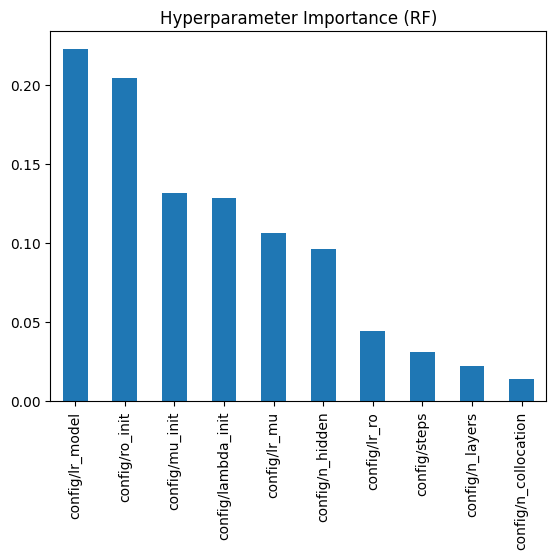

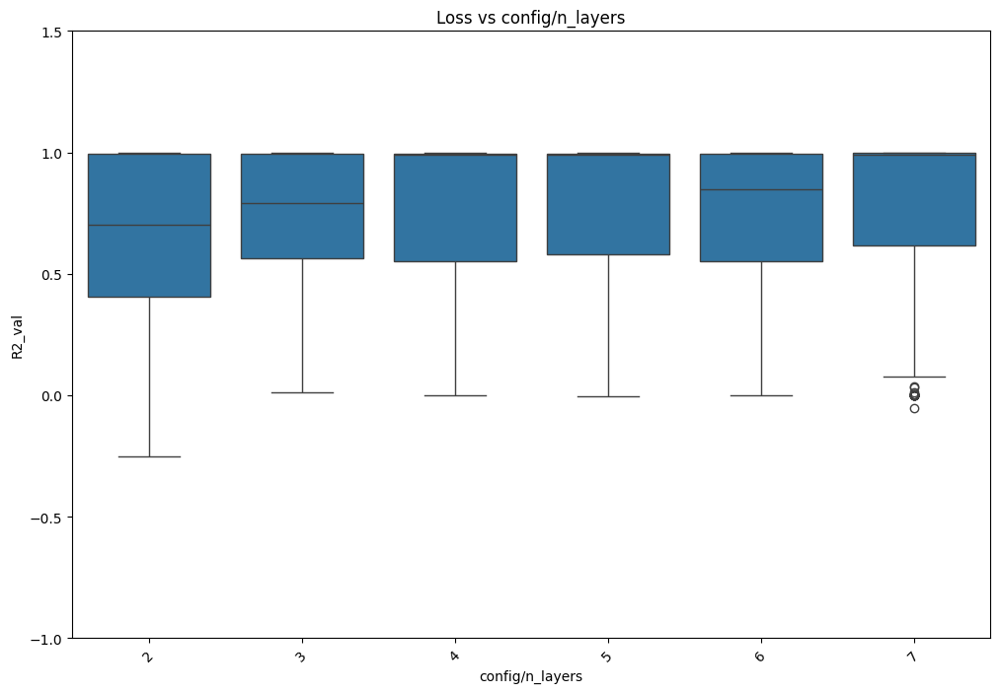

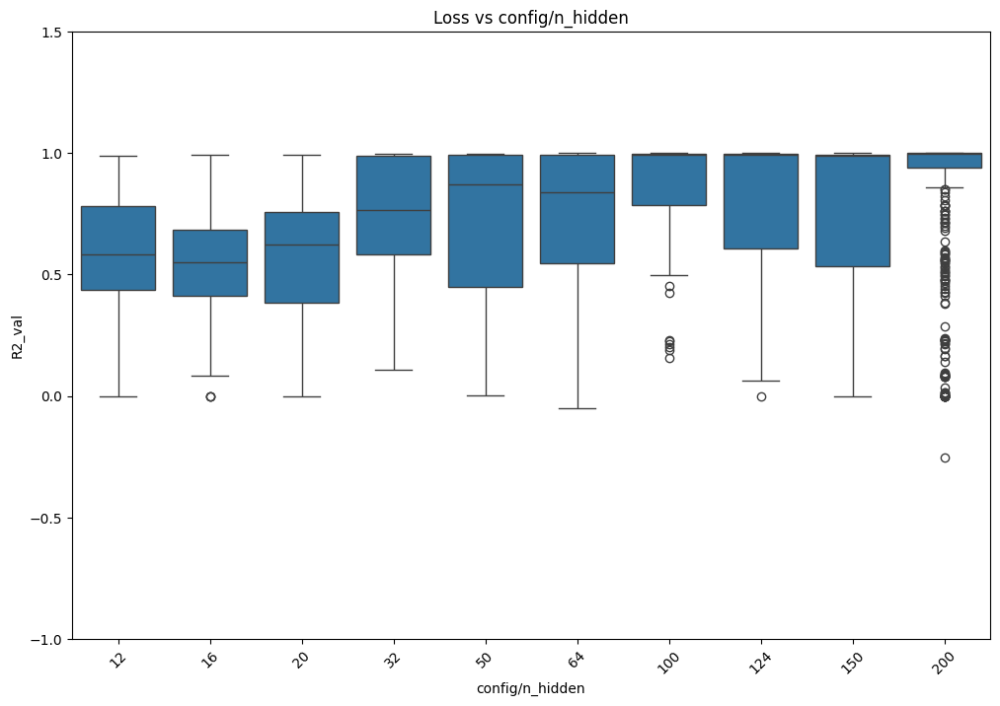

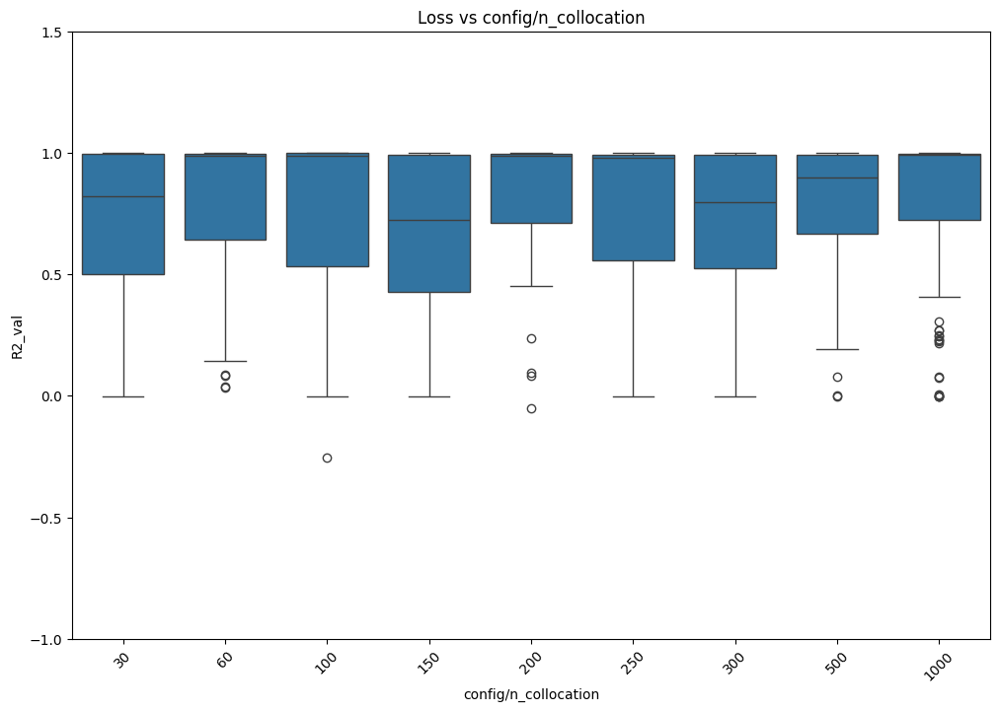

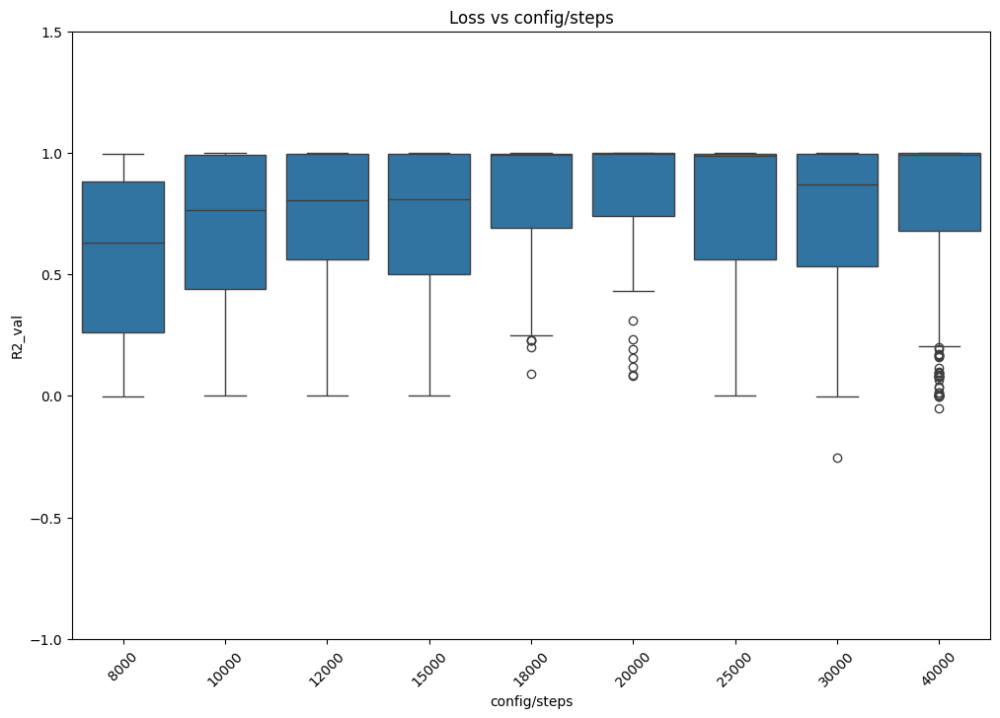

...

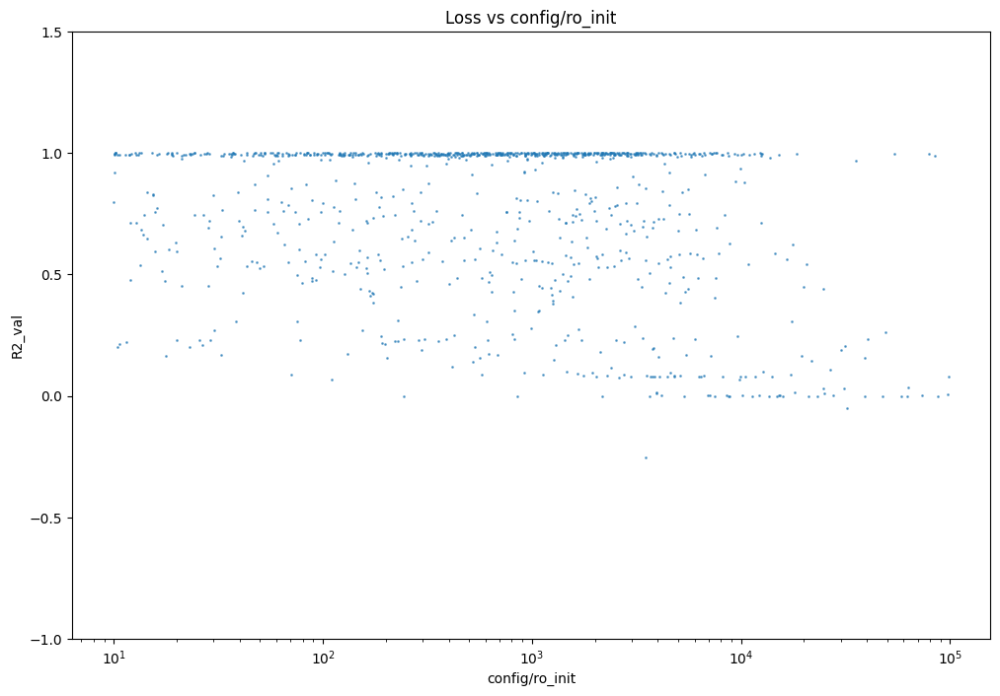

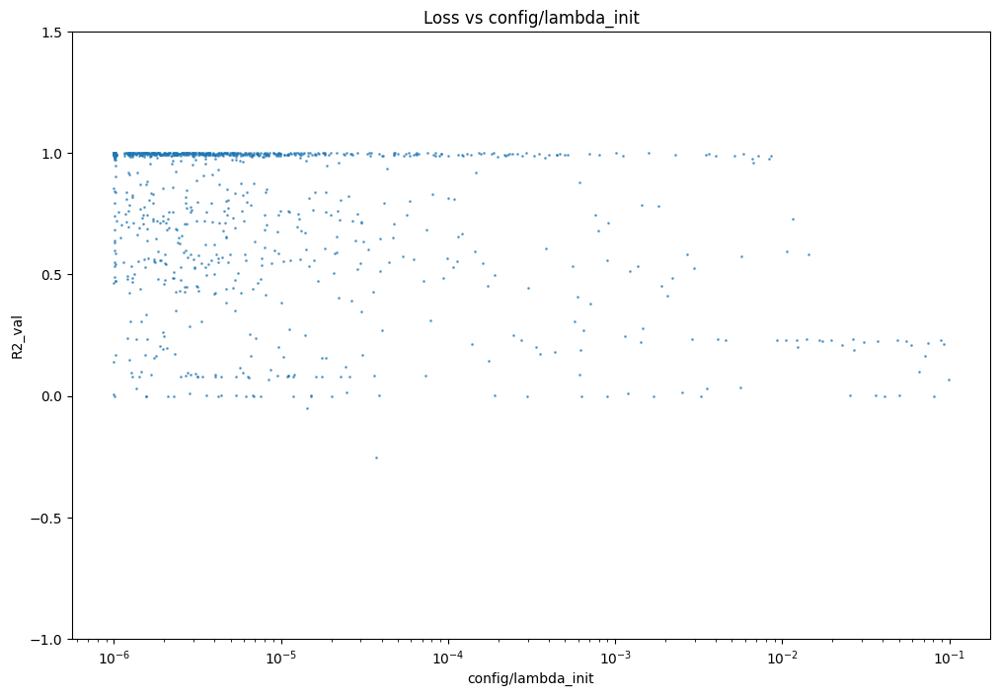

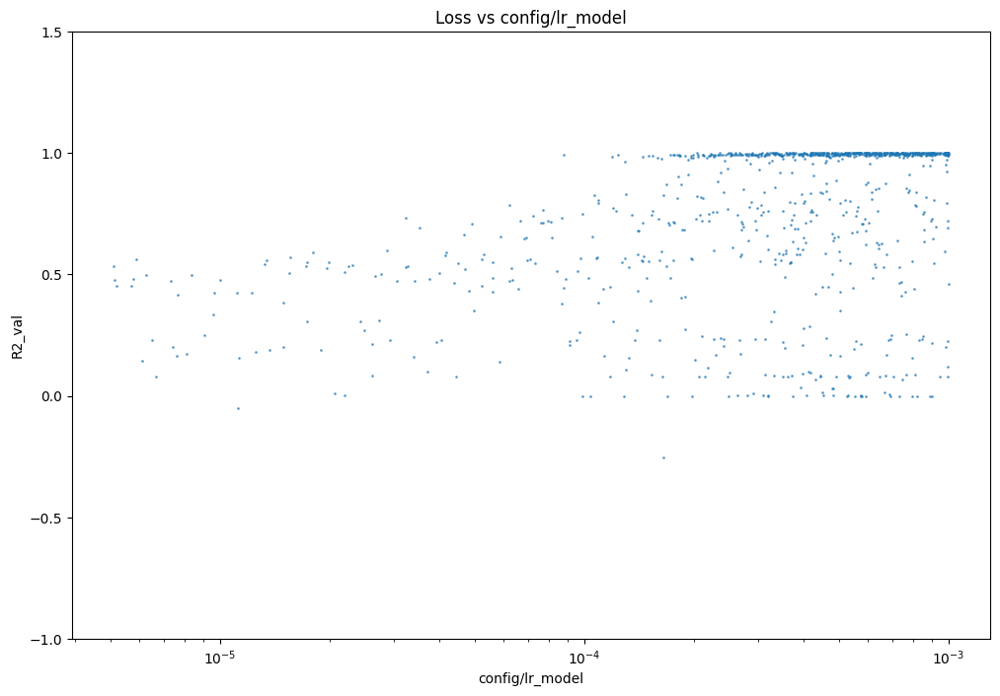

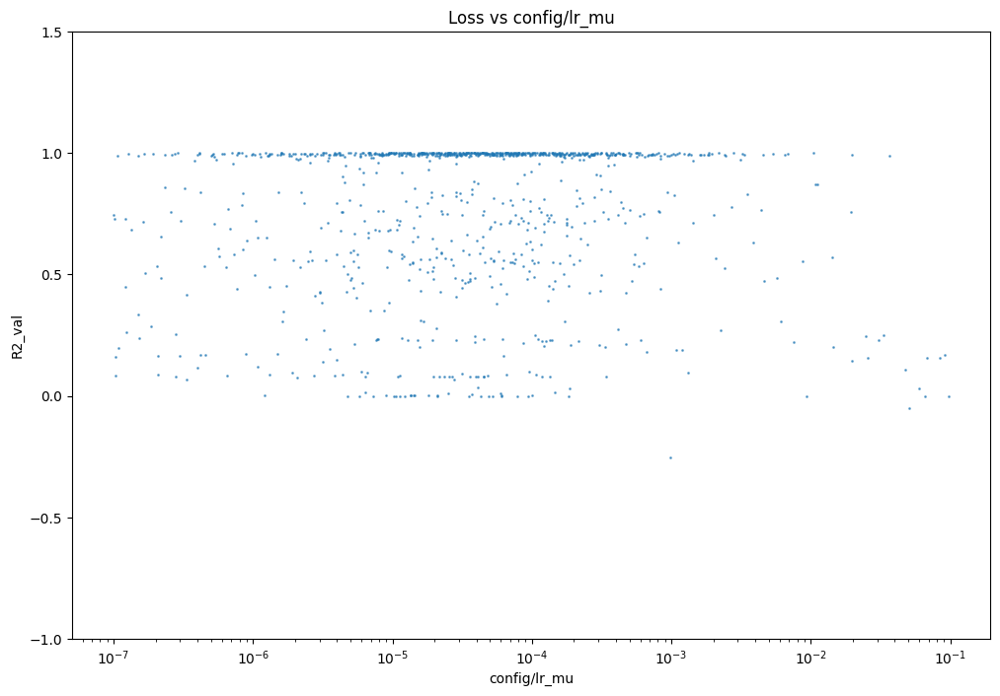

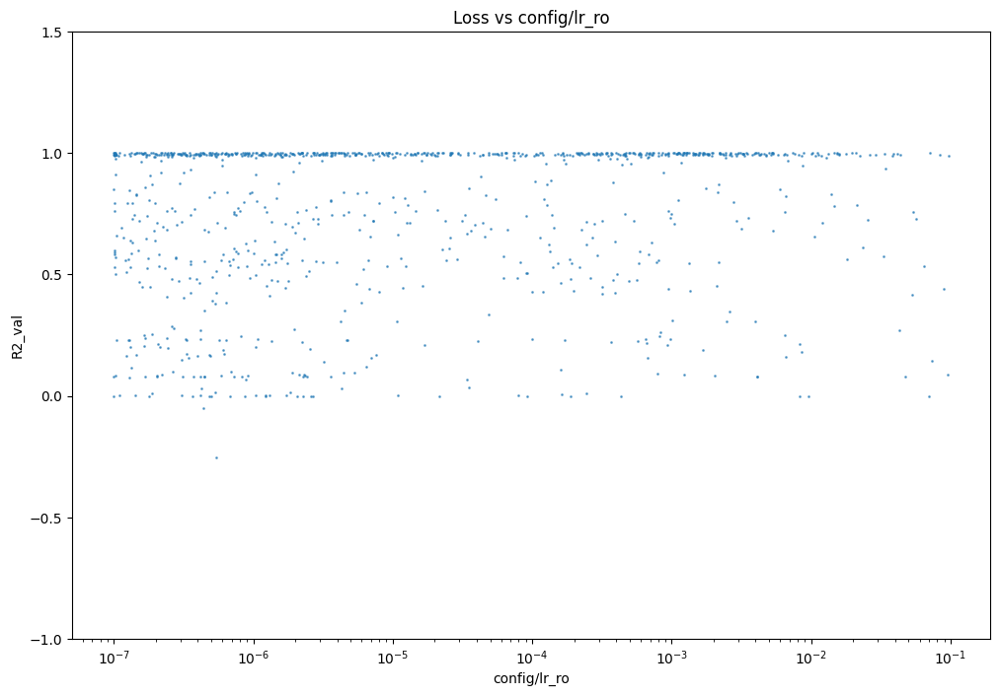

/Users/javierpenuela/Documents/PINN_article/.conda/lib/python3.11/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 0 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(
/Users/javierpenuela/Documents/PINN_article/.conda/lib/python3.11/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 1 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(
/Users/javierpenue

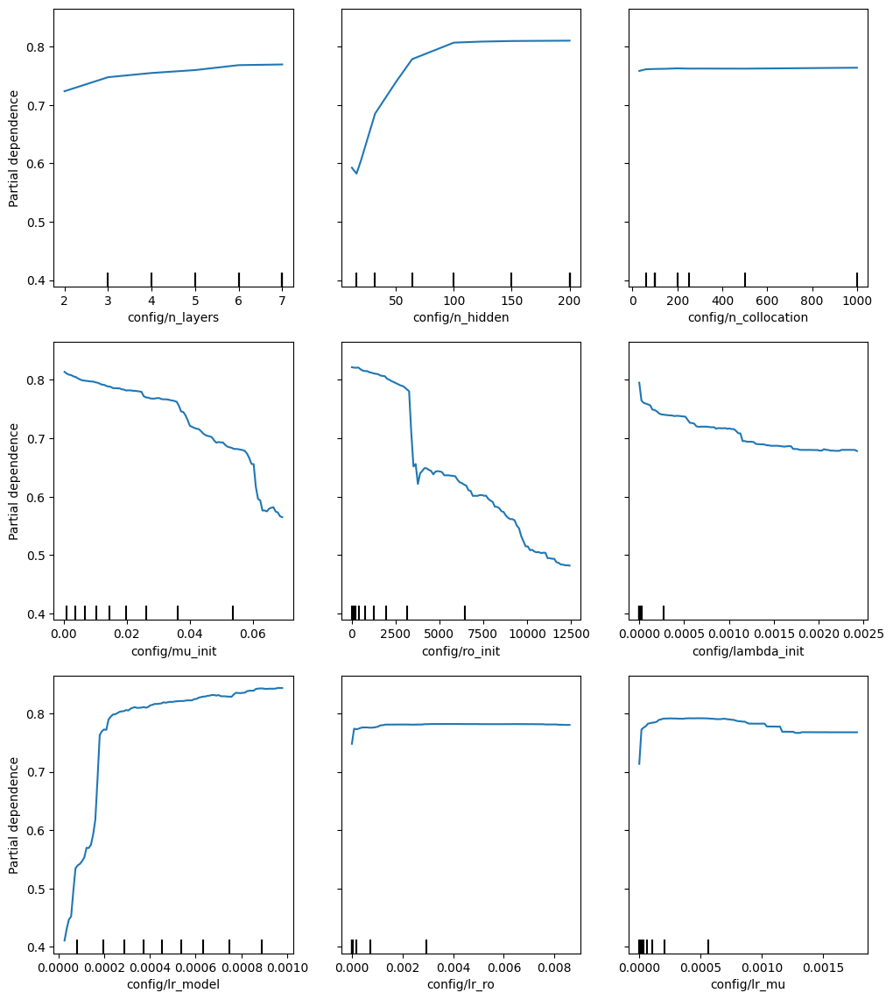

/Users/javierpenuela/Documents/PINN_article/.conda/lib/python3.11/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 0 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(
/Users/javierpenuela/Documents/PINN_article/.conda/lib/python3.11/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 9 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


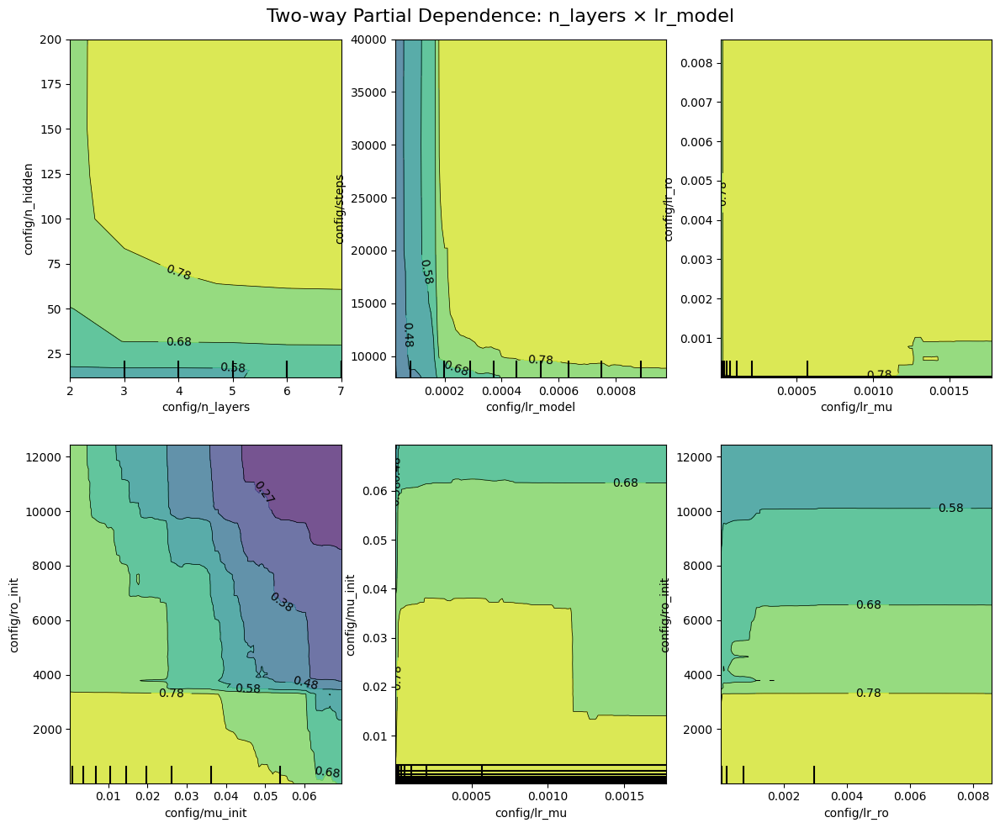

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay


# Ensure loss column is named correctly
loss_col = "R2_val"  # change if your column has a different name

# 1) Correlation-based sensitivity (Spearman rank correlation)
corrs = {}
for col in ['config/n_layers', 'config/n_hidden',
        'config/n_collocation', 'config/mu_init',
       'config/ro_init', 'config/lambda_init', 'config/lr_model',
       'config/lr_mu', 'config/lr_ro', 'config/steps']:
    corrs[col] = df[col].corr(df[loss_col], method='spearman')

corr_df = pd.DataFrame.from_dict(corrs, orient='index', columns=['Spearman Correlation'])
corr_df.sort_values('Spearman Correlation', key=abs, ascending=False, inplace=True)
print("\n--- Spearman Sensitivity ---")
print(corr_df)

# 2) Model-based feature importance
X = df[['config/n_layers', 'config/n_hidden',
        'config/n_collocation', 'config/mu_init',
       'config/ro_init', 'config/lambda_init', 'config/lr_model',
       'config/lr_mu', 'config/lr_ro', 'config/steps']].copy()
y = df[loss_col]

rf = RandomForestRegressor(n_estimators=300, random_state=0)
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\n--- Feature Importance (Random Forest) ---")
print(importances)

# Plot feature importances
importances.plot(kind='bar', title="Hyperparameter Importance (RF)")
plt.show()

# 3) Boxplots for categorical parameters
for col in ['config/n_layers','config/n_hidden','config/n_collocation','config/steps']:
    plt.figure(figsize=(12,8))
    sns.boxplot(x=col, y=loss_col, data=df)
    plt.title(f"Loss vs {col}")
    plt.xticks(rotation=45)
    plt.ylim(top=1.5,bottom=-1)
    plt.show()

# 4) Scatter plots for continuous parameters
for col in ['config/mu_init',
       'config/ro_init', 'config/lambda_init', 'config/lr_model',
       'config/lr_mu', 'config/lr_ro']:
    plt.figure(figsize=(12,8))
    plt.scatter(df[col], df[loss_col], alpha=0.6,s=1)
    plt.xscale('log')
    plt.title(f"Loss vs {col}")
    plt.xlabel(col)
    plt.ylabel(loss_col)
    plt.ylim(top=1.5, bottom=-1)
    plt.show()

# 5) Partial dependence plots (optional, for more insight)
fig, ax = plt.subplots(figsize=(12, 14))
PartialDependenceDisplay.from_estimator(rf, X, ['config/n_layers', 'config/n_hidden',
        'config/n_collocation', 'config/mu_init',
       'config/ro_init', 'config/lambda_init', 'config/lr_model','config/lr_ro','config/lr_mu'], ax=ax)
plt.show()

# Two-way partial dependence between n_layers and lr_model
fig, ax = plt.subplots(figsize=(12, 10))
PartialDependenceDisplay.from_estimator(
    rf, X,
    [("config/n_layers", "config/n_hidden"),("config/lr_model", "config/steps"),('config/lr_mu', 'config/lr_ro'),('config/mu_init',
       'config/ro_init'),('config/lr_mu','config/mu_init'),('config/lr_ro','config/ro_init')],  # tuple = 2D PDP
    ax=ax
)

plt.suptitle("Two-way Partial Dependence: n_layers × lr_model", fontsize=16)
plt.tight_layout()
plt.show()

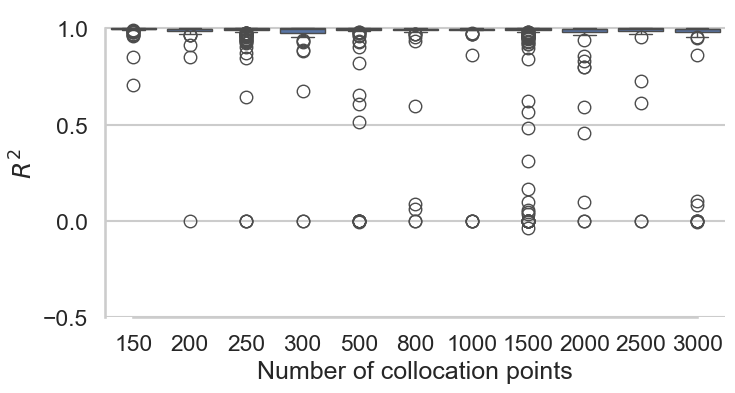

In [126]:
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(8,4))
sns.boxplot(x=df['config/n_collocation'], y=df['R2_val'] ) # customize outliers)
#plt.title(f"$R^2$ vs # of hidden layers")
plt.xticks(rotation=0)
plt.ylim(top=1.1,bottom=-0.5)
plt.ylabel(f"$R^2$")
plt.xlabel(f"Number of collocation points")
sns.despine(trim=True)
plt.show()

In [26]:
def set_consistent_style():
    """
    Apply a comprehensive, consistent style for matplotlib + seaborn plots
    that looks identical across computers, Jupyter, scripts, and backends.
    """

    # Reset to base defaults (ignores local configs)
    plt.rcdefaults()
    sns.set_theme(style="whitegrid", context="talk")

    plt.rcParams.update({

        # === Figure ===
        "figure.figsize": (8, 5),
        "figure.dpi": 100,
        "savefig.dpi": 300,
        "savefig.bbox": "tight",
        "savefig.transparent": False,
        "figure.facecolor": "white",
        "figure.edgecolor": "white",

        # === Axes ===
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.linewidth": 1.2,
        "axes.titlesize": 16,
        "axes.titleweight": "bold",
        "axes.titlepad": 12,
        "axes.labelsize": 14,
        "axes.labelweight": "normal",
        "axes.labelcolor": "black",

        # === Grid ===
        "axes.grid": False,
        "grid.color": "0.85",
        "grid.linestyle": "-",
        "grid.linewidth": 0.8,
        "axes.axisbelow": True,

        # === Ticks ===
        "xtick.direction": "out",
        "ytick.direction": "out",
        "xtick.color": "black",
        "ytick.color": "black",
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "xtick.top": False,
        "ytick.right": False,
        "xtick.major.size": 5,
        "ytick.major.size": 5,
        "xtick.minor.size": 3,
        "ytick.minor.size": 3,

        # === Lines & markers ===
        "lines.linewidth": 2,
        "lines.markersize": 6,
        "lines.markeredgewidth": 0.5,

        # === Legend ===
        "legend.frameon": False,
        "legend.fontsize": 12,
        "legend.loc": "best",

        # === Fonts ===
        "font.size": 12,
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],

        # === Colormap / cycles ===
        "image.cmap": "viridis",
        "axes.prop_cycle": plt.cycler(color=[
            "#4C72B0", "#55A868", "#C44E52", "#8172B2", "#CCB974", "#64B5CD"
        ]),
    })

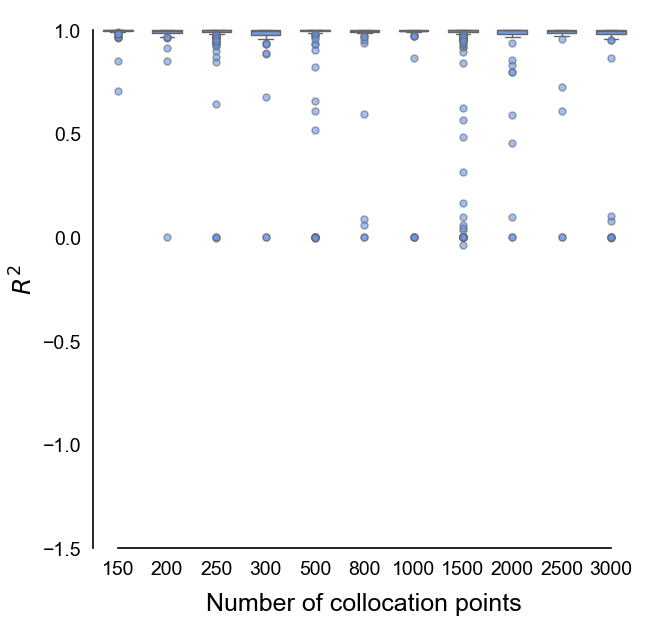

In [159]:
set_consistent_style()
plt.figure(figsize=(7,7))

# Ensure numeric order of layers
order = sorted(df['config/n_collocation'].unique())

# Boxplot with nicer palette
sns.boxplot(
    x='config/n_collocation', 
    y='R2_val', 
    data=df,
    order=order,
    color="cornflowerblue",   # or "Set2", "coolwarm", etc.
    width=0.6,
    showfliers=True,flierprops=dict(marker='o', markerfacecolor='cornflowerblue',

                    markersize=5, alpha=0.6)     # hide extreme outliers for clarity
)



# Labels and limits
#plt.title(r"$R^2$ vs. Number of collocation points", fontsize=18, pad=15)
plt.xlabel("Number of collocation points", fontsize=18,labelpad=10)
plt.ylabel(r"$R^2$", fontsize=18)
plt.ylim(-1.5, 1.1)

# Clean up axes
sns.despine(trim=True)

plt.savefig("R2_vs_n_collocation.pdf", dpi=300, bbox_inches='tight')
plt.show()

# Ideas to Try


- check if all the RC that have the same tau are the same, or it is frequent dependant the behaboir of them so r*10c==10r*c or not
- add boundary conditions to the eq
- add boundary conditions in the form of $dV/dt=0$ (find in $V_i$), apply to $V_{i+1}$ at the time $t+a\tau$
